<a href="https://colab.research.google.com/github/heejjj/Health_Bio_AI/blob/main/CNN_practice_0524.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 컴퓨터 비전 파이프라인

<img src='https://freecontent.manning.com/wp-content/uploads/Elgendy_tCVPp1_02.png'>

__MNIST Dataset__

---


* 0 ~ 9의 글씨 데이터
* 28$\times$28 grayscale 이미지
* Train data : 60,000, Test data : 10,000  

<figure>
    <img src='https://images.deepai.org/custom-datasets/images/80c67fa1229744fdae147f18240ab04d/mnist.png' width=300 height=300>
</figure>
  

### Multi-Layer Perceptron

<figure>
<img src="https://www.kdnuggets.com/wp-content/uploads/deep-neural-network.jpg" width=400>
</figure>

<figure>
<img src="https://image.slidesharecdn.com/random-170910154045/95/-49-1024.jpg?cb=1505089848" width=1500>
</figure>

출처 : https://image.slidesharecdn.com/random-170910154045/95/-49-1024.jpg?cb=1505089848

참고 : https://hiddenbeginner.github.io/deeplearning/2019/09/22/optimization_algorithms_in_deep_learning.html

참고 : https://ganghee-lee.tistory.com/24

# Confusion Matrix

Confusion Matrix(오차 행렬) : Confusion Matrix는 이진 분류의 예측 오류가 얼마인지, 또 어떠한 유형의 예측 오류가 발생하고 있는지를 나타낸 지표

- True Positive(TP) : 정답이 P인데 모델도 P라고 예측한 경우
- True Negative(TN) : 정답이 N인데 모델도 N이라고 예측한 경우
- False Positive(FP) : 정답이 N인데 모델은 P라고 잘못 예측한 경우
- False Negative(FN) : 정답이 P인데 모델은 N이라고 잘못 예측한 경우


<figure>
<img src="https://img1.daumcdn.net/thumb/R720x0.q80/?scode=mtistory2&fname=http%3A%2F%2Fcfile22.uf.tistory.com%2Fimage%2F99DC064C5BE056CE106BC1" width=600>
</figure>

- Accuracy(정확도)
    - Accuracy는 가장 기본적인 분류 메트릭으로 (TP+TN) / (TP+TN+FP+FN)으로 계산
    - Accuracy는 모델이 얼마나 데이터를 잘 분류했느냐, 즉 분류 결과가 얼마나 True로 나왔느냐를 보여줌
    - 정확도는 일반적으로 분류 모델의 주요 평가 지표로 쓰이지만, 클래스의 비율이 불균형할 경우 신뢰도가 떨어진다는 단점
- Precision(정밀도)
    - Precision은 모델이 P라고 예측한 것 중에서 실제 얼마나 P를 맞췄는지를 나타내는 메트릭으로 TP / (TP+FP)으로 계산
    - Precision은 N인 데이터가 더 중요할 경우, 즉 실제로 N인 데이터를 P라고 판단하면 안 될 때 많이 사용
    - 스팸 메일을 분류할 때, 일반 메일(N)을 스팸 메일(P)로 잘못 분류하면 중요한 메일을 읽지 못하게 될 수 있음
- Recall(재현율)
    - Recall은 실제 P인 데이터 중에서 모델이 얼마나 P를 맞췄는지를 나타내는 메트릭으로 TP / (TP+FN)으로 계산
    - Recall은 P인 데이터가 더 중요할 경우, 즉 실제로 P인 데이터를 N이라고 판단하면 안 될 때 사용
    - 종양의 종류를 판단할 때, 악성 종양(P)을 음성 종양(N)으로 잘못 분류하면 생명이 위급해질 수 있음
- AUC : binary classificaion의 decision에 있어 얼마나 confidence가 정확한지 측정이 가능한 메트릭


- 평가 메트릭의 선택
    - 평가 메트릭은 주어진 문제나 문제를 풀어서 해결하고자 하는 목표에 따라 적절하게 선택해야 함

**참고하면 좋을 블로그(https://velog.io/@crescent702/%EB%B2%88%EC%97%AD-Evaluation-Metrics-for-Machine-Learning-Models)

## Convolutional Neural network 

- MNIST
- Fashion MNIST
- cifar 10
- cifar 100

In [ ]:
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers

num_classes = 10
input_shape = (28,28,1)

(X_train,y_train),(X_test,y_test) = keras.datasets.mnist.load_data()

11490434/11490434 [==============================] - 2s 0us/step


데이터를 로딩합니다!


데이터 image data -> (R+G+B) / 3-> 0~ 255숫자-> 픽셀

픽셀-> 딥러닝-> 0$~$255까지의 숫자가 너무 큼.->normlization (0~1로 바꿔줌)

In [ ]:
X_train = X_train.astype('float32') / 255 #가장 큰 수로 나눠주면 ->가장 큰값 1 image >0 ->0~1로 됨.
#image<0 -> X_ray or CT or MRI(-1000 ~ 1000)
X_test = X_test.astype('float32') / 255

In [ ]:
X_train.shape

(60000, 28, 28)

(60000 : image 갯수) 28 : row / 28:col

In [ ]:
X_train = X_train.reshape(X_train.shape[0],28,28,1) # X_train.shape[0] : image 수,28*28*1 reshape을 하겠다.
X_test = X_test.reshape(X_test.shape[0],28,28,1)

In [ ]:
X_train.shape

(60000, 28, 28, 1)

In [ ]:
# y_train = keras.utils.to_categorical(y_train, num_classes)
# y_test = keras.utils.to_categorical(y_test, num_classes)

In [ ]:
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Dropout,Dense,Flatten
from tensorflow.keras.models import Sequential
model =  Sequential()
model.add(Conv2D(32, kernel_size = (3,3), activation = 'relu', input_shape = (28,28,1)))
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Conv2D(64,kernel_size = (3,3), activation = 'relu'))
model.add(MaxPooling2D(pool_size = (2,2)))
model.add(Flatten()) #쭉 펼쳐주기.
model.add(Dropout(0.3))
model.add(Dense(num_classes, activation='softmax'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 26, 26, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 13, 13, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 11, 11, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 5, 5, 64)         0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 1600)              0         
                                                                 
 dropout (Dropout)           (None, 1600)              0

In [ ]:
model = keras.Sequential([
                          layers.Conv2D(32,kernel_size=(3,3),activation='relu', input_shape = (28, 28, 1)),
                                        layers.MaxPooling2D(pool_size=(2,2)),
                                        layers.Conv2D(64,kernel_size=(3,3),activation='relu'),
                                        layers.MaxPooling2D(pool_size=(2,2)),
                                        layers.Flatten(),
                                        layers.Dropout(0.5), #가지치기 0.5비율로 랜덤하게 가지치기
                                        #파라미터가 많아서.
                                        layers.Dense(num_classes,activation='softmax') #num_classes = 10
                                        ])

In [ ]:
import time

start_time = time.time()
batch_size = 512
epoch =30
model.compile(loss='sparse_categorical_crossentropy',optimizer = 'adam',metrics = ['accuracy'])
hist = model.fit(X_train,y_train,batch_size=batch_size, epochs=epoch, validation_split=0.1)
print(f'Fit time:{time.time() - start_time}')

Epoch 1/30
106/106 [==============================] - 12s 14ms/step - loss: 0.7652 - accuracy: 0.7738 - val_loss: 0.1611 - val_accuracy: 0.9590
Epoch 2/30
106/106 [==============================] - 1s 9ms/step - loss: 0.1954 - accuracy: 0.9417 - val_loss: 0.0929 - val_accuracy: 0.9763
Epoch 3/30
106/106 [==============================] - 1s 10ms/step - loss: 0.1336 - accuracy: 0.9597 - val_loss: 0.0720 - val_accuracy: 0.9813
Epoch 4/30
106/106 [==============================] - 1s 10ms/step - loss: 0.1064 - accuracy: 0.9674 - val_loss: 0.0609 - val_accuracy: 0.9843
Epoch 5/30
106/106 [==============================] - 1s 10ms/step - loss: 0.0934 - accuracy: 0.9721 - val_loss: 0.0548 - val_accuracy: 0.9852
Epoch 6/30
106/106 [==============================] - 1s 9ms/step - loss: 0.0837 - accuracy: 0.9741 - val_loss: 0.0542 - val_accuracy: 0.9858
Epoch 7/30
106/106 [==============================] - 1s 9ms/step - loss: 0.0755 - accuracy: 0.9768 - val_loss: 0.0471 - val_accuracy: 0.9877
E

<function matplotlib.pyplot.show(*args, **kw)>

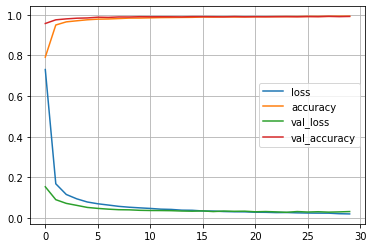

In [ ]:
import matplotlib.pyplot as plt

plot_target = ['loss','accuracy','val_loss','val_accuracy']
plt.figure()
for each in plot_target:
    plt.plot(hist.history[each],label=each)
plt.legend()
plt.grid()
plt.show

ㅌ

In [ ]:
score = model.evaluate(X_test,y_test)
print(f'Test Loss : {score[0]}')
print(f'Test Accuracy : {score[1]}')

313/313 [==============================] - 1s 3ms/step - loss: 0.0264 - accuracy: 0.9915
Test Loss : 0.026418715715408325
Test Accuracy : 0.9915000200271606


## 데이터 예측

In [ ]:
import numpy as np
predicted_result = model.predict(X_test)
predicted_labels = np.argmax(predicted_result,axis=1)
predicted_labels[:10]

313/313 [==============================] - 1s 2ms/step


array([7, 2, 1, 0, 4, 1, 4, 9, 5, 9])

## 틀린 데이터 모으기

In [ ]:
wrong_result = []
for n in range(0,len(y_test)):
    if predicted_labels[n] !=y_test[n]:
        wrong_result.append(n)
len(wrong_result)

85

## 틀린 데이터 16개만 직접 그려보기

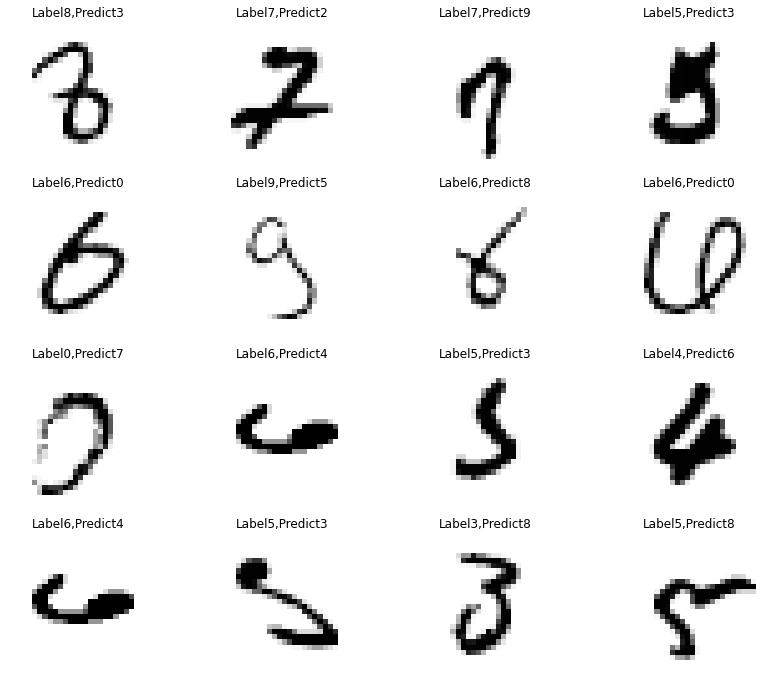

In [ ]:
import random

samples = random.choices(population = wrong_result,k=16)

plt.figure(figsize=(14,12))

for idx,n in enumerate(samples):
    plt.subplot(4,4,idx+1)
    plt.imshow(X_test[n].reshape(28,28), cmap = 'Greys',interpolation='nearest')
    plt.title('Label' +str(y_test[n]) + ',Predict'+ str(predicted_labels[n]))
    plt.axis('off')
plt.show()

### MNIST with class

In [ ]:
keras.__version__

'2.8.0'

In [ ]:
from keras import layers,models
class CNN(models.Sequential):
    def __init__(self, input_shape, num_classes):
        super().__init__()

        self.add(layers.Conv2D(32, kernel_size=(3, 3),
                 activation='relu',
                 input_shape=input_shape))
        self.add(layers.Conv2D(64, (3, 3), activation='relu'))
        self.add(layers.MaxPooling2D(pool_size=(2, 2)))
        self.add(layers.Dropout(0.25))
        self.add(layers.Flatten())
        self.add(layers.Dense(128, activation='relu'))
        self.add(layers.Dropout(0.5))
        self.add(layers.Dense(num_classes, activation='softmax'))

        self.compile(loss=keras.losses.categorical_crossentropy,
                      optimizer='rmsprop',
                      metrics=['accuracy'])

In [ ]:
# Dataset 준비
from tensorflow import keras
from keras import datasets
from keras import backend 

class DATA():
    def __init__(self):
        num_classes = 10

        (x_train, y_train), (x_test, y_test) = datasets.mnist.load_data()
        img_rows, img_cols = x_train.shape[1:]

        if backend.image_data_format() == 'channels_first':
            x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols)
            x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols)
            input_shape = (1, img_rows, img_cols)
        else:
            x_train = x_train.reshape(x_train.shape[0], img_rows, img_cols, 1)
            x_test = x_test.reshape(x_test.shape[0], img_rows, img_cols, 1)
            input_shape = (img_rows, img_cols, 1)

        x_train = x_train.astype('float32')
        x_test = x_test.astype('float32')
        x_train /= 255
        x_test /= 255

        y_train = keras.utils.to_categorical(y_train, num_classes)
        y_test = keras.utils.to_categorical(y_test, num_classes)
        
        self.input_shape = input_shape
        self.num_classes = num_classes
        self.x_train, self.y_train = x_train, y_train
        self.x_test, self.y_test = x_test, y_test  

In [ ]:
def plot_acc(history, title=None, show_flag=False):
    # summarize history for accuracy
    if not isinstance(history, dict): #isinstance : 파이썬 자료형을 확인하는 것.
        history = history.history
    plt.plot(history['accuracy'])
    plt.plot(history['val_accuracy'])
    if title is not None:
        plt.title(title)
    plt.xlabel('Epoch')
    plt.ylabel('Accracy')
    plt.legend(['Training', 'Validation'], loc=0)
    if show_flag:
        plt.show()
def plot_loss(history, title=None, show_flag=False):
    # summarize history for loss
    if not isinstance(history, dict):
        history = history.history

    plt.plot(history['loss'])
    plt.plot(history['val_loss'])
    if title is not None:
        plt.title(title)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend(['Training', 'Validation'], loc=0)
    if show_flag:
        plt.show()    


def plot_history(history):
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plot_acc(history)
    plt.subplot(1, 2, 2)
    plot_loss(history)
 
def plot_loss_acc(history):
    plot_loss(history, '(a) Loss trajectory')
    plt.show()            
    plot_acc(history, '(b) Accracy trajectory')
    plt.show()
def plot_acc_loss(history):
    plot_acc(history, '(a) Accracy trajectory')
    plt.show()
    plot_loss(history, '(b) Loss trajectory')
    plt.show()            

Epoch 1/10
375/375 [==============================] - 3s 5ms/step - loss: 0.2490 - accuracy: 0.9254 - val_loss: 0.0690 - val_accuracy: 0.9800
Epoch 2/10
375/375 [==============================] - 2s 4ms/step - loss: 0.0862 - accuracy: 0.9752 - val_loss: 0.0659 - val_accuracy: 0.9813
Epoch 3/10
375/375 [==============================] - 2s 4ms/step - loss: 0.0662 - accuracy: 0.9808 - val_loss: 0.0445 - val_accuracy: 0.9879
Epoch 4/10
375/375 [==============================] - 2s 4ms/step - loss: 0.0564 - accuracy: 0.9834 - val_loss: 0.0425 - val_accuracy: 0.9882
Epoch 5/10
375/375 [==============================] - 2s 4ms/step - loss: 0.0480 - accuracy: 0.9860 - val_loss: 0.0376 - val_accuracy: 0.9892
Epoch 6/10
375/375 [==============================] - 2s 4ms/step - loss: 0.0438 - accuracy: 0.9869 - val_loss: 0.0380 - val_accuracy: 0.9886
Epoch 7/10
375/375 [==============================] - 2s 4ms/step - loss: 0.0419 - accuracy: 0.9879 - val_loss: 0.0430 - val_accuracy: 0.9888
Epoch 

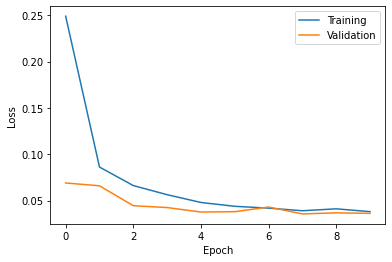

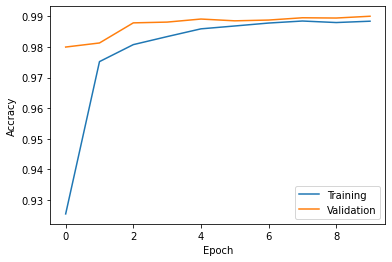

In [ ]:
batch_size = 128
epochs = 10

data = DATA()
model = CNN(data.input_shape, data.num_classes)

history = model.fit(data.x_train, data.y_train,
          batch_size=batch_size,
          epochs=epochs,
          validation_split=0.2)

score = model.evaluate(data.x_test, data.y_test)
print()
print('Test loss:', score[0])
print('Test accuracy:', score[1])

plot_loss(history)
plt.show()
plot_acc(history)
plt.show()

### Dropout

- 신경망이 지니고 있는 단점인 과적합과 Gradient Vanishing을 완화시킬 수 있는 알고리즘.  

- 신경망의 학습 과정 중 Layer의 노드를 랜덤하게 Drop함으로써 Generalization 효과를 가져오게 하는 테크닉.  

-  경험적으로 합성곱 신경망의 전결합층에 적용하는 것이 효과가 좋다고 알려져 있다.

[방법]   
  Input layer의 Column에 랜덤하게 0을 넣음.   
  Weight Matrix에 랜덤하게 일부 Column에 0을 집어넣어 연산. 
<figure>
<img src='https://miro.medium.com/max/1044/1*iWQzxhVlvadk6VAJjsgXgg.png' width=500>
</figure>

### Batch Normalization

* Internal Covariate Shift
 : 네트워크의 학습 도중에 파라미터의 변화로 인한 네트워크 Activation(출력)들의 분포 변화
* 기존의 여러 연구 결과들은 입력값들이 Whitening된다(zero Mean & Unit Variance)면, 뉴럴넷이 훨씬 빠르게 수렴할 것이라고 말하고 있다. 
* 이러한 방법은 Gradient Descent Step의 효과를 줄이는 결과를 초래
* 또한 Backpropagation 방법도 복잡함
* Mini batch 단위로 다음을 수행.  
$BN(x;\gamma,\beta)=\beta+\gamma\dfrac{x-E(x)}
{\sqrt{Var(x)+\epsilon}}$
* BN은 학습 속도를 향상시켜주고 Gradient Vanishing 문제도 완화시켜줌.
* 자세한 내용(https://hcnoh.github.io/2018-11-27-batch-normalization)

### Loss function

Multi-class classification에서 많이 사용되는 softmax -> cross entropy loss

<figure>
<img src='https://miro.medium.com/max/738/1*z5zL8kz7TPW1y3okAjuvBA.jpeg' width=500>
</figure>

### PyTorch의 장점
1. Python의 인기있는 라이브러리 패키지를 사용하여 Python에서 신경망 레이어를 쉽게 작성 가능.
2. 그래프 계산을 위한 동적 접근: Tensorflow의 딥러닝 프레임워크는 전산 그래프를 미리 작성해야 하는 정적 그래프에서 작동. 계산식을 임의로 표현한 후에 GPU로 전송하여 블랙박스처럼 처리. 그러나 PyTorch 같은 동적 접근 방식에서는 모든 계산과 진행 단계를 완벽하게 파악할 수 있음.   

<figure>
<img src='https://mblogthumb-phinf.pstatic.net/MjAxNzA2MTRfNDcg/MDAxNDk3NDM5NzU1NTU2.bWThN8_GorrSIE1xSivP_sgdUTMRCJa1d-N9XyXj7TYg.BJq2bPkpUjRlpwINTgM27PvdkgkuDTvzb8HdQZzA0agg.PNG.fastcampus/sdfads.PNG?type=w800'>
</figure>

3. PyTorch 코드를 자유롭게 디버깅할 수 있는 Python 디버그 도구 사용 가능.
4. Torch.nn.DataParallel을 사용하여 모듈 래핑. 여러 GPU를 쉽게 사용할 수 있도록 해줌.
5. Auto-grad : backward()를 통해 모든 변수의 grad를 바로 계산.  
tesnsorflow에도 tf.gradient라는 자동 gradient 계산함수가 있지만 이것은 x.grad, y.grad = tf.gradient(c,[x,y,z]) 라고 선언하여 정의한 뒤, tf.Session을 이용해서 실제 계산까지도 해야 함.

### Fashion MNIST

#### 모델 구성하기

4422102/4422102 [==============================] - 0s 0us/step
Fashion-MNIST ready~


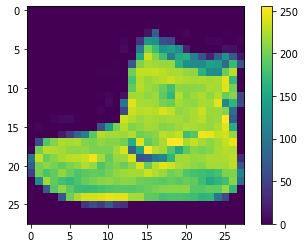

In [ ]:
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.utils import to_categorical

# 데이터를 다운받습니다.
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

import matplotlib.pyplot as plt
import numpy as np
np.random.seed(777)

#라벨링을 미리 해둠.
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

sample_size = 9
# 0 ~ 59999의 범위에서 무작위로 3개의 정수를 뽑습니다.
random_idx = np.random.randint(60000, size=sample_size)

import matplotlib.pyplot as plt
plt.figure()
plt.imshow(x_train[0])
plt.colorbar()
plt.grid(False)

# 0 ~ 1 범위로 만듭니다.
x_train = x_train / 255.0
x_test = x_test / 255.0

# from tensorflow.keras.utils import to_categorical
# # 각 데이터의 레이블을 범주형 형태로 변경합니다.
# y_train = to_categorical(y_train)
# y_test = to_categorical(y_test)

# 검증 데이터셋을 만듭니다.
from sklearn.model_selection import train_test_split

# # 훈련/테스트 데이터를 0.7/0.3의 비율로 분리합니다.
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,test_size = 0.3, random_state = 777)
print('Fashion-MNIST ready~')

#### 모델 구성하기

- filters : 몇 개의 다른 종류의 필터를 활용한 것인지를 나타냄. 출력 모양의 깊이(depth)를 결정함.
- kernel_size : 연산을 수행할 때 윈도우의 크기를 의미.
- stride : 연산을 수행할때 윈도우가 가로 그리고 세로로 움직이면서 내적 연산을 수행하는데, 한 번에 얼마나 움직일지를 의미.

In [ ]:
import numpy as np

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPool2D, Dense, Flatten, BatchNormalization

np.random.seed(487)

model = Sequential()
model.add(Conv2D(filters = 16, kernel_size = 3,strides = (1,1), padding ='same', activation = 'relu', input_shape = (28,28,1)))
# model.add(Conv2D(filters = 16, kernel_size = 3,strides = (1,1), padding ='valid', activation = 'relu', input_shape = (28,28,1)))
# model.add(Conv2D(16,(3,3),padding="same" or valid(default), strides=(1, 1)(default) activation = 'relu', input_shape=(28,28,1)))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size = (2,2), strides=2, padding = 'valid'))
model.add(Conv2D(filters = 32, kernel_size = 3,strides = (1,1), padding ='same', activation = 'relu'))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size = (2,2), strides=2, padding = 'same'))
model.add(Conv2D(filters = 32, kernel_size = 3,strides = (1,1), padding ='same', activation = 'relu'))
model.add(MaxPool2D(pool_size = (2,2), strides=2, padding = 'same'))
model.add(Flatten()) # Dense 층에 입력하기 위해 데이터를 펼쳐줍니다.
model.add(Dense(64, activation = 'relu')) #Fully Connecteced
model.add(Dense(10, activation = 'softmax')) # 10개의 출력을 가지는 신경망
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_22 (Conv2D)          (None, 28, 28, 16)        160       
                                                                 
 batch_normalization_14 (Bat  (None, 28, 28, 16)       64        
 chNormalization)                                                
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 14, 14, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_23 (Conv2D)          (None, 14, 14, 32)        4640      
                                                                 
 batch_normalization_15 (Bat  (None, 14, 14, 32)       128       
 chNormalization)                                                
                                                      

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense, Flatten,BatchNormalization

# 이전과 다르게 리스트 형태로 층을 구성해볼 수 있습니다.
model = Sequential([
    # 항상 모델의 첫 번째 층은 입력의 형태를 명시해주어야 합니다.
    Conv2D(filters = 16, kernel_size = 3, strides = (1, 1), padding = 'same', activation = 'relu', input_shape = (28, 28, 1)), #widthXheightXChannel
    BatchNormalization(),
    MaxPool2D(pool_size = (2, 2), strides = 2, padding = 'same'), #maxpooing에서 반절이 줄어듬  
    Conv2D(filters = 32, kernel_size = 3, strides = (1, 1), padding = 'same', activation = 'relu'), #Depth를 늘림.
    BatchNormalization(),
    MaxPool2D(pool_size = (2, 2), strides = 2, padding = 'same'), 
    Conv2D(filters = 64, kernel_size = 3, strides = (1, 1), padding = 'same', activation = 'relu'),
    MaxPool2D(pool_size = (2, 2), strides = 2, padding = 'same'), 
    Flatten(), # Dense 층에 입력하기 위해 데이터를 펼쳐줍니다.
    Dense(64, activation = 'relu'),
    Dense(10, activation = 'softmax') # 10개의 출력을 가지는 신경망
])

In [ ]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 28, 28, 16)        160       
                                                                 
 batch_normalization_12 (Bat  (None, 28, 28, 16)       64        
 chNormalization)                                                
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 14, 14, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 14, 14, 32)        4640      
                                                                 
 batch_normalization_13 (Bat  (None, 14, 14, 32)       128       
 chNormalization)                                                
                                                      

#### 모델 학습하기

In [ ]:
!pip install jupyter-tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


만약 이코드가 없으면 loss = 'sparse_categorical_crossentropy'로 바뀌어야 함. 

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
import datetime
import tensorflow as tf

# 학습데이터의 log를 저장할 폴더 생성 (지정)
log_dir = "logs/my_board/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

# 텐서보드 콜백 정의 하기
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
model.compile(optimizer = 'adam', 
              loss = 'sparse_categorical_crossentropy', 
              metrics = ['acc'])
# model.fit(x_train, y_train, epochs = 100, validation_data=(x_val,y_val))
train_model = model.fit(x_train, y_train, epochs = 50, batch_size  = 32, validation_split=0.1, callbacks=[tensorboard_callback])

Epoch 1/50
1182/1182 [==============================] - 8s 6ms/step - loss: 0.4348 - acc: 0.8423 - val_loss: 0.3240 - val_acc: 0.8838
Epoch 2/50
1182/1182 [==============================] - 11s 9ms/step - loss: 0.2918 - acc: 0.8920 - val_loss: 0.3463 - val_acc: 0.8712
Epoch 3/50
1182/1182 [==============================] - 10s 9ms/step - loss: 0.2501 - acc: 0.9079 - val_loss: 0.2832 - val_acc: 0.8952
Epoch 4/50
1182/1182 [==============================] - 9s 8ms/step - loss: 0.2220 - acc: 0.9181 - val_loss: 0.2588 - val_acc: 0.9064
Epoch 5/50
1182/1182 [==============================] - 10s 8ms/step - loss: 0.2048 - acc: 0.9252 - val_loss: 0.2878 - val_acc: 0.8921
Epoch 6/50
1182/1182 [==============================] - 6s 5ms/step - loss: 0.1887 - acc: 0.9299 - val_loss: 0.2514 - val_acc: 0.9083
Epoch 7/50
1182/1182 [==============================] - 5s 5ms/step - loss: 0.1688 - acc: 0.9379 - val_loss: 0.2886 - val_acc: 0.9026
Epoch 8/50
1182/1182 [==============================] - 6s 

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

# sparse_categorical_crossentropy 를 쓰려면 원핫 인코딩으로 바꾸면 안된다. 라벨 인코딩을 바로 받아들여 sparse하게 받아들이기 때문에, 에러가 남

# to_categorical 하게 바꾼다음에 작동시킬려면 categorical_crossentropy로 써야 함.

#### plot_model 함수를 사용합니다

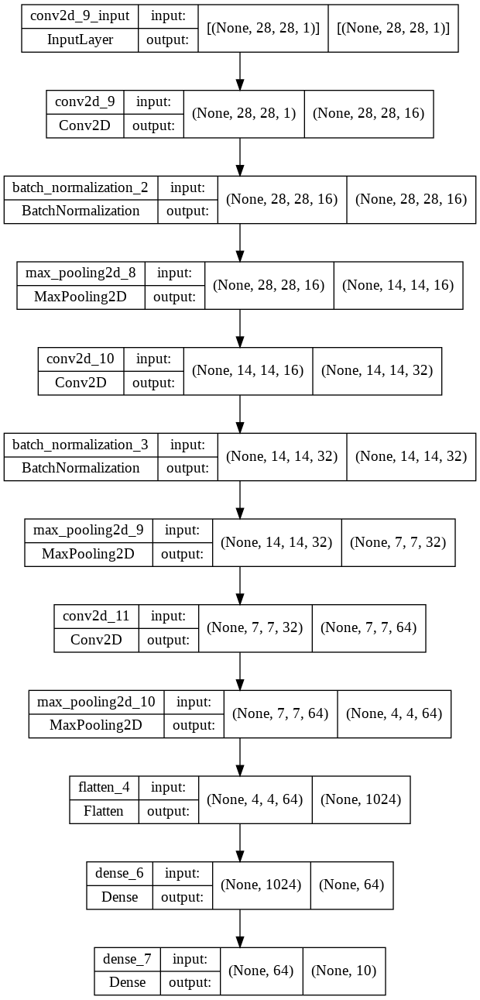

In [ ]:
# 각주의 해결 방법을 써도 통하지 않는 다면, 다음 코드의 주석을 풀어 실행시키세요.
# import os
# os.environ["PATH"] += os.pathsep + 'C:/Program Files (x86)/Graphviz2.38/bin'

from tensorflow.keras.utils import plot_model
plot_model(model, './model.png', show_shapes=True)

#정확도 평가

(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()


In [ ]:
test_loss, test_acc = model.evaluate(x_test,y_test,verbose=1) #verbose=0 결과 생략 verbose = 1 : progress bar / verbose=2 : 결과만

313/313 [==============================] - 1s 2ms/step - loss: 0.7110 - acc: 0.9066


##  예측하기

In [ ]:
probability_model = tf.keras.Sequential([model, 
                                         tf.keras.layers.Softmax()])

In [ ]:
predictions = probability_model.predict(x_test)

In [ ]:
predictions[0]

array([0.08533674, 0.08533674, 0.08533674, 0.08533674, 0.08533674,
       0.08533674, 0.08533674, 0.08533674, 0.08533674, 0.2319693 ],
      dtype=float32)

In [ ]:
np.argmax(predictions[0])

9

In [ ]:
np.argmax(y_test[0])

0

# 학습결과 plot

In [ ]:
def plot_image(i, predictions_array, true_label, img):
  true_label, img = true_label[i], img[i]
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  plt.imshow(img, cmap=plt.cm.binary)

  predicted_label = np.argmax(predictions_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                100*np.max(predictions_array),
                                class_names[true_label]),
                                color=color)

def plot_value_array(i, predictions_array, true_label):
  true_label = true_label[i]
  plt.grid(False)
  plt.xticks(range(10))
  plt.yticks([])
  thisplot = plt.bar(range(10), predictions_array, color="#777777")
  plt.ylim([0, 1])
  predicted_label = np.argmax(predictions_array)

  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('blue')

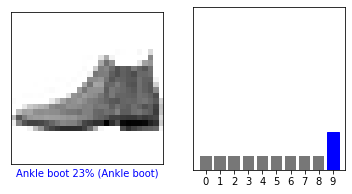

In [ ]:
%matplotlib inline
i = 0
plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
plot_image(i, predictions[i], y_test, x_test)
plt.subplot(1,2,2)
plot_value_array(i, predictions[i],  y_test)
plt.show()

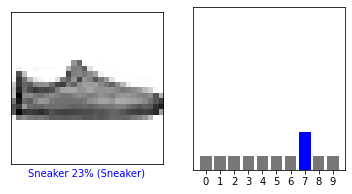

In [ ]:
i = 12
plt.figure(figsize=(6,3))
plt.subplot(1,2,1)
plot_image(i, predictions[i],y_test, x_test)
plt.subplot(1,2,2)
plot_value_array(i, predictions[i],  y_test)
plt.show()

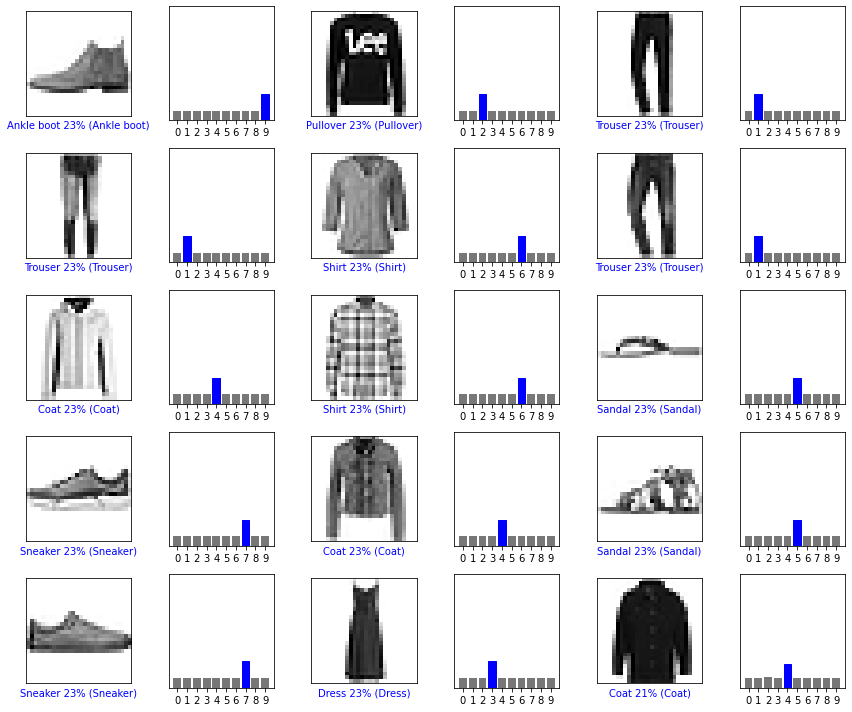

In [ ]:
# Plot the first X test images, their predicted labels, and the true labels.
# Color correct predictions in blue and incorrect predictions in red.
num_rows = 5
num_cols = 3
num_images = num_rows*num_cols
plt.figure(figsize=(2*2*num_cols, 2*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_image(i, predictions[i], y_test, x_test)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_value_array(i, predictions[i], y_test)
plt.tight_layout()
plt.show()

## LeNet-5

<img src='https://t1.daumcdn.net/cfile/tistory/99170D4C5C7E21250E'>|

- CNN을 처음으로 개발한 얀 르쿤(Yann Lecun)연구팀이 1998년에 개발한 CNN 
알고리즘의 이름.
- Gradient-based learning applied to document recognition


1) C1 layer : 입력 영상(여기서는 32X32 사이즈의 이미지)을 6개의 5X5 필터와 컨볼루션 연산을 해줌. 그 결과 6장의 28X28 특성 맵을 얻게 됨.

- 훈련해야 될 파라미터의 개수 : (가중치$\times$ 입력맵 개수+바이어스)*특성맵 개수 = (5$\times$ 5 $\times$ 1+1)$\times$6 = 156

2) S2 layer : 6장의 28X28 특성 맵에 대해 서브샘플링을 진행함. 결과적으로 28X28 사이즈의 특성 맵이 14X14 사이즈의 특성맵으로 축소 됨.
- 2X2 필터를 stride 2로 설정해서 서브샘플링을 해줌. 사용하는 서브샘플링 방법은 average pooling

 - 훈련해야 될 파라미터의 개수 : (가중치+바이어스)*특성맵 개수 = (1+1)$\times$6 = 12

 - 왜 평균 풀링을 사용을 하였는가 ? 논문에 의하면 평균을 낸 다음에 한 개의 훈련 가능한 가중치(trainable wight)를 곱해주고 또 한 개의 훈련가능한 바이어스(trainable bias)를 더해준다고 한다. 그 값이 시그모이드 함수를 통해 활성화 됨. 그 가중치와 바이어스는 시그모이드의 비 활성도를 조절해줌.

3) C3 레이어: 6장의 14 x 14 특성맵에 컨볼루션 연산을 수행해서 16장의 10 x 10 특성맵을 산출해낸다.

- 6장의 14 x 14 특성맵에서 연속된 3장씩을 모아서 5 x 5 x 3 사이즈의 필터와 컨볼루션 해준다(그림2에서 열0-5). 6장의 10 x 10 특성맵이 산출된다. 

- 또한 6장의 14 x 14 특성맵에서 연속된 4장씩을 모아서 5 x 5 x 4 사이즈의 필터와 컨볼루션 해준다(그림2에서 열6-11). 6장의 10 x 10 특성맵이 산출된다. 

- 또한 6장의 14 x 14 특성맵에서 불연속한 4장씩을 모아서 5 x 5 x 4 사이즈의 필터와 컨볼루션 해준다(그림2에서 열12-14). 3장의 10 x 10 특성맵이 산출된다.  

- 마지막으로 6장의 14 x 14 특성맵 모두를 가지고 5 x 5 x 6 사이즈의 필터와 컨볼루션 해준다(그림2에서 열15). 1장의 10 x 10 특성맵이 산출된다.

- 결과적으로 16장(6 + 6 + 3 + 1)의 10 x 10 특성맵을 얻게 되었다. 

<img src='https://t1.daumcdn.net/cfile/tistory/9902AD375C7F2B3E1A'>

훈련해야할 파라미터 개수: 

첫번째그룹=> (가중치*입력맵개수+바이어스)*특성맵 개수 = (5*5*3 + 1)*6 = 456

두번째그룹=> (가중치*입력맵개수+바이어스)*특성맵 개수 = (5*5*4 + 1)*6 = 606

세번째그룹=> (가중치*입력맵개수+바이어스)*특성맵 개수 = (5*5*4 + 1)*3 = 303

네번째그룹=> (가중치*입력맵개수+바이어스)*특성맵 개수 = (5*5*6 + 1)*1 = 151

456 + 606 + 303 + 151 = 1516

4) S4 레이어: 16장의 10 x 10 특성 맵에 대해서 서브샘플링을 진행해 16장의 5 x 5 특성 맵으로 축소시킨다. 

훈련해야할 파라미터 개수: (가중치 + 바이어스)*특성맵개수 = (1 + 1)*16 = 32

5) C5 레이어: 16장의 5 x 5 특성맵을 120개 5 x 5 x 16 사이즈의 필터와 컨볼루션 해준다. 결과적으로 120개 1 x 1 특성맵이 산출된다. 

훈련해야할 파라미터 개수: (가중치*입력맵개수 + 바이어스)*특성맵 개수 = (5*5*16 + 1)*120 = 48120

6) F6 레이어: 84개의 유닛을 가진 피드포워드 신경망이다. C5의 결과를 84개의 유닛에 연결시킨다. 

훈련해야할 파라미터 개수: 연결개수 = (입력개수 + 바이어스)*출력개수 = (120 + 1)*84 = 10164

7) 아웃풋 레이어: 10개의 Euclidean radial basis function(RBF) 유닛들로 구성되어있다. 각각 F6의 84개 유닛으로부터 인풋을 받는다. 최종적으로 이미지가 속한 클래스를 알려준다. 



LeNet-5를 제대로 가동하기 위해 훈련해야할 파라미터는 총 156 + 12 + 1516 + 32 + 48120 + 10164 = 60000개다. 

- 풀링층은 중요한 특징은 유지하면서 해상도를 떨어뜨리는 효과를 갖음.
    - 풀링과 스트라이드를 사용하는 주 목적은 신경망의 파라미터 수를 줄이는 것. -> 계산량이 많아지므로
    - 합성곱층의 스트라이드와 패딩을 잘 조절하면 풀링이 불필요하다는 의견도 많음.
    - 논문 [Starving for Simplicity : The All convolutional net]  에서는 풀링층을 완전히 배제하고 합성곱층만을 사용해서 합성곱 신경망을 제시한다.
    - 이 논문의 저자는 표현의 크기를 줄일 수 있도록 중간 중간 스트라이드를 크게 설정한 합성곱층을 배치하면 된다고 설명함.
    - 구조(아키텍쳐)에서 적은 수의 풀링층만을 사용하거나 아예 사용하지 않을 가능성이 높다. 현재는 합성곱층 사이에 이미지 다운샘플링을 위한 풀링층을 배치하는 것이 일반적이다.

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D,AveragePooling2D, Flatten,Dense

model = Sequential() #비어 있는 순차형 모델 객체 생성

#합성곱층 C1
model.add(Conv2D(filters=6, kernel_size=5, strides=1, activation='tanh',input_shape=(28,28,1),padding="SAME"))

#풀링층 S2
model.add(AveragePooling2D(pool_size=2, strides=2, padding = 'valid'))

#합성곱층 C3
model.add(Conv2D(filters=16, kernel_size=5, strides=1, activation='tanh',padding="valid"))

#풀링층 S4
model.add(AveragePooling2D(pool_size=2, strides=2, padding = 'valid'))

#합성곱층 C5
model.add(Conv2D(filters=120, kernel_size=5, strides=1, activation='tanh',padding="valid"))

model.add(Flatten())

#완전연결망 FC6
model.add(Dense(units=84, activation='tanh'))

#softmax를 활성화 함수로 사용하는 출력층 FC7
model.add(Dense(units=10, activation = 'softmax'))

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 28, 28, 6)         156       
                                                                 
 average_pooling2d (AverageP  (None, 14, 14, 6)        0         
 ooling2D)                                                       
                                                                 
 conv2d_13 (Conv2D)          (None, 10, 10, 16)        2416      
                                                                 
 average_pooling2d_1 (Averag  (None, 5, 5, 16)         0         
 ePooling2D)                                                     
                                                                 
 conv2d_14 (Conv2D)          (None, 1, 1, 120)         48120     
                                                                 
 flatten_5 (Flatten)         (None, 120)              

- 파라미터 계산 방법
    - 파라미터 수 = 필터 수 X 커널 크기 X 이전 층 출력의 깊이+필터수
    - ex) model.add(Conv2D(64,(3,3),strides=1, padding='same', activation='relu')) -> 64X3X3X32+64 (이전 층의 출력의 깊이는 32이다.)

# AlexNet

- 더욱 복잡한 문제를 해결할 수 있도록 층수가 더 많은 신경망을 제시.

- 2012년 ILSVRC(ImageNet Large Scale Visual Recognition Challenge) 이미지 분류 콘테스트에서 우승을 차지함.

- ImageNet : 1000개의 클래스를 구분하는 것이고, Train :120만개, Validation : 5만개 / 학습데이터 : 약 138G, 검증데이터 : 6G

<img src='https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Ft1.daumcdn.net%2Fcfile%2Ftistory%2F99FEB93C5C80B5192E'>

- AlexNet은 8개의 레이어로 구성되어 있다. 5개의 컨볼루션 레이어와 3개의 full-connected 레이어로 구성되어 있다. 두번째, 네번째, 다섯번째 컨볼루션 레이어들은 전 단계의 같은 채널의 특성맵들과만 연결되어 있는 반면, 세번째 컨볼루션 레이어는 전 단계의 두 채널의 특성맵들과 모두 연결되어 있다는 것

1) 첫번째 레이어(컨볼루션 레이어): 96개의 11 x 11 x 3 사이즈 필터커널로 입력 영상을 컨볼루션해준다. 컨볼루션 보폭(stride)를 4로 설정했고, zero-padding은 사용하지 않았다. zero-padding은 컨볼루션으로 인해 특성맵의 사이즈가 축소되는 것을 방지하기 위해, 또는 축소되는 정도를 줄이기 위해 영상의 가장자리 부분에 0을 추가하는 것이다. 결과적으로 55 x 55 x 96 특성맵(96장의 55 x 55 사이즈 특성맵들)이 산출된다. 그 다음에 ReLU 함수로 활성화해준다. 이어서 3 x 3 overlapping max pooling이 stride 2로 시행된다. 그 결과 27 x 27 x 96 특성맵을 갖게 된다. 그 다음에는 수렴 속도를 높이기 위해 local response normalization이 시행된다. local response normalization은 특성맵의 차원을 변화시키지 않으므로, 특성맵의 크기는 27 x 27 x 96으로 유지된다. 

2) 두번째 레이어(컨볼루션 레이어): 256개의 5 x 5 x 48 커널을 사용하여 전 단계의 특성맵을 컨볼루션해준다. stride는 1로, zero-padding은 2로 설정했다. 따라서 27 x 27 x 256 특성맵(256장의 27 x 27 사이즈 특성맵들)을 얻게 된다. 역시 ReLU 함수로 활성화한다. 그 다음에 3 x 3 overlapping max pooling을 stride 2로 시행한다. 그 결과 13 x 13 x 256 특성맵을 얻게 된다. 그 후 local response normalization이 시행되고, 특성맵의 크기는 13 x 13 x 256으로 그대로 유지된다. 

3) 세번째 레이어(컨볼루션 레이어): 384개의 3 x 3 x 256 커널을 사용하여 전 단계의 특성맵을 컨볼루션해준다. stride와 zero-padding 모두 1로 설정한다. 따라서 13 x 13 x 384 특성맵(384장의 13 x 13 사이즈 특성맵들)을 얻게 된다. 역시 ReLU 함수로 활성화한다

 

4) 네번째 레이어(컨볼루션 레이어): 384개의 3 x 3 x 192 커널을 사용해서 전 단계의 특성맵을 컨볼루션해준다. stride와 zero-padding 모두 1로 설정한다. 따라서 13 x 13 x 384 특성맵(384장의 13 x 13 사이즈 특성맵들)을 얻게 된다. 역시 ReLU 함수로 활성화한다. 

 

5) 다섯번째 레이어(컨볼루션 레이어): 256개의 3 x 3 x 192 커널을 사용해서 전 단계의 특성맵을 컨볼루션해준다. stride와 zero-padding 모두 1로 설정한다. 따라서 13 x 13 x 256 특성맵(256장의 13 x 13 사이즈 특성맵들)을 얻게 된다. 역시 ReLU 함수로 활성화한다. 그 다음에 3 x 3 overlapping max pooling을 stride 2로 시행한다. 그 결과 6 x 6 x 256 특성맵을 얻게 된다. 

 

6) 여섯번째 레이어(Fully connected layer): 6 x 6 x 256 특성맵을 flatten해줘서 6 x 6 x 256 = 9216차원의 벡터로 만들어준다. 그것을 여섯번째 레이어의 4096개의 뉴런과 fully connected 해준다. 그 결과를 ReLU 함수로 활성화한다. 

 

7) 일곱번째 레이어(Fully connected layer): 4096개의 뉴런으로 구성되어 있다. 전 단계의 4096개 뉴런과 fully connected되어 있다. 출력 값은 ReLU 함수로 활성화된다. 

 

8) 여덟번째 레이어(Fully connected layer): 1000개의 뉴런으로 구성되어 있다. 전 단계의 4096개 뉴런과 fully connected되어 있다. 1000개 뉴런의 출력값에 softmax 함수를 적용해 1000개 클래스 각각에 속할 확률을 나타낸다. 

 

### AlexNet 좀 더 깊게 들여다보기

1) ReLU 함수: 활성화 함수로는 LeNet-5에서 사용되었던 Tanh 함수 대신에 ReLU 함수가 사용되었다. ReLU는 rectified linear unit의 약자이다. 같은 정확도를 유지하면서 Tanh을 사용하는 것보다 6배나 빠르다고 한다. AlexNet 이후에는 활성화함수로 ReLU 함수를 사용하는 것이 선호되고 있다. 

<img src='https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FcexrVz%2FbtqBFwoUz96%2F6E1W6ALGpm3EfkJykHPFak%2Fimg.jpg'>

<img src='https://production-media.paperswithcode.com/methods/Screen_Shot_2020-05-27_at_4.23.22_PM_dcuMBJl.png'>

2) dropout: 과적합(over-fitting)을 막기 위해서 규제 기술의 일종인 dropout을 사용했다. dropout이란 fully-connected layer의 뉴런 중 일부를 생략하면서 학습을 진행하는 것이다[5]. 몇몇 뉴런의 값을 0으로 바꿔버린다. 따라서 그 뉴런들은 forward pass와 back propagation에 아무런 영향을 미치지 않는다. dropout은 훈련시에 적용되는 것이고, 테스트시에는 모든 뉴런을 사용한다. 

<img src='https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FcMcWkE%2FbtqBFNcRhiv%2FjJyZWvbf9uQLmKJG3pQAK1%2Fimg.jpg'>

3) overlapping pooling: CNN에서 pooling의 역할은 컨볼루션을 통해 얻은 특성맵의 크기를 줄이기 위함이다. LeNet-5의 경우 평균 풀링(average pooling)이 사용된 반면, AlexNet에서는 최대 풀링(max pooling)이 사용되었다. 또한 LeNet-5의 경우 풀링 커널이 움직이는 보폭인 stride를 커널 사이즈보다 작게 하는 overlapping pooling을 적용했다. 따라서 정확히 말하면 LeNet-5는 non-overlapping 평균 풀링을 사용한 것이고, AlexNet은 overlapping 최대 풀링을 사용한 것이다. 

 

overlapping 풀링과 non-overlapping 풀링을 비교한 그림은 아래와 같다. 

<img src='https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2Fb5hfOx%2FbtqBCUY3kpE%2FCKcK19bmDgtkSkWS5GPkBk%2Fimg.png'>

4) local response normalization (LRN): 신경생물학에는 lateral inhibition이라고 불리는 개념이 있다. 활성화된 뉴런이 주변 이웃 뉴런들을 억누르는 현상을 의미한다. lateral inhibition 현상을 모델링한 것이 바로 local response normalization이다. 강하게 활성화된 뉴런의 주변 이웃들에 대해서 normalization을 실행한다. 주변에 비해 어떤 뉴런이 비교적 강하게 활성화되어 있다면, 그 뉴런의 반응은 더욱더 돋보이게 될 것이다. 반면 강하게 활성화된 뉴런 주변도 모두 강하게 활성화되어 있다면, local response normalization 이후에는 모두 값이 작아질 것이다. 

5) data augmentation: 과적합을 막기 위해 dropout 말고도 또다른 방법이 사용되었다. 과적합을 막는 가장 좋은 방법 중 하나는 데이터의 양을 늘리는 것이다. 훈련시킬 때 적은 양의 데이터를 가지고 훈련시킬 경우 과적합될 가능성이 크기 때문이다. 따라서 AlexNet의 개발자들은 data augmentation이란 방법을 통해 데이터의 양을 늘렸다. 

<img src='https://img1.daumcdn.net/thumb/R1280x0/?scode=mtistory2&fname=https%3A%2F%2Fblog.kakaocdn.net%2Fdn%2FviqCJ%2FbtqBD1C97Ax%2FVRY44kp7K8Y1VpqNdu7fJk%2Fimg.png'>

- 논문의 figure 에서는 input_shape = (224,224,3)이지만 코드에서는 (227,227,3)이다. 그 이유는 논문의 figure가 오타가 있는것으로 밝혀졌다. 뒤에 있는 layer들의 shape맞춰줄려면 (227,227,3)의 shape이 맞다.

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D,AveragePooling2D,Flatten,Dense,Activation,MaxPool2D,BatchNormalization,Dropout
from keras.regularizers import l2

In [ ]:
model = Sequential(name='AlexNet')

#1st layer(conv+pool+batchnorm)
model.add(Conv2D(filters=94,kernel_size=(11,11),strides=(4,4),padding='valid',activation='relu',kernel_regularizer=l2(0.0005),input_shape=(224,224,3)))
model.add(MaxPool2D(pool_size=(3,3),strides=(2,2),padding='valid'))
model.add(BatchNormalization())

#2nd layer(conv+pool+batchnrom)
model.add(Conv2D(filters=256,kernel_size=(5,5),strides=(1,1),padding='same',activation='relu',kernel_regularizer=l2(0.0005)))
model.add(MaxPool2D(pool_size=(3,3),strides=(2,2),padding='valid'))
model.add(BatchNormalization())

#Layer 3(conv+batchnrom)
model.add(Conv2D(filters=384,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu',kernel_regularizer=l2(0.0005)))
model.add(BatchNormalization())

#Layer 4(conv+batchnrom)
model.add(Conv2D(filters=384,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu',kernel_regularizer=l2(0.0005)))
model.add(BatchNormalization())

#layer 5(conv+batchnrom)
model.add(Conv2D(filters=256,kernel_size=(3,3),strides=(1,1),padding='same',activation='relu',kernel_regularizer=l2(0.0005)))
model.add(BatchNormalization())
model.add(MaxPool2D(pool_size=(3,3),strides=(2,2),padding='valid'))

#Flatten the CNN output to feed it with fully connected layers
model.add(Flatten())

# layer 6 (Dense layer + dropout)  
model.add(Dense(units = 4096, activation = 'relu'))
model.add(Dropout(0.5))

# layer 7 (Dense layers) 
model.add(Dense(units = 4096, activation = 'relu'))
model.add(Dropout(0.5))
                           
# layer 8 (softmax output layer) 
model.add(Dense(units = 1000, activation = 'softmax'))

# print the model summary
model.summary()

Model: "AlexNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 54, 54, 94)        34216     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 26, 26, 94)       0         
 )                                                               
                                                                 
 batch_normalization (BatchN  (None, 26, 26, 94)       376       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 26, 26, 256)       601856    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 12, 12, 256)      0         
 2D)                                                             
                                                           

## MNIST dataset with LeNet

In [ ]:
from keras.datasets import mnist

(X_train,y_train),(X_test,y_test) = mnist.load_data()

print('MNIST training set %d examples.' %len(X_train))
print('MNIST test set %d examples.' %len(X_test))

MNIST training set 60000 examples.
MNIST test set 10000 examples.


- Visualize

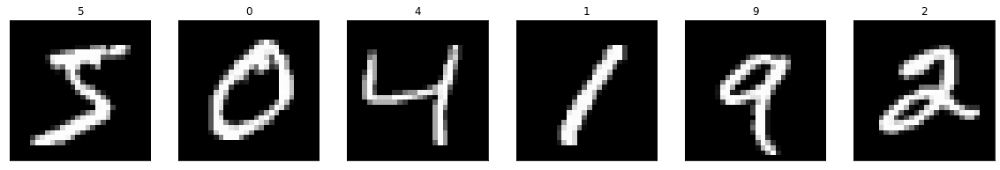

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

fig = plt.figure(figsize=(20,20))
for i in range(6):
    ax = fig.add_subplot(1,6,i+1,xticks=[],yticks=[])
    ax.imshow(X_train[i],cmap='gray')
    ax.set_title(str(y_train[i]))

- View and image in More Detail

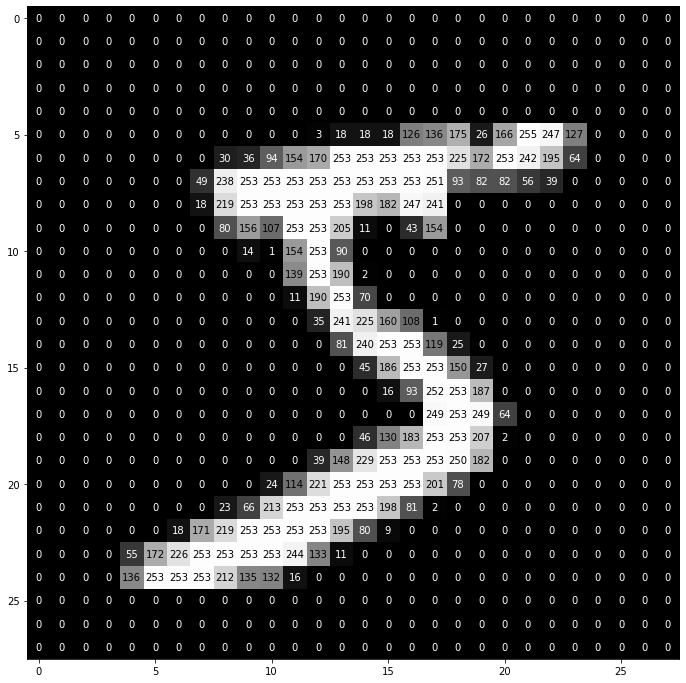

In [ ]:
def visualze_input(img,ax):
    ax.imshow(img,cmap='gray')
    width,height = img.shape
    thresh = img.max()/2.5
    for x in range(width):
        for y in range(height):
             ax.annotate(str(round(img[x][y],2)), xy=(y,x),
                        horizontalalignment='center',
                        verticalalignment='center',
                        color='white' if img[x][y]<thresh else 'black')
fig = plt.figure(figsize=(12,12))
ax = fig.add_subplot(111)
visualze_input(X_train[0],ax)

- Preprocess input images : Rescale the Images by Dividing Every Pixel in Every image by 255

In [ ]:
#normalize the data to accelerate learning
mean = np.mean(X_train)
std = np.std(X_train)
X_train =(X_train-mean)/(std+1e-7)
X_test =(X_test-mean)/(std+1e-7)

print('X_train shape :', X_train.shape)
print(X_train.shape[0], 'train samples')
print(X_test.shape[0],'test_samples')

X_train shape : (60000, 28, 28)
60000 train samples
10000 test_samples


- Preprocess the labels : Encode Categorical Integer Lables Using a Ont-hot Scheme

In [ ]:
from keras.utils import np_utils

num_classes = 10
print('Integer-values labels:')
print(y_train[:10])

#ont-hot encoding the labels
#convert class vector to binary classd matrices
y_train = np_utils.to_categorical(y_train,num_classes)
y_test = np_utils.to_categorical(y_test,num_classes)

print('Ont-hot lables:')
print(y_train[:10])

Integer-values labels:
[5 0 4 1 9 2 1 3 1 4]
Ont-hot lables:
[[0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]]


- Reshape data to fit out CNN(and input_shape)

In [ ]:
#input image dimension 28X28 pixel images
img_rows,img_cols = 28,28

X_train = X_train.reshape(X_train.shape[0],img_rows,img_cols,1)
X_test = X_test.reshape(X_test.shape[0],img_rows,img_cols,1)
input_shape = (img_rows,img_cols,1)

print('image input shape:',input_shape)
print('X_train shape:',X_train.shape)

image input shape: (28, 28, 1)
X_train shape: (60000, 28, 28, 1)


- Define the Model Architecture

 <img src='https://github.com/moelgendy/deep_learning_for_vision_systems/raw/2c9d077b43003657cd8f6d5ddfb6f83ee8bae1f3/chapter_05/images/lenet_architecture.png'>
 
 - 32X32가 아니라 28X28임 (현재 MINST를 하는중)

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D,AveragePooling2D, Flatten,Dense

model = Sequential() #비어 있는 순차형 모델 객체 생성

#합성곱층 C1
model.add(Conv2D(filters=6, kernel_size=5, strides=1, activation='tanh',input_shape=(28,28,1),padding="same"))

#풀링층 S2
model.add(AveragePooling2D(pool_size=2, strides=2, padding = 'valid'))

#합성곱층 C3
model.add(Conv2D(filters=16, kernel_size=5, strides=1, activation='tanh',padding="valid"))

#풀링층 S4
model.add(AveragePooling2D(pool_size=2, strides=2, padding = 'valid'))

#합성곱층 C5
model.add(Conv2D(filters=120, kernel_size=5, strides=1, activation='tanh',padding="valid"))

model.add(Flatten())

#완전연결망 FC6
model.add(Dense(units=84, activation='tanh'))

#softmax를 활성화 함수로 사용하는 출력층 FC7
model.add(Dense(units=10, activation = 'softmax'))

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_20 (Conv2D)          (None, 28, 28, 6)         156       
                                                                 
 average_pooling2d_2 (Averag  (None, 14, 14, 6)        0         
 ePooling2D)                                                     
                                                                 
 conv2d_21 (Conv2D)          (None, 10, 10, 16)        2416      
                                                                 
 average_pooling2d_3 (Averag  (None, 5, 5, 16)         0         
 ePooling2D)                                                     
                                                                 
 conv2d_22 (Conv2D)          (None, 1, 1, 120)         48120     
                                                                 
 flatten_7 (Flatten)         (None, 120)              

- Compile the Model

In [ ]:
model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

- Train the Model

LeCun and his team used scheduled decay learning where the value of the learning rate was decreased using the following schedule: 0.0005 for the first two epochs, 0.0002 for the next three epochs, 0.00005 for the next four, and then 0.00001 thereafter. In the paper, the authors trained their network for 20 epochs.

- Scheduler 참고 : https://lcyking.tistory.com/87

In [ ]:
from keras.callbacks import ModelCheckpoint,LearningRateScheduler

#Set the learning rate schedule as oreated in the original paper
def lr_schedule(epoch):
    if epoch<=2:
        lr=5e-4
    elif epoch>2 and epoch<=5:
        lr=2e-4
    elif epoch>5 and epoch<=9:
        lr=5e-5
    else:
        lr=1e-5
    return lr
lr_scheduler = LearningRateScheduler(lr_schedule)

#Set the checkpointer
checkpoint = ModelCheckpoint(filepath = 'model.weights.best.hdf5',verbose=1,save_best_only=True)

#train the model
hist = model.fit(X_train,y_train,batch_size=32, epochs=20,validation_data=(X_test,y_test),
                 callbacks = [checkpoint,lr_scheduler],verbose=2,shuffle=True)

Epoch 1/20

Epoch 1: val_loss improved from inf to 0.09153, saving model to model.weights.best.hdf5
1875/1875 - 6s - loss: 0.2401 - accuracy: 0.9295 - val_loss: 0.0915 - val_accuracy: 0.9728 - lr: 5.0000e-04 - 6s/epoch - 3ms/step
Epoch 2/20

Epoch 2: val_loss improved from 0.09153 to 0.06235, saving model to model.weights.best.hdf5
1875/1875 - 5s - loss: 0.0767 - accuracy: 0.9765 - val_loss: 0.0623 - val_accuracy: 0.9810 - lr: 5.0000e-04 - 5s/epoch - 3ms/step
Epoch 3/20

Epoch 3: val_loss improved from 0.06235 to 0.05619, saving model to model.weights.best.hdf5
1875/1875 - 5s - loss: 0.0525 - accuracy: 0.9838 - val_loss: 0.0562 - val_accuracy: 0.9815 - lr: 5.0000e-04 - 5s/epoch - 3ms/step
Epoch 4/20

Epoch 4: val_loss improved from 0.05619 to 0.03690, saving model to model.weights.best.hdf5
1875/1875 - 5s - loss: 0.0324 - accuracy: 0.9904 - val_loss: 0.0369 - val_accuracy: 0.9871 - lr: 2.0000e-04 - 5s/epoch - 3ms/step
Epoch 5/20

Epoch 5: val_loss did not improve from 0.03690
1875/1875

- Load model with Best Classification Accuracy on the Validation set

In [ ]:
from tensorflow import keras 

model = keras.models.load_model('/content/model.weights.best.hdf5')

In [ ]:
score = model.evaluate(X_test,y_test,verbose=0)
accuracy=100*score[1]
print('Test accuracy: %.4f%%' %accuracy)

Test accuracy: 99.0200%


- evaluate the model

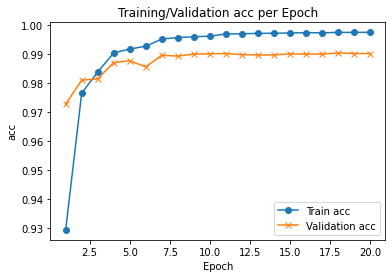

In [ ]:
import matplotlib.pyplot as plt

f, ax = plt.subplots()
ax.plot([None] + hist.history['accuracy'], 'o-')
ax.plot([None] + hist.history['val_accuracy'], 'x-')
# Plot legend and use the best location automatically: loc = 0.
ax.legend(['Train acc', 'Validation acc'], loc = 0)
ax.set_title('Training/Validation acc per Epoch')
ax.set_xlabel('Epoch')
ax.set_ylabel('acc')
plt.show()

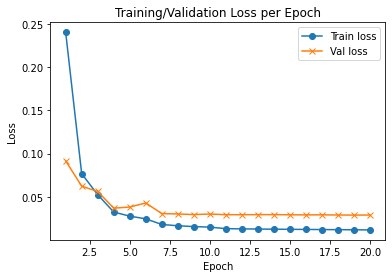

In [ ]:
import matplotlib.pyplot as plt

f, ax = plt.subplots()
ax.plot([None] + hist.history['loss'], 'o-')
ax.plot([None] + hist.history['val_loss'], 'x-')

# Plot legend and use the best location automatically: loc = 0.
ax.legend(['Train loss', "Val loss"], loc = 0)
ax.set_title('Training/Validation Loss per Epoch')
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
plt.show()

# CIFAR-10 

발음을 조심해야하는 이름을 가진 CIFAR-10 dataset은 32x32픽셀의 60000개 컬러이미지가 포함되어있으며, 각 이미지는 10개의 클래스로 라벨링이 되어있습니다.
또한, MNIST와 같이 머신러닝 연구에 가장 널리 사용되는 dataset중 하나입니다.

<figure>
<img src='https://user-images.githubusercontent.com/15958325/63308580-41b7fe80-c32e-11e9-827f-98052675c0ea.png'>
</figure>

<img src='https://user-images.githubusercontent.com/15958325/63317956-c23b2700-c34f-11e9-82c2-6a40787579ec.png'>
</figure>

<img src='https://user-images.githubusercontent.com/15958325/63318014-f0206b80-c34f-11e9-9321-a1959b48b7fe.png'>
</figure>

### Train on CIFAR-10 dataset

load CIFAR 10 dataset

- CIFAR-10은 총 10개의 레이블로 이루어진 6만장의 이미지를 가지고 있으며 5만장은 트레이닝, 1만장은 테스트 용도로 쓰입니다. 해당 데이터셋은 http://www.cs.toronto.edu/~kriz/cifar.html 에서 다운로드 받으실 수 있습니다.

The dataset is comprised of 60,000 32×32 pixel color photographs of objects from 10 classes, such as frogs, birds, cats, ships, etc. The class labels and their standard associated integer values are listed below.

- 0: airplane
- 1: automobile
- 2: bird
- 3: cat
- 4: deer
- 5: dog
- 6: frog
- 7: horse
- 8: ship
- 9: truck

In [ ]:
# 사용할 라이브러리 불러오기
import numpy as np
# 숫자 -> One-hot Vector 를 위한 라이브러리
from keras.utils import np_utils
# CIFAR-10 Dataset을 가져오기 위한 라이브러리
from keras.datasets import cifar10#, mnist
# 순차적인 모델을 만들기 위한 Sequential 함수
from keras.models import Sequential
# CNN 및 MLP에 필요한 각 층들
from keras.layers import Dense, Activation
from keras.layers import Conv2D, MaxPooling2D, Flatten
# 드롭아웃 적용을 위한 층
from keras.layers import Dropout
# 배치 정규화 적용을 위한 층
from keras.layers import BatchNormalization
# L2 정규화를 위한 라이브러리
from keras.regularizers import l2
# Google Colab에서 이미지를 보기 위한 cv2_imshow 함수
from google.colab.patches import cv2_imshow

170498071/170498071 [==============================] - 11s 0us/step
x_train : (50000, 32, 32, 3)
y_train : (50000, 1)
x_test : (10000, 32, 32, 3)
y_test : (10000, 1)


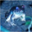

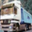

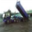

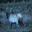

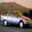

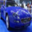

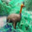

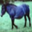

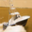

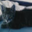

In [ ]:
# CIFAR-10 Dataset 가져오기
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
print('x_train :', np.shape(x_train))
print('y_train :', np.shape(y_train))
print('x_test :', np.shape(x_test))
print('y_test :', np.shape(y_test))
# 한 번 Training Dataset의 이미지 10개 정도 봅시다
for i in range(10):
  cv2_imshow(x_train[i])

In [ ]:
# Loss의 스케일 조정을 위해 0 ~ 255 -> 0 ~ 1 범위로 만들어줍니다
x_train = x_train.astype('float32') / 255.0
x_test = x_test.astype('float32') / 255.0
# 이번엔 Test Dataset을 Validation Set으로 써봅니다
# One-Hot Encoding (숫자 -> One-Hot Vector) 
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)
print('y_train :', np.shape(y_train))

y_train : (50000, 10)


In [ ]:
num_classes=10
input_shape=(32,32,3)

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D,AveragePooling2D, Flatten,Dense

model = Sequential() #비어 있는 순차형 모델 객체 생성

#합성곱층 C1
model.add(Conv2D(filters=6, kernel_size=5, strides=1, activation='tanh',input_shape=input_shape,padding="SAME"))

#풀링층 S2
model.add(AveragePooling2D(pool_size=2, strides=2, padding = 'valid'))

#합성곱층 C3
model.add(Conv2D(filters=16, kernel_size=5, strides=1, activation='tanh',padding="valid"))

#풀링층 S4
model.add(AveragePooling2D(pool_size=2, strides=2, padding = 'valid'))

#합성곱층 C5
model.add(Conv2D(filters=120, kernel_size=5, strides=1, activation='tanh',padding="valid"))

model.add(Flatten())

#완전연결망 FC6
model.add(Dense(units=84, activation='tanh'))

#softmax를 활성화 함수로 사용하는 출력층 FC7
model.add(Dense(units=10, activation = 'softmax'))

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 6)         456       
                                                                 
 average_pooling2d (AverageP  (None, 16, 16, 6)        0         
 ooling2D)                                                       
                                                                 
 conv2d_1 (Conv2D)           (None, 12, 12, 16)        2416      
                                                                 
 average_pooling2d_1 (Averag  (None, 6, 6, 16)         0         
 ePooling2D)                                                     
                                                                 
 conv2d_2 (Conv2D)           (None, 2, 2, 120)         48120     
                                                                 
 flatten (Flatten)           (None, 480)               0

In [ ]:
model.compile(loss = 'categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

- keras의 callback함수.
 - ModelCheckpoint : 모든 epoch마다 모델을 저장하는 것은 비효율적이니, validation set이 기존의 최고 성능 모델에 비해 낮아질때만 저장되도록 설정.
 
 - EarlyStopping : 딥러닝 모델이 과적합되기 시작하면 점점 새로운 데이터에서의 예측 성능이 신뢰하기 어려워지기 때문에 학습을 진행하다가 검증 세트에서의 손실이 더 이상 감소하지 않으면 학습을 중단하는 방법을 사용할 수 있음. 케라스에서는 이를 위해 EarlyStopping이라는 콜백(Callback) 함수를 제공.

 - callback : 특정 조건에서 자동으로 실행되는 함수. 

 - 먼저 모니터링할 지표와 몇번의 에포크를 기다리고 조기 종료할지를 각각 monitor 파라미터와 patience파라미터를 통해 지정해서 EarlyStopping객체를 생성. 그 다음 fit메서드의 callback 하이퍼 파리미터에 리스트 형태로 조금 전 생성한 EarlyStopping 객체를 전달해주면 간단히 콜백 함수가 적용이 됨.


- 학습률은 가장 중요한 하이퍼파라미터로, 항상 잘 조정되어 있어야 한다. 단 하나의 하이퍼파라미터를 조정할 시간 밖에 주어지지 않는다면, 학습률을 조정해야 한다. -> 요수아 벤지오

In [ ]:
from keras.callbacks import ModelCheckpoint,LearningRateScheduler,EarlyStopping

#Set the learning rate schedule as oreated in the original paper
def lr_schedule(epoch):
    if epoch<=2:
        lr=5e-4
    elif epoch>2 and epoch<=5:
        lr=2e-4
    elif epoch>5 and epoch<=9:
        lr=5e-5
    else:
        lr=1e-5
    return lr
lr_scheduler = LearningRateScheduler(lr_schedule)

early_stopping = EarlyStopping(monitor='val_loss',patience=2)

#Set the checkpointer
checkpoint = ModelCheckpoint(filepath = 'model.weights.best.hdf5',verbose=1,save_best_only=True)

#train the model
hist = model.fit(x_train,y_train,batch_size=32, epochs=20,validation_data=(x_test,y_test),
                 callbacks = [checkpoint,lr_scheduler,early_stopping],verbose=2,shuffle=True)

Epoch 1/20

Epoch 1: val_loss improved from inf to 1.70699, saving model to model.weights.best.hdf5
1563/1563 - 38s - loss: 1.7933 - accuracy: 0.3657 - val_loss: 1.7070 - val_accuracy: 0.4054 - lr: 5.0000e-04 - 38s/epoch - 24ms/step
Epoch 2/20

Epoch 2: val_loss improved from 1.70699 to 1.55892, saving model to model.weights.best.hdf5
1563/1563 - 33s - loss: 1.6164 - accuracy: 0.4322 - val_loss: 1.5589 - val_accuracy: 0.4519 - lr: 5.0000e-04 - 33s/epoch - 21ms/step
Epoch 3/20

Epoch 3: val_loss improved from 1.55892 to 1.48488, saving model to model.weights.best.hdf5
1563/1563 - 31s - loss: 1.4996 - accuracy: 0.4730 - val_loss: 1.4849 - val_accuracy: 0.4736 - lr: 5.0000e-04 - 31s/epoch - 20ms/step
Epoch 4/20

Epoch 4: val_loss improved from 1.48488 to 1.42238, saving model to model.weights.best.hdf5
1563/1563 - 32s - loss: 1.4027 - accuracy: 0.5065 - val_loss: 1.4224 - val_accuracy: 0.4969 - lr: 2.0000e-04 - 32s/epoch - 21ms/step
Epoch 5/20

Epoch 5: val_loss improved from 1.42238 to 1

- Load model with Best Classification Accuracy on the Validation set

In [ ]:
score = model.evaluate(x_test,y_test,verbose=0)
accuracy=100*score[1]
print('Test accuracy: %.4f%%' %accuracy)

Test accuracy: 53.0200%


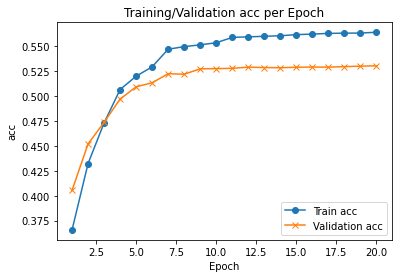

In [ ]:
import matplotlib.pyplot as plt

f, ax = plt.subplots()
ax.plot([None] + hist.history['accuracy'], 'o-')
ax.plot([None] + hist.history['val_accuracy'], 'x-')
# Plot legend and use the best location automatically: loc = 0.
ax.legend(['Train acc', 'Validation acc'], loc = 0)
ax.set_title('Training/Validation acc per Epoch')
ax.set_xlabel('Epoch')
ax.set_ylabel('acc')
plt.show()

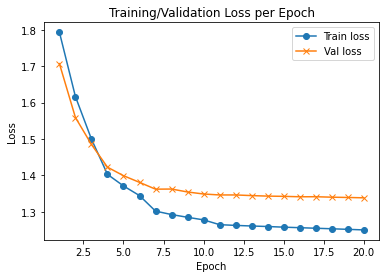

In [ ]:
import matplotlib.pyplot as plt

f, ax = plt.subplots()
ax.plot([None] + hist.history['loss'], 'o-')
ax.plot([None] + hist.history['val_loss'], 'x-')

# Plot legend and use the best location automatically: loc = 0.
ax.legend(['Train loss', "Val loss"], loc = 0)
ax.set_title('Training/Validation Loss per Epoch')
ax.set_xlabel('Epoch')
ax.set_ylabel('Loss')
plt.show()

# cifar10 with Alexnet

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt


from keras.datasets import cifar10,cifar100
from keras.models import Sequential
from keras.layers import Dense,Conv2D,Dropout,Flatten,MaxPooling2D
from keras.constraints import maxnorm #매개변수에 제약.ex)kernel_constraint: 주요 가중치 행렬에 대해서 제약.
from tensorflow.keras.optimizers import SGD,Adam
from keras.callbacks import ModelCheckpoint, LearningRateScheduler,ReduceLROnPlateau,EarlyStopping
from keras.regularizers import L2
from keras import backend as K
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator

import skimage
from skimage.util import img_as_ubyte

In [ ]:
os.getcwd()

'/content'

In [ ]:
#Defining Variables

#Data set information
DATASET = 'cifar-10'
#DATASET = 'cifar-100'
input_shape=(32,32,3)

if DATASET == 'cifar-10':
  num_classes = 10
elif DATASET == 'cifar-100':
  num_classes = 100

#Model Parameters

model_type = 'Alexnet'

epochs = 25
lrate = 0.01
decay = lrate/epochs #lrate *decay(1)*decay(2)
batch_size = 32

data_augmentation = True
flow_from_dir = False #cifar10->keras

subtract_mean = True #batch=32->mean->반영해달라.
seed = 7
np.random.seed(seed)
#현재 path ->content
validate_dir = os.path.join("data","test") #path를 data폴더에 test를 연결해주세요.
train_dir = os.path.join("data","train")#path를 data폴더에 train를 연결해주세요.

# Prepare model model saving directory.
#현재 디렉토리 : os.getcwd()
save_dir = os.path.join(os.getcwd(), 'saved_models') #content +saved_models

#model_name = 'cifar10_%s_model.{epoch:03d}.h5' % model_type
model_name = DATASET+'_'+'%s_model.{epoch:03d}.h5' % model_type

if not os.path.isdir(save_dir):
    os.makedirs(save_dir)
filepath = os.path.join(save_dir, model_name)
print("Model Type: ",model_type)
print("Model File: ",filepath)

Model Type:  Alexnet
Model File:  /content/saved_models/cifar-10_Alexnet_model.{epoch:03d}.h5


In [ ]:
if flow_from_dir:
  if DATASET == 'cifar-10':
    %pip install cifar2png # CIFAR-10 또는 CIFAR-100 데이터 세트를 PNG 이미지로 변환합니다.
    %cifar2png cifar10 "data"

170498071/170498071 [==============================] - 13s 0us/step


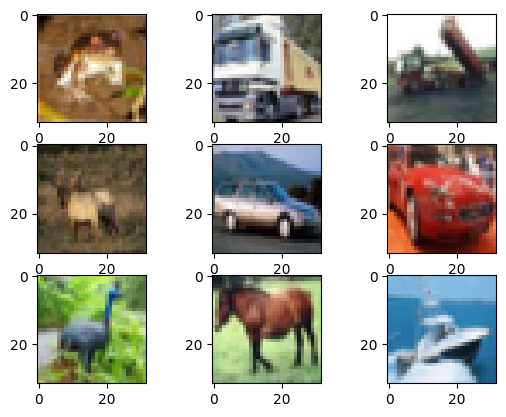

In [ ]:
if not flow_from_dir:
  #load data
  if DATASET == 'cifar-10':
    (X_train, y_train),(X_test,y_test) = cifar10.load_data()
    X_train.shape, X_test.shape, X_train.shape[1:],X_train.dtype
  elif DATASET == 'cifar-100':
    (X_train, y_train),(X_test,y_test) = cifar100.load_data()
    X_train.shape, X_test.shape, X_train.shape[1:],X_train.dtype

  #Plot data
  for i in range(0,9):
    plt.subplot(330+1+i)
    plt.imshow(X_train[i])
  plt.show() 

In [ ]:
def convert_to_imagenet_size(images):
  tmp_images = []
  for image in images:
    image = skimage.transform.resize(image,(224,224),mode='constant')
    image = img_as_ubyte(image)
    tmp_images.append(image)
  return np.array(tmp_images)

In [ ]:
#Data Normalization
if not flow_from_dir: #True
  if not data_augmentation: #False
    X_train = X_train.astype('float32')
    X_test = X_test.astype('float32')
    X_train = X_train/255.
    X_test = X_test/255.

    if subtract_mean:
      X_train_mean = np.mean(X_train)
      X_train -= X_train_mean
      X_test_mean = np.mean(X_test)
      X_test -= X_test_mean

  print(y_train.shape, y_test.shape)

(50000, 1) (10000, 1)


In [ ]:
flow_from_dir

False

In [ ]:
if not data_augmentation: #False
    print('a')


In [ ]:
if not flow_from_dir: #True
    print('a')

a


In [ ]:
if not flow_from_dir:
  y_train = np_utils.to_categorical(y_train)
  y_test = np_utils.to_categorical(y_test)
  print(y_train.shape, y_test.shape)

(50000, 10) (10000, 10)


In [ ]:
#num_classes = y_train.shape[1]
#input_shape=X_train.shape[1:]

input_shape,num_classes

((32, 32, 3), 10)

In [ ]:
#Define Alexnet Model
def AlexnetModel(input_shape,num_classes):
  model = Sequential()
  model.add(Conv2D(filters=96,kernel_size=(3,3),strides=(4,4),input_shape=input_shape, activation='relu'))
  model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  model.add(Conv2D(256,(5,5),padding='same',activation='relu'))
  model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))
  model.add(Conv2D(384,(3,3),padding='same',activation='relu'))
  model.add(Conv2D(384,(3,3),padding='same',activation='relu'))
  model.add(Conv2D(256,(3,3),padding='same',activation='relu'))
  model.add(MaxPooling2D(pool_size=(2,2),strides=(2,2)))

  model.add(Flatten())
  model.add(Dense(4096, activation='relu'))
  model.add(Dropout(0.4))
  model.add(Dense(4096, activation='relu'))
  model.add(Dropout(0.4))
  model.add(Dense(num_classes,activation='softmax'))

  #model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

  #model.summary()
  return model

In [ ]:
def get_model(input_shape,num_classes):
  # Create the model - Normal model with CNN, dropouts and MaxPooling.
  # This model gives accuracy of 77% on the test set after 25 epochs

  model = Sequential()

  #model.add(Conv2D(32,(3,3),input_shape=(32,32,3),padding='same',activation='relu'))
  model.add(Conv2D(32,(3,3),input_shape=input_shape,padding='same',activation='relu'))
  model.add(Dropout(0.2))

  model.add(Conv2D(32,(3,3),activation='relu',padding='same'))
  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(64,(3,3),activation='relu',padding='same'))
  model.add(Dropout(0.2))

  model.add(Conv2D(64,(3,3),activation='relu',padding='same'))
  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Conv2D(128,(3,3),activation='relu',padding='same'))
  model.add(Dropout(0.2))

  model.add(Conv2D(128,(3,3),activation='relu',padding='same'))
  model.add(MaxPooling2D(pool_size=(2,2)))

  model.add(Flatten())
  model.add(Dropout(0.2))

  model.add(Dense(1024,activation='relu'))
  model.add(Dropout(0.2))

  model.add(Dense(512,activation='relu'))
  model.add(Dropout(0.2))

  model.add(Dense(num_classes,activation='softmax'))

  return model

In [ ]:
def lr_schedule(epoch):
    """Learning Rate Schedule

    Learning rate is scheduled to be reduced after 80, 120, 160, 180 epochs.
    Called automatically every epoch as part of callbacks during training.

    # Arguments
        epoch (int): The number of epochs

    # Returns
        lr (float32): learning rate
    """
    lr = 1e-3
    if epoch > 180:
        lr *= 0.5e-3
    elif epoch > 160:
        lr *= 1e-3
    elif epoch > 120:
        lr *= 1e-2
    elif epoch > 80:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr

- Earlystopping의 인자
 - EarlyStopping(monitor='val_loss', min_delta=0, patience=0, verbose=0, mode='auto') (-> default 값으로 구성)

  - monitor : 학습 조기 종료를 위해 관찰하는 항목으로 val_loss(default)나 val_acc를 주로 사용한다.

  - min_delta : 개선되고 있다고 판단하기 위한 최소 변화

  - patience : 개선이 없어도 바로 종료하지 않고 그러한 epoch를 기다리는 횟수

  - verbose : 얼마나 자세하게 정보를 표현할 것인지를 지정
   - verbose=0 : Silent
   - verbose=1 : progress bar
   - verbose=2 : one line per epoch

  - mode : monitor에 대해 개선이 없다고 판단하기 위한 기준. min은 monitor 항목이 감소가 멈출 때 종료, max는 증가가 멈출 때 종료, auto(default)는 관찰하는 이름에 따라 자동으로 설정
  - ex) monitor = 'val_loss'인 경우에는 감소가 멈출 때 종료되어야 하므로 min으로 설정

참고 : 출처: https://deep-deep-deep.tistory.com/56 [딥딥딥]


- ReduceLROnPlateau
 - 모델의 개선이 없을 경우, Learning Rate를 조절해 모델의 개선을 유도하는 콜백함수

 - monitor : ReduceLROnPlateau의 기준이 되는 값을 입력합니다. 만약 'val_loss'를 입력하면 val_loss가 더이상 감소되지 않을 경우 ReduceLROnPlateau을 적용합니다.
이외에도 다양한 값을 입력할 수 있습니다.
 - factor : Learning rate를 얼마나 감소시킬 지 정하는 인자값입니다. 새로운 learning rate는 기존 learning rate * factor입니다. 예를 들어 현재 lr이 0.01이고 factor가 0.8일 때, 콜백함수가 실행된다면 그 다음 lr은 0.008이 됩니다. 또다른 예로 현재 lr이 0.3이고 factor가 0.1일 때, 콜백함수가 실행된다면 그 다음 lr은 0.03이 됩니다. 

 - patience : Training이 진행됨에도 더이상 monitor되는 값의 개선이 없을 경우, 최적의 monitor 값을 기준으로 몇 번의 epoch을 진행하고, learning rate를 조절할 지의 값입니다. 예시를 통해 이해하는 게 더 좋을 것 같습니다. 예를 들어 patience는 3이고, 30에폭에 정확도가 99%였을 때, 만약 31번째에 정확도 98%, 32번째에 98.5%, 33번째에 98%라면 모델의 개선이 (patience=3)동안 개선이 없었기에,  ReduceLROnPlateau 콜백함수를 실행합니다.

 - verbose : 얼마나 자세하게 정보를 표현할 것 인지를 지정
   - verbose=0 : Silent
   - verbose=1 : progress bar
   - verbose=2 : one line per epoch

 - mode : "auto" 또는 "min" 또는 "max" monitor되는 값이 최소가 되어야 하는지, 최대가 되어야 하는지 알려주는 인자입니다. 예를 들어, monitor하는 값이 val_acc 즉 정확도일 경우, 값이 클수록 좋기때문에 "max"를 입력하고, val_loss일 경우 작을수록 좋기 때문에 "min"을 입력합니다.
"auto"는 모델이 알아서 판단합니다.

 - min_delta :  개선된 것으로 간주하기 위한 최소한의 변화량입니다.  예를 들어, min_delta가 0.01이고, 30에폭에 정확도가 0.8532라고 할 때,
만약 31에폭에 정확도가 0.8537라고 하면 이는 0.005의 개선이 있었지만 min_delta 값 0.01에는 미치지 못했으므로 개선된 것으로 보지 않습니다.

 - cooldown : Learning rate가 감소한 후, ReduceLROnPlateau 콜백함수를 다시 실행하기 전에 대기 할 Epoch 수입니다. 예시로 이해하는 게 좋을 것 같습니다. 예를 들어, factor가 3이고, cooldown이 5일 때, 만약 ReduceLROnPlateau이 적용되어 learning rate가 감소되었다고 합시다. 감소된 이후에도, 3에폭 연속 monitor 값의 개선이 없다고 해도, ReduceLROnPlateau는 실행되지 않습니다. cooldown이 적용되고 있기 때문입니다. cooldown 값인 5 에폭 실행 후, 3번 연속 moniort 값의 개선이 없을 시, ReduceLROnPlateau이 다시 적용됩니다.

 - min_lr : Learning rate의 하한선을 지정합니다.b 예를 들어 현재 lr이 0.1이고 factor가 0.5이고, min_lr이 0.03이라면, 첫 번째로 콜백함수가 적용될 시, lr은 0.05(0.1*0.5)이 됩니다. 두 번째로 콜백함수가 적용된다면 0.025(0.1*0.5*0.5)이지만, min_lr이 0.03이기 때문에, 새로운 learning rate는 0.025가 아닌, 0.03이 됩니다.






In [ ]:
#Prepare callbacks for model saving and for learning rate adjustment.

early_stopping = EarlyStopping(monitor='val_loss', min_delta=0.001, patience=5, verbose=0, mode='auto', baseline=None, restore_best_weights=True)

checkpoint = ModelCheckpoint(filepath=filepath,
                             monitor='val_acc',
                             verbose=1,
                             save_best_only=True)

lr_scheduler = LearningRateScheduler(lr_schedule)

lr_reducer = ReduceLROnPlateau(factor=np.sqrt(0.1),
                               cooldown=0,
                               patience=5,
                               min_lr=0.5e-6)

callbacks = [checkpoint, lr_reducer, lr_scheduler,early_stopping]

- Adam
 : 아담(Adam)은 Adaptive Moment Estimation의 약자입니다. 모멘텀과 RMSprop을 섞어놓은 최적화 알고리즘 입기 때문에, 딥러닝에서 가장 흔히 사용되는 최적화 알고리즘 입니다.

참고 : https://velog.io/@minjung-s/Optimization-Algorithm#:~:text=%EC%95%84%EB%8B%B4(Adam)%EC%9D%80%20Adaptive%20Moment,%EC%82%AC%EC%9A%A9%EB%90%98%EB%8A%94%20%EC%B5%9C%EC%A0%81%ED%99%94%20%EC%95%8C%EA%B3%A0%EB%A6%AC%EC%A6%98%20%EC%9E%85%EB%8B%88%EB%8B%A4.

 - lr: 0보다 크거나 같은 float 값. 학습률.
 - beta_1: 0보다 크고 1보다 작은 float 값. 일반적으로 1에 가깝게 설정됩니다.
 - beta_2: 0보다 크고 1보다 작은 float 값. 일반적으로 1에 가깝게 설정됩니다.
 - epsilon: 0보다 크거나 같은 float형 fuzz factor. None인 경우 K.epsilon()이 사용됩니다.
 - decay: 0보다 크거나 같은 float 값. 업데이트마다 적용되는 학습률의 감소율입니다.
 - amsgrad: 불리언. Adam의 변형인 AMSGrad의 적용 여부를 설정합니다. AMSGrad는 "On the Convergence of Adam and Beyond" 논문에서 소개되었습니다.

In [ ]:
#model = get_model(input_shape,num_classes)
if model_type == 'Alexnet':
  #input_shape = (224,224,3)
  model = AlexnetModel(input_shape,num_classes)
else:
  model = get_model(input_shape,num_classes)

# Compile model

# optimizer = SGD(lr=lrate, momentum=0.9, decay=decay, nesterov=False)
#학습률을 줄이면서 학습하려면 위의 주석을 푸세요.
optimizer = Adam(lr=0.001, beta_1=0.9, beta_2=0.999, amsgrad=False)
model.compile(loss= 'categorical_crossentropy' , optimizer=optimizer, metrics=[ 'accuracy' ])
print("Model Summary of ",model_type)
print(model.summary())

Model Summary of  Alexnet
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 8, 8, 96)          2688      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 4, 4, 96)         0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 4, 4, 256)         614656    
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 2, 2, 256)        0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 2, 2, 384)         885120    
                                                                 
 conv2d_7 (Conv2D)          

- ImageDataGenerator : Noise 삽입, 색상, 밝기 변형 등을 활용하여 실시간으로 데이터 증강을 사용하고, 텐서 이미지 데이터 배치를 생성하여 데이터 학습의 정확도를 역할을 한다.

 - 학습데이터를 조금씩 변형시켜서 학습데이터의 양을 늘리는 방식 중 하나.

- ZCA Whiteing 참고) https://ucsd.tistory.com/39#:~:text=%EB%A5%BC%20%EC%9D%98%EB%AF%B8%ED%95%A8)-,ZCA%20whitening,%EC%B0%A8%EC%9B%90%20%EA%B0%90%EC%86%8C%EB%8A%94%20%EC%9D%BC%EC%96%B4%EB%82%98%EC%A7%80%20%EC%95%8A%EB%8A%94%EB%8B%A4.

In [ ]:
if data_augmentation:
	print('Using real-time data augmentation.')
	# This will do preprocessing and realtime data augmentation:
	datagen = ImageDataGenerator(
        featurewise_center=True,  # set input mean to 0 over the dataset / 불리언. 데이터셋에 대해 인풋의 평균이 0이 되도록 함.
        samplewise_center=False,  # set each sample mean to 0 / 불리언. 각 샘플의 평균이 0이 되도록 함.
        featurewise_std_normalization=True,  # divide inputs by std of the dataset / 불리언.인풋의 각 특성 내에서 데이터셋의 표준편차로 나눔.
        samplewise_std_normalization=False,  # divide each input by its std / 불리언. 각 인풋을 표준편차로 나눔.
        zca_whitening=False,  # apply ZCA whitening / zero-phase Componet Analysis / 불리언, 영위상 성분분석 백색화를 적용할지 여부. 참고 : https://withkairos.wordpress.com/2015/06/13/ufldl-tutorial-8-whitening/ㄴ
        zca_epsilon=1e-06,  # epsilon for ZCA whitening / 영위상 성분분석 백색화의 엡실론의 값 / 디폴트 값 : 1e-6
        rotation_range=20,  # randomly rotate images in the range (degrees, 0 to 180) / 랜덤하게 사진을 회전시킬 각도.
        # randomly shift images horizontally (fraction of total width)
        width_shift_range=0.2, #부동소수점. 1D형태의 유사배열 혹은 정수. / # 수평으로 랜덤하게 평행이동 시킬 범위
        # randomly shift images vertically (fraction of total height)
        height_shift_range=0.2, # 수직으로 랜덤하게 평행이동 시킬 범위
        shear_range=0.,  # set range for random shear / 랜덤하게 전단 변환(shearing transformation)을 적용할 각도 범위
        zoom_range=0.,  # set range for random zoom / 무작위 줌 범위 
        channel_shift_range=0.,  # set range for random channel shifts / 부동소수점. 무작위 채널의 이동의 범위.
        # set mode for filling points outside the input boundaries
        fill_mode='nearest', #회전이나 가로/세로 이동으로 인해 새롭게 생성해야 할 픽셀을 채울 전략.
        cval=0.,  # value used for fill_mode = "constant" / 부동소수점 혹은 정수/ fill_mode = 'constant'인 경우 경계 밖 공간에 사용하는 값.
        horizontal_flip=True,  # randomly flip images / #랜덤하게 이미지를 수평으로 뒤집는다. 수평 대칭을 가정할 수 잇을 때 사용(ex, 풍경/인물)
        vertical_flip=False,  # randomly flip images / 랜덤하게 이미지를 수직으로 뒤집는다.
        # set rescaling factor (applied before any other transformation)
        rescale=None, #크기 재조절 인수, 디폴트 값은 None / None 혹은 0인 경우 크기 재조절이 적용되지 않고, 그 외의 경우(다른 변형을 전부 적용한 후에) 데이터를 주어진 값으로 곱합.
        # set function that will be applied on each input
        preprocessing_function=None, #각 인풋에 적용되는 함수. 이미지가 크게 재조절되고 증강된 후에 함수가 작동. 
        # image data format, either "channels_first" or "channels_last"
        data_format=None, # 이미지 데이터 형식, 'channel_first(B,C,W,H)'혹은 'channle_last'(B,W,H,C)가 사용가능. 
        # fraction of images reserved for validation (strictly between 0 and 1)
        validation_split=0.0) #부동소수점 / 검증의 용도로 남겨둘 이미지의 비율.

    # Compute quantities required for feature-wise normalization
    # (std, mean, and principal components if ZCA whitening is applied).


if not flow_from_dir:
	if not data_augmentation:
		print('Not using data augmentation.')
		history = model.fit(X_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          validation_data=(X_test, y_test),
          shuffle=True,
          callbacks=callbacks)
	else:   
		print("model using data from downloaded dataset in memoory")
		datagen.fit(X_train)
		# Fit the model on the batches generated by .datagenflow().
		history = model.fit_generator(datagen.flow(X_train, y_train,
                                 batch_size=batch_size),
                                 epochs=epochs,
                                 validation_data=datagen.flow((X_test, y_test),batch_size=batch_size),
                                 workers=4,
                                 callbacks=callbacks)
  
	scores = model.evaluate(X_test, y_test, verbose=1)

else:
	# generator for reading train data from folder

	print('Model fit using flow from directory')


	train_generator = datagen.flow_from_directory(
      train_dir,
      target_size = (224, 224),
      color_mode = 'rgb',
      batch_size = batch_size,
      class_mode = 'categorical',
      shuffle=False,
      seed=42
      )
	#
	# generator for reading validation data from folder

	validation_generator = datagen.flow_from_directory(
      validate_dir,
      target_size = (224, 224),
      color_mode = 'rgb',
      batch_size = batch_size,
      class_mode = 'categorical',
      shuffle=False,
      seed=42)
  
	STEP_SIZE_TRAIN=train_generator.n//train_generator.batch_size
	STEP_SIZE_VALID=validation_generator.n//validation_generator.batch_size
  
	history = model.fit_generator(generator=train_generator,
                steps_per_epoch=STEP_SIZE_TRAIN,
                validation_data=validation_generator,
                validation_steps=STEP_SIZE_VALID,
                epochs=10,
                callbacks=callbacks
                )
  
	scores = model.evaluate_generator(generator=validation_generator,
                           steps=STEP_SIZE_VALID, verbose=1)

	#Predict the output
	''' Use when to Predict the output
	STEP_SIZE_TEST=test_generator.n//test_generator.batch_size
	test_generator.reset()
	pred=model.predict_generator(test_generator,
                               steps=STEP_SIZE_TEST,
                               verbose=1)

	'''
# Save model and weights



# Score trained model.

print('Test loss:', scores[0])
print('Test accuracy:', scores[1])

Using real-time data augmentation.
model using data from downloaded dataset in memoory
Learning rate:  0.001
Epoch 1/25


<ipython-input-30-1a16394c1ab7>:50: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(datagen.flow(X_train, y_train,


1560/1563 [============================>.] - ETA: 0s - loss: 1.9082 - accuracy: 0.2516

1563/1563 [==============================] - 62s 37ms/step - loss: 1.9078 - accuracy: 0.2517 - val_loss: 1.6961 - val_accuracy: 0.3392 - lr: 0.0010
Learning rate:  0.001
Epoch 2/25
1561/1563 [============================>.] - ETA: 0s - loss: 1.6536 - accuracy: 0.3734

1563/1563 [==============================] - 57s 36ms/step - loss: 1.6536 - accuracy: 0.3735 - val_loss: 1.5710 - val_accuracy: 0.4229 - lr: 0.0010
Learning rate:  0.001
Epoch 3/25
1561/1563 [============================>.] - ETA: 0s - loss: 1.5339 - accuracy: 0.4407

1563/1563 [==============================] - 53s 34ms/step - loss: 1.5339 - accuracy: 0.4406 - val_loss: 1.4821 - val_accuracy: 0.4597 - lr: 0.0010
Learning rate:  0.001
Epoch 4/25
1563/1563 [==============================] - ETA: 0s - loss: 1.4540 - accuracy: 0.4769

1563/1563 [==============================] - 58s 37ms/step - loss: 1.4540 - accuracy: 0.4769 - val_loss: 1.4063 - val_accuracy: 0.4881 - lr: 0.0010
Learning rate:  0.001
Epoch 5/25
1561/1563 [============================>.] - ETA: 0s - loss: 1.4128 - accuracy: 0.4893

1563/1563 [==============================] - 58s 37ms/step - loss: 1.4126 - accuracy: 0.4894 - val_loss: 1.3538 - val_accuracy: 0.5179 - lr: 0.0010
Learning rate:  0.001
Epoch 6/25
1561/1563 [============================>.] - ETA: 0s - loss: 1.3826 - accuracy: 0.5055

1563/1563 [==============================] - 57s 36ms/step - loss: 1.3828 - accuracy: 0.5054 - val_loss: 1.3679 - val_accuracy: 0.5108 - lr: 0.0010
Learning rate:  0.001
Epoch 7/25
1561/1563 [============================>.] - ETA: 0s - loss: 1.3591 - accuracy: 0.5158

1563/1563 [==============================] - 59s 37ms/step - loss: 1.3591 - accuracy: 0.5159 - val_loss: 1.3719 - val_accuracy: 0.5116 - lr: 0.0010
Learning rate:  0.001
Epoch 8/25
1560/1563 [============================>.] - ETA: 0s - loss: 1.3420 - accuracy: 0.5206

1563/1563 [==============================] - 57s 36ms/step - loss: 1.3418 - accuracy: 0.5206 - val_loss: 1.3133 - val_accuracy: 0.5280 - lr: 0.0010
Learning rate:  0.001
Epoch 9/25
1562/1563 [============================>.] - ETA: 0s - loss: 1.3229 - accuracy: 0.5288

1563/1563 [==============================] - 58s 37ms/step - loss: 1.3230 - accuracy: 0.5287 - val_loss: 1.3157 - val_accuracy: 0.5235 - lr: 0.0010
Learning rate:  0.001
Epoch 10/25
1562/1563 [============================>.] - ETA: 0s - loss: 1.3150 - accuracy: 0.5351

1563/1563 [==============================] - 56s 36ms/step - loss: 1.3151 - accuracy: 0.5351 - val_loss: 1.2960 - val_accuracy: 0.5326 - lr: 0.0010
Learning rate:  0.001
Epoch 11/25
1560/1563 [============================>.] - ETA: 0s - loss: 1.2971 - accuracy: 0.5397

1563/1563 [==============================] - 57s 36ms/step - loss: 1.2968 - accuracy: 0.5398 - val_loss: 1.3017 - val_accuracy: 0.5373 - lr: 0.0010
Learning rate:  0.001
Epoch 12/25
1562/1563 [============================>.] - ETA: 0s - loss: 1.2877 - accuracy: 0.5438

1563/1563 [==============================] - 56s 36ms/step - loss: 1.2878 - accuracy: 0.5438 - val_loss: 1.2919 - val_accuracy: 0.5410 - lr: 0.0010
Learning rate:  0.001
Epoch 13/25
1561/1563 [============================>.] - ETA: 0s - loss: 1.2752 - accuracy: 0.5513

1563/1563 [==============================] - 55s 35ms/step - loss: 1.2754 - accuracy: 0.5513 - val_loss: 1.2380 - val_accuracy: 0.5607 - lr: 0.0010
Learning rate:  0.001
Epoch 14/25
1560/1563 [============================>.] - ETA: 0s - loss: 1.2686 - accuracy: 0.5544

1563/1563 [==============================] - 56s 36ms/step - loss: 1.2684 - accuracy: 0.5544 - val_loss: 1.2528 - val_accuracy: 0.5527 - lr: 0.0010
Learning rate:  0.001
Epoch 15/25
1563/1563 [==============================] - ETA: 0s - loss: 1.2553 - accuracy: 0.5559

1563/1563 [==============================] - 56s 36ms/step - loss: 1.2553 - accuracy: 0.5559 - val_loss: 1.2765 - val_accuracy: 0.5456 - lr: 0.0010
Learning rate:  0.001
Epoch 16/25
1563/1563 [==============================] - ETA: 0s - loss: 1.2537 - accuracy: 0.5587

1563/1563 [==============================] - 56s 36ms/step - loss: 1.2537 - accuracy: 0.5587 - val_loss: 1.2460 - val_accuracy: 0.5574 - lr: 0.0010
Learning rate:  0.001
Epoch 17/25
1563/1563 [==============================] - ETA: 0s - loss: 1.2450 - accuracy: 0.5645

1563/1563 [==============================] - 55s 35ms/step - loss: 1.2450 - accuracy: 0.5645 - val_loss: 1.2318 - val_accuracy: 0.5628 - lr: 0.0010
Learning rate:  0.001
Epoch 18/25
1562/1563 [============================>.] - ETA: 0s - loss: 1.2353 - accuracy: 0.5685

1563/1563 [==============================] - 55s 35ms/step - loss: 1.2352 - accuracy: 0.5686 - val_loss: 1.2198 - val_accuracy: 0.5692 - lr: 0.0010
Learning rate:  0.001
Epoch 19/25
1561/1563 [============================>.] - ETA: 0s - loss: 1.2258 - accuracy: 0.5719

1563/1563 [==============================] - 56s 36ms/step - loss: 1.2257 - accuracy: 0.5720 - val_loss: 1.2478 - val_accuracy: 0.5611 - lr: 0.0010
Learning rate:  0.001
Epoch 20/25
1560/1563 [============================>.] - ETA: 0s - loss: 1.2217 - accuracy: 0.5737

1563/1563 [==============================] - 56s 36ms/step - loss: 1.2215 - accuracy: 0.5738 - val_loss: 1.2325 - val_accuracy: 0.5740 - lr: 0.0010
Learning rate:  0.001
Epoch 21/25
1563/1563 [==============================] - ETA: 0s - loss: 1.2178 - accuracy: 0.5741

1563/1563 [==============================] - 56s 36ms/step - loss: 1.2178 - accuracy: 0.5741 - val_loss: 1.1965 - val_accuracy: 0.5751 - lr: 0.0010
Learning rate:  0.001
Epoch 22/25
1563/1563 [==============================] - ETA: 0s - loss: 1.2062 - accuracy: 0.5801

1563/1563 [==============================] - 56s 36ms/step - loss: 1.2062 - accuracy: 0.5801 - val_loss: 1.2188 - val_accuracy: 0.5748 - lr: 0.0010
Learning rate:  0.001
Epoch 23/25
1562/1563 [============================>.] - ETA: 0s - loss: 1.2186 - accuracy: 0.5777

1563/1563 [==============================] - 50s 32ms/step - loss: 1.2187 - accuracy: 0.5776 - val_loss: 1.2282 - val_accuracy: 0.5724 - lr: 0.0010
Learning rate:  0.001
Epoch 24/25
1562/1563 [============================>.] - ETA: 0s - loss: 1.1978 - accuracy: 0.5807

1563/1563 [==============================] - 51s 33ms/step - loss: 1.1978 - accuracy: 0.5807 - val_loss: 1.1948 - val_accuracy: 0.5837 - lr: 0.0010
Learning rate:  0.001
Epoch 25/25
1563/1563 [==============================] - ETA: 0s - loss: 1.1945 - accuracy: 0.5819

313/313 [==============================] - 2s 6ms/step - loss: 118.9559 - accuracy: 0.2092
Test loss: 118.95588684082031
Test accuracy: 0.20919999480247498


dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy', 'lr'])


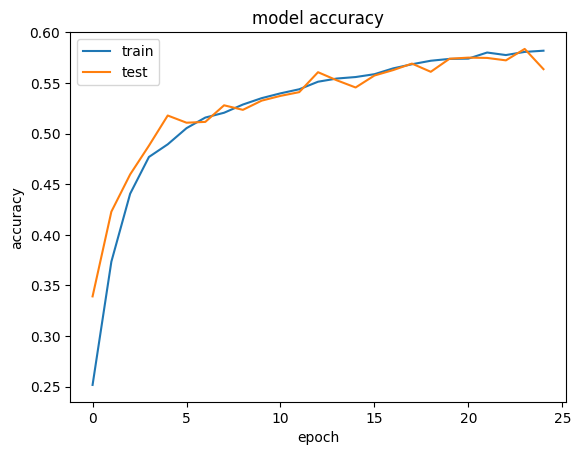

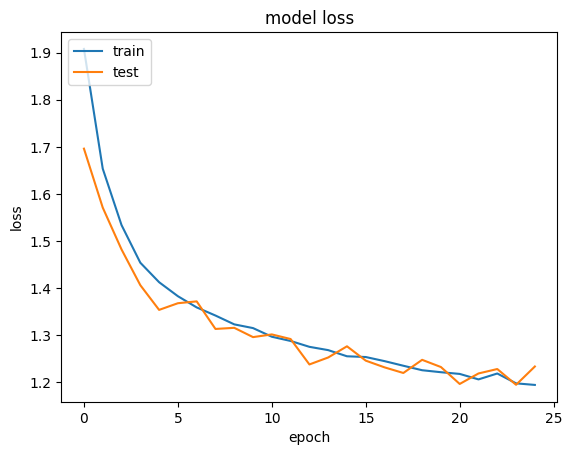

In [ ]:
# list all data in history
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# (N,W,H,C) : tensorflow 동작방식  / (N,C,W,H) : torch동작방식

- Improve_cifar_90_percent

In [ ]:
#import dependencies
import keras
from keras.models import Sequential
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras.datasets import cifar10
from keras import regularizers, optimizers
import numpy as np
from matplotlib import pyplot

In [ ]:
# download and split the data
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')

print("training data = ", x_train.shape)
print("testing data = ", x_test.shape)

training data =  (50000, 32, 32, 3)
testing data =  (10000, 32, 32, 3)


In [ ]:
# Normalize the data to speed up training
mean = np.mean(x_train)
std = np.std(x_train)
x_train = (x_train-mean)/(std+1e-7)
x_test = (x_test-mean)/(std+1e-7)

# let's look at the normalized values of a sample image
x_train[0]

array([[[-0.9619245 , -0.91515917, -0.8995707 ],
        [-1.2113398 , -1.1645745 , -1.1801629 ],
        [-1.1022207 , -1.1333976 , -1.2113398 ],
        ...,
        [ 0.58133286,  0.17603296, -0.19809005],
        [ 0.48780212,  0.06691375, -0.2916208 ],
        [ 0.4254483 ,  0.05132529, -0.27603233]],

       [[-1.6322283 , -1.5698744 , -1.5698744 ],
        [-1.8816435 , -1.8816435 , -1.8816435 ],
        [-1.6010513 , -1.756936  , -1.8816435 ],
        ...,
        [ 0.03573683, -0.5098592 , -1.0242784 ],
        [-0.026617  , -0.5878015 , -1.1022207 ],
        [ 0.02014837, -0.52544767, -0.9931014 ]],

       [[-1.4919322 , -1.5075206 , -1.554286  ],
        [-1.6322283 , -1.7725244 , -1.8816435 ],
        [-1.117809  , -1.4607552 , -1.756936  ],
        ...,
        [-0.04220546, -0.57221305, -1.1022207 ],
        [-0.01102854, -0.57221305, -1.1022207 ],
        [-0.18250158, -0.7436861 , -1.2269284 ]],

       ...,

       [[ 1.3607558 ,  0.7683944 , -0.38515157],
        [ 1

In [ ]:
# one-hot encode the labels in train and test datasets
# we use “to_categorical” function in keras 

num_classes = 10
y_train = np_utils.to_categorical(y_train,num_classes)
y_test = np_utils.to_categorical(y_test,num_classes)

# let's display one of the one-hot encoded labels
y_train[0]

array([0., 0., 0., 0., 0., 0., 1., 0., 0., 0.], dtype=float32)

In [ ]:
# build the model

# number of hidden units variable 
# we are declaring this variable here and use it in our CONV layers to make it easier to update from one place
base_hidden_units = 32

# l2 regularization hyperparameter
weight_decay = 1e-4 

# instantiate an empty sequential model 
model = Sequential()

# CONV1
# notice that we defined the input_shape here because this is the first CONV layer. 
# we don’t need to do that for the remaining layers
model.add(Conv2D(base_hidden_units, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay), input_shape=x_train.shape[1:]))
model.add(Activation('relu'))
model.add(BatchNormalization())

# CONV2
model.add(Conv2D(base_hidden_units, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))

# CONV3
model.add(Conv2D(2*base_hidden_units, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

# CONV4
model.add(Conv2D(2*base_hidden_units, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.3))

# CONV5
model.add(Conv2D(4*base_hidden_units, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())

# CONV6
model.add(Conv2D(4*base_hidden_units, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.4))

# FC7
model.add(Flatten())
model.add(Dense(num_classes, activation='softmax'))

# print model summary
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_9 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 activation (Activation)     (None, 32, 32, 32)        0         
                                                                 
 batch_normalization (BatchN  (None, 32, 32, 32)       128       
 ormalization)                                                   
                                                                 
 conv2d_10 (Conv2D)          (None, 32, 32, 32)        9248      
                                                                 
 activation_1 (Activation)   (None, 32, 32, 32)        0         
                                                                 
 batch_normalization_1 (Batc  (None, 32, 32, 32)       128       
 hNormalization)                                      

In [ ]:
# data augmentation
datagen = ImageDataGenerator(
    featurewise_center=False,
    samplewise_center=False,
    featurewise_std_normalization=False,
    samplewise_std_normalization=False,
    zca_whitening=False,
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=False
    )

# compute the data augmentation on the training set
datagen.fit(x_train)

In [ ]:
# training
batch_size = 64
epochs=125

from keras.callbacks import ModelCheckpoint
from keras.optimizers import RMSprop   

checkpointer = ModelCheckpoint(filepath='model.125epochs.hdf5', verbose=1, save_best_only=True)

# you can try any of these optimizers by uncommenting the line
# optimizer = keras.optimizers.rmsprop(lr=0.001,decay=1e-6)
# optimizer = keras.optimizers.adam(lr=0.0005,decay=1e-6)

optimizer = RMSprop(lr=0.0003,decay=1e-6)
model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
history = model.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size), callbacks=[checkpointer],
                steps_per_epoch=x_train.shape[0] // batch_size, epochs=epochs,verbose=2,
                validation_data=(x_test,y_test))

Epoch 1/125


/usr/local/lib/python3.10/dist-packages/keras/optimizers/legacy/rmsprop.py:143: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)
<ipython-input-38-7c0d4341146a>:16: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size), callbacks=[checkpointer],



Epoch 1: val_loss improved from inf to 1.53681, saving model to model.125epochs.hdf5
781/781 - 33s - loss: 2.1104 - accuracy: 0.3722 - val_loss: 1.5368 - val_accuracy: 0.5019 - 33s/epoch - 42ms/step
Epoch 2/125

Epoch 2: val_loss improved from 1.53681 to 1.27243, saving model to model.125epochs.hdf5
781/781 - 29s - loss: 1.5004 - accuracy: 0.5133 - val_loss: 1.2724 - val_accuracy: 0.5858 - 29s/epoch - 37ms/step
Epoch 3/125

Epoch 3: val_loss did not improve from 1.27243
781/781 - 30s - loss: 1.2842 - accuracy: 0.5806 - val_loss: 1.3142 - val_accuracy: 0.5993 - 30s/epoch - 39ms/step
Epoch 4/125

Epoch 4: val_loss improved from 1.27243 to 1.08921, saving model to model.125epochs.hdf5
781/781 - 29s - loss: 1.1447 - accuracy: 0.6231 - val_loss: 1.0892 - val_accuracy: 0.6586 - 29s/epoch - 37ms/step
Epoch 5/125

Epoch 5: val_loss improved from 1.08921 to 0.93563, saving model to model.125epochs.hdf5
781/781 - 29s - loss: 1.0394 - accuracy: 0.6582 - val_loss: 0.9356 - val_accuracy: 0.7034 - 

In [ ]:
# evaluating the model
scores = model.evaluate(x_test, y_test, batch_size=128, verbose=1)
print('\nTest result: %.3f loss: %.3f' % (scores[1]*100,scores[0]))

79/79 [==============================] - 1s 6ms/step - loss: 0.4917 - accuracy: 0.8705

Test result: 87.050 loss: 0.492


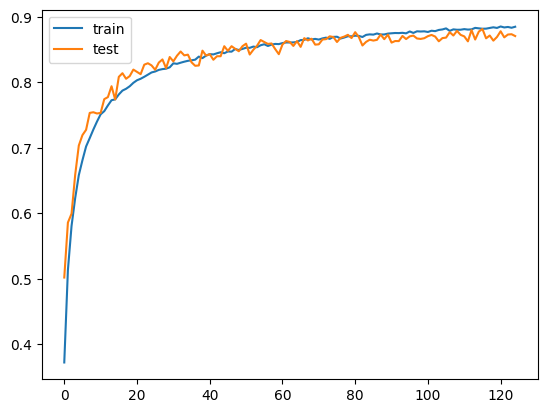

In [ ]:
# plot learning curves of model accuracy
pyplot.plot(history.history['accuracy'], label='train')
pyplot.plot(history.history['val_accuracy'], label='test')
pyplot.legend()
pyplot.show()

# Deeper(VGG 16 network)

- 옥스포드 대학의 연구팀 VGG 에 의해 개발된 모델, 2014년 이미지넷 이미지 인식 대회에서 준우승을 한 모델.
- 여기서 말하는 VGGNet은 16개 또는 19개의 층으로 구성된 모델을 의미.(VGG16,19)


<img src='https://i.imgur.com/vwExACo.png'>

paper : [Very Deep Convolutional Networks for Large-Scale Image Recognition](https://arxiv.org/abs/1409.1556)

- VGG 연구팀은 깊이의 영향만을 최대한 확인하고자 컨볼루션 필터커널의 사이즈는 가장 작은 3 x 3으로 고정했다.

<img src='https://i.imgur.com/HY8sjfa.png'>

- VGG 연구팀은 AlexNet과 VGG-F, VGG-M, VGG-S에서 사용되던 Local Response Normalization(LRN)이 A 구조와 A-LRN 구조의 성능을 비교함으로 성능 향상에 별로 효과가 없다고 실험을 통해 확인했다. 

- 그래서 더 깊은 B, C, D, E 구조에는 LRN을 적용하지 않는다고 논문에서 밝혔다. 또한 그들은 깊이가 11층, 13층, 16층, 19층으로 깊어지면서 분류 에러가 감소하는 것을 관찰했다. 즉, 깊어질수록 성능이 좋아진다는 것이었다.
VGGNet의 구조를 깊이 들여다보기에 앞서 먼저 집고 넘어가야할 것이 있다. 그것은 바로 3 x 3 필터로 두 차례 컨볼루션을 하는 것과 5 x 5 필터로 한 번 컨볼루션을 하는 것이 결과적으로 동일한 사이즈의 특성맵을 산출한다는 것이다(아래 그림 참고). 3 x 3 필터로 세 차례 컨볼루션 하는 것은 7 x 7 필터로 한 번 컨볼루션 하는 것과 대응된다.

<img src='https://i.imgur.com/5vY2wcw.png'>

그러면 3 x 3 필터로 세 차례 컨볼루션을 하는 것이 7 x 7 필터로 한 번 컨볼루션하는 것보다 나은 점은 무엇일까? 일단 가중치 또는 파라미터의 갯수의 차이다. 3 x 3 필터가 3개면 총 27개의 가중치를 갖는다. 반면 7 x 7 필터는 49개의 가중치를 갖는다. CNN에서 가중치는 모두 훈련이 필요한 것들이므로, 가중치가 적다는 것은 그만큼 훈련시켜야할 것의 갯수가 작아진다. 따라서 학습의 속도가 빨라진다. 동시에 층의 갯수가 늘어나면서 특성에 비선형성을 더 증가시키기 때문에 특성이 점점 더 유용해진다.

<img src='https://i.imgur.com/qS1ZNWI.png'>

- convolution이후에 padding을 항상 해 주기 때문에 convolution 이전과 이후의 크기가 동일하다.

- input layer : 224X224X3 (224X224XRGB 이미지)

- 1st layer
 - 64개의 3x3x3 필터커널로 입력 이미지를 convolution을 해줌.
 - zero padding은 1만큼 해줬고, stride:1
 - activation : RELU

- 2nd layer
 - 64개의 3x3x64 필터커널로 특성맵 convolution 해줌.
 - 2x2 maxpooling을 stride 2로 적용함으로써 특성맵의 사이즈를 112x112x64 로 줄임.

- 3rd layer
 - 128개의 3x3x64 필터커널로 특성맵을 컨볼루션해준다. 결과적으로 112x112 특성맵들(112x112x128)이 산출됨.

- 4th layer
 - 128개의 3x3x128 필터커널로 특성맵을 convolution을 해줌. 결과적으로 112x112x128의 특성맵이 산출.

 - 그 다음에 2x2 maxpooling을 stride 2로 적용해줌. 특성맵의 사이즈가 56x56x128로 줄어듬.

- 5th layer
 - 256개의 3x3x128 필터커널로 특성맵을 convolution한다. 결과적으로 256장의 56x56x256의 특성맵이 생성.
- 6th Layer
 - 256개의 3 x 3 x 256 필터커널로 특성맵을 컨볼루션한다. 결과적으로 256장의 56 x 56 특성맵들(56 x 56 x 256)이 생성된다.

- 7th Layer
 - 256개의 3 x 3 x 256 필터커널로 특성맵을 컨볼루션한다. 결과적으로 256장의 56 x 56 특성맵들(56 x 56 x 256)이 생성된다.
 - 그 다음에 2 x 2 최대 풀링을 stride 2로 적용한다. 특성맵의 사이즈가 28 x 28 x 256으로 줄어들었다.
- 8th Layer
 - 512개의 3 x 3 x 256 필터커널로 특성맵을 컨볼루션한다. 결과적으로 512장의 28 x 28 특성맵들(28 x 28 x 512)이 생성된다.

- 9th Layer(conv4_2)
 - 512개의 3 x 3 x 512 필터커널로 특성맵을 컨볼루션한다. 결과적으로 512장의 28 x 28 특성맵들(28 x 28 x 512)이 생성된다.
- 10th Layer(conv4_3)
 - 512개의 3 x 3 x 512 필터커널로 특성맵을 컨볼루션한다. 결과적으로 512장의 28 x 28 특성맵들(28 x 28 x 512)이 생성된다.
 - 그 다음에 2 x 2 최대 풀링을 stride 2로 적용한다. 특성맵의 사이즈가 14 x 14 x 512로 줄어든다.
- 11th Layer(conv5_1)
 - 512개의 3 x 3 x 512 필터커널로 특성맵을 컨볼루션한다. 결과적으로 512장의 14 x 14 특성맵들(14 x 14 x 512)이 생성된다.
- 12th Layer(conv5_2)
 - 512개의 3 x 3 x 512 필터커널로 특성맵을 컨볼루션한다. 결과적으로 512장의 14 x 14 특성맵들(14 x 14 x 512)이 생성된다.
- 13th Layer(conv5_3)
 - 512개의 3 x 3 x 512 필터커널로 특성맵을 컨볼루션한다. 결과적으로 512장의 14 x 14 특성맵들(14 x 14 x 512)이 생성된다.
 - 그 다음에 2 x 2 최대 풀링을 stride 2로 적용한다. 특성맵의 사이즈가 7 x 7 x 512로 줄어든다.
- 14th Layer(fc1)
 - 7 x 7 x 512의 특성맵을 flatten 해준다. flatten이라는 것은 전 층의 출력을 받아서 단순히 1차원의 벡터로 펼쳐주는 것을 의미한다. 결과적으로 7 x 7 x 512 = 25088개의 뉴런이 되고, fc1층의 4096개의 뉴런과 fully connected 된다.
훈련시 dropout이 적용된다.
- 15th Layer
 - 4096개의 뉴런으로 구성해준다. fc1층의 4096개의 뉴런과 fully connected 된다.
훈련시 dropout이 적용된다.
- 16th Layer
1000개의 뉴런으로 구성된다. fc2층의 4096개의 뉴런과 fully connected된다.
 - 출력값들은 softmax 함수로 활성화된다.
1000개의 뉴런으로 구성되었다는 것은 1000개의 클래스로 분류하는 목적으로 만들어진 네트워크란 뜻이다.

- 16개 층으로 이루어진 VGG 의미.

- VGGNet : 2014 ILSVRC(ImageNet Large Scale Visual Recognition Challenge)에서 준우승 CNN 네트워크.

- 사용하기 쉬운 구조와 좋은 성능 덕분에 그 대회에서 우승을 함.  GoogleNet보다 더 인기를 얻음.

<img src='https://blog.kakaocdn.net/dn/b1Vk5P/btqwqjujKsa/TL2HyQ4kj6pNPz4TsirknK/img.png'>

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D,Flatten,Dense,BatchNormalization,MaxPooling2D,Dropout
model2 = Sequential([    
    # first CONV => RELU => CONV => RELU => POOL layer set
    Conv2D(32, (3,3), padding = 'same', activation = 'relu', input_shape = (28, 28, 1)), #widthXheightXChannel
    BatchNormalization(),
    Conv2D(32,(3,3),padding='same', activation= 'relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size = (2, 2), padding = 'same'), #maxpooing에서 반절이 줄어듬  
    Dropout(0.25),

    # second CONV => RELU => CONV => RELU => POOL layer set
    Conv2D(64,(3,3),padding='same',activation = 'relu'),
    BatchNormalization(),
    Conv2D(64,(3,3),padding = 'same',activation= 'relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2,2),padding = 'same'),
    Dropout(0.25),

    #first(and only) set of FC ->Relu layers
    Flatten(),
    Dense(512,activation='relu'),
    BatchNormalization(),
    Dropout(0.5),

    #softmax
    Dense(10,activation='softmax')
])
model2.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        320       
                                                                 
 batch_normalization (BatchN  (None, 28, 28, 32)       128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 32)        9248      
                                                                 
 batch_normalization_1 (Batc  (None, 28, 28, 32)       128       
 hNormalization)                                                 
                                                                 
 max_pooling2d (MaxPooling2D  (None, 14, 14, 32)       0         
 )                                                               
                                                        

# cifar 10 with vgg16

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import datasets,layers,models
from keras.models import Model
from keras.layers import Flatten,Dense,Input,Conv2D,MaxPooling2D,Dropout, BatchNormalization
from keras import optimizers
from tensorflow.keras.regularizers import l2
#from tensorflow.keras import reularizers


cifar10 = datasets.cifar10
(train_images,train_labels),(test_images,test_labels) = cifar10.load_data()
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog','frog', 'horse', 'ship', 'truck']

#Valid/test dataset 나누기
valid_images=[]
valid_labels=[]

for i in range(5000):
    valid_images.append(test_images[i])
    valid_labels.append(test_labels[i])
test_images_5000 = []
test_labels_5000 = []
for i in range(5000):
    test_images_5000.append(test_images[5000+i])
    test_labels_5000.append(test_labels[5000+i])

test_images_5000 = np.array(test_images_5000)
test_labels_5000 = np.array(test_labels_5000)
valid_images = np.array(valid_images)
valid_labels = np.array(valid_labels)
print('Train samples:', train_images.shape,train_labels.shape)
print('valid samples:', valid_images.shape,valid_labels.shape)
print('Test samples:', test_images_5000.shape,test_labels_5000.shape)    


170498071/170498071 [==============================] - 7s 0us/step
Train samples: (50000, 32, 32, 3) (50000, 1)
valid samples: (5000, 32, 32, 3) (5000, 1)
Test samples: (5000, 32, 32, 3) (5000, 1)


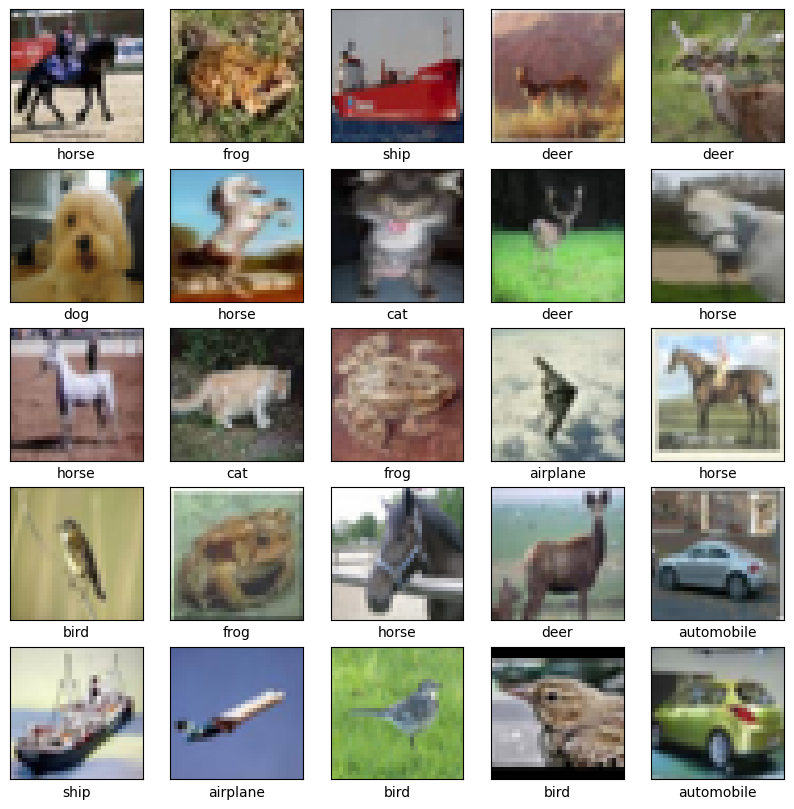

In [ ]:
#test data가 잘 할당되었나 확인해보기
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_images_5000[i])
    plt.xlabel(class_names[test_labels_5000[i][0]])
plt.show()

In [ ]:
#기존 VGG16에서 parameter 갯수를 줄이고, dense layer 노드 갯수를 줄임.
from keras.layers import BatchNormalization
def VGG16_Brief(classes=10): # classes = 감지할 클래스 수
    img_rows, img_cols = 32, 32
    img_channels = 3    
    img_dim = (img_rows, img_cols, img_channels) #차원..shape 정의..
    
    img_input = Input(shape=img_dim) #튜플.. 변경 x
    x = Conv2D(32,(3,3),padding='same',activation = 'relu')(img_input) #1층
    x = Dropout(0.256)(x)
    # x = Conv2D(32,(3,3),padding='same',activation = 'relu')(x) #2층
    # x = Dropout(0.15)(x)
    x = MaxPooling2D((2,2),strides=(2,2))(x) #2층 maxpool


    x = Conv2D(64,(3,3),padding='same',activation = 'relu')(x) #3층
    x = Dropout(0.25)(x)
    # x = Conv2D(64,(3,3),padding='same',activation = 'relu')(x) #4층
    # x = Dropout(0.15)(x)
    x = MaxPooling2D((2,2),strides=(2,2))(x) #4층 maxpool
    # x = Dropout(0.25)(x)

    x = Conv2D(128,(3,3),padding='same',activation = 'relu')(x) #5층
    x = Dropout(0.25)(x)
    # x = Conv2D(256,(3,3),padding='same',activation = 'relu')(x) #6층
    # x = Dropout(0.15)(x)
    # x = Conv2D(256,(3,3),padding='same',activation = 'relu')(x) #7층
    # x = Dropout(0.15)(x)
    x = MaxPooling2D((2,2),strides=(2,2))(x) #7층 maxpool
    # x = Dropout(0.2)(x)

    # x = Conv2D(512,(3,3),padding='same',activation = 'relu')(x) #8층
    # x = Conv2D(512,(3,3),padding='same',activation = 'relu')(x) #9층
    # x = Conv2D(512,(3,3),padding='same',activation = 'relu')(x) #10층
    # x = MaxPooling2D((2,2),strides=(2,2))(x) #10층 maxpool

    # x = Conv2D(512,(3,3),padding='same',activation = 'relu')(x) #11층
    # x = Conv2D(512,(3,3),padding='same',activation = 'relu')(x) #12층
    # x = Conv2D(512,(3,3),padding='same',activation = 'relu')(x) #13층
    # x = MaxPooling2D((2,2),strides=(2,2))(x) #13층 maxpool

    x = Flatten()(x)
    # x = Dense(1024, activation = 'relu')(x) #14층
    # x = Dropout(0.5)(x)
    x = Dense(512, activation = 'relu')(x) #15층
    x = Dropout(0.5)(x)
    x = Dense(classes, activation = 'softmax')(x)
    
    model = Model(inputs=img_input, outputs = x)
    return model

model = VGG16_Brief(classes = 10)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 dropout_3 (Dropout)         (None, 32, 32, 32)        0         
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 dropout_4 (Dropout)         (None, 16, 16, 64)        0         
                                                             

In [ ]:
model.compile(optimizer='Adam',loss = 'sparse_categorical_crossentropy',metrics=['accuracy'])

from tensorflow.keras.callbacks import EarlyStopping,ReduceLROnPlateau
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',
                                            patience=5,
                                            verbose=1,
                                            factor=0.1,
                                            min_lr = 0.00001)
hist = model.fit(train_images,train_labels,epochs=100,
                 validation_data=(valid_images,valid_labels),
                 callbacks = [learning_rate_reduction],batch_size=256)

Epoch 1/100
196/196 [==============================] - 15s 18ms/step - loss: 4.8460 - accuracy: 0.2903 - val_loss: 1.7086 - val_accuracy: 0.4520 - lr: 0.0010
Epoch 2/100
196/196 [==============================] - 3s 15ms/step - loss: 1.5953 - accuracy: 0.4216 - val_loss: 1.5341 - val_accuracy: 0.5008 - lr: 0.0010
Epoch 3/100
196/196 [==============================] - 3s 15ms/step - loss: 1.4582 - accuracy: 0.4774 - val_loss: 1.4748 - val_accuracy: 0.5466 - lr: 0.0010
Epoch 4/100
196/196 [==============================] - 3s 15ms/step - loss: 1.3513 - accuracy: 0.5178 - val_loss: 1.3188 - val_accuracy: 0.5840 - lr: 0.0010
Epoch 5/100
196/196 [==============================] - 3s 15ms/step - loss: 1.2635 - accuracy: 0.5520 - val_loss: 1.2086 - val_accuracy: 0.6148 - lr: 0.0010
Epoch 6/100
196/196 [==============================] - 3s 15ms/step - loss: 1.1673 - accuracy: 0.5854 - val_loss: 1.1655 - val_accuracy: 0.6400 - lr: 0.0010
Epoch 7/100
196/196 [==============================] - 3s

In [ ]:
test_loss, test_acc = model.evaluate(test_images_5000,test_labels_5000)
print('test loss:', test_loss)
print('test acc:', test_acc)

157/157 [==============================] - 1s 3ms/step - loss: 0.6044 - accuracy: 0.7954
test loss: 0.6043956279754639
test acc: 0.7954000234603882


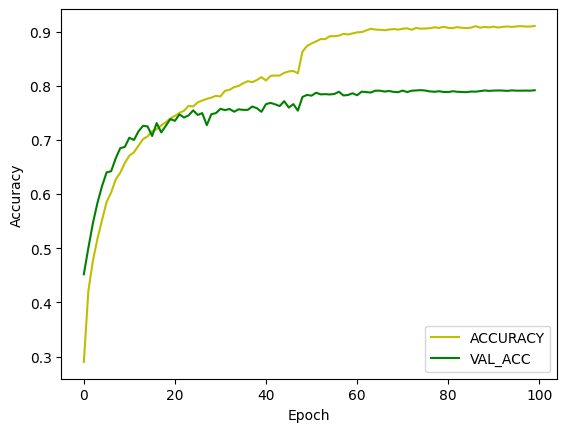

In [ ]:
import matplotlib.pyplot as plt
plt.plot(hist.history["accuracy"], 'y', label= 'ACCURACY')
plt.plot(hist.history["val_accuracy"], 'g', label= 'VAL_ACC')

plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.legend(loc='lower right')
plt.show()

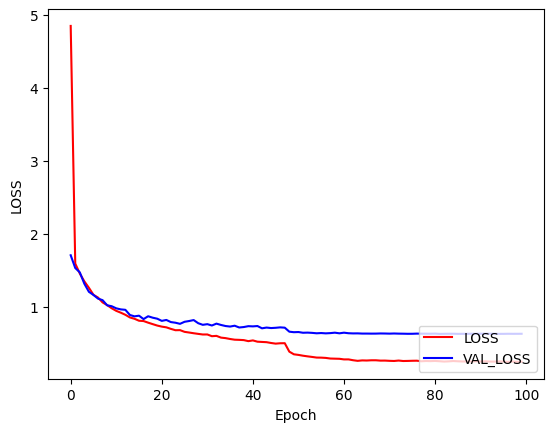

In [ ]:
plt.subplot(111)
plt.plot(hist.history['loss'], 'r', label= 'LOSS')
plt.plot(hist.history["val_loss"], 'b', label= 'VAL_LOSS')
#plt.plot(test_acc, 'r', label= 'TEST_ACC')
plt.ylabel("LOSS")
plt.xlabel("Epoch")
plt.legend(loc='lower right')
plt.show()

In [ ]:
# 모델 구성하기
# 높이, 너비, 채널(RGB) 설정
width = 32
height = 32
channel = 3
# 순차적 모델을 만들기 위한 Sequential() 함수
model = Sequential(name='CIFAR10_CNN_Upgraded')
# filters : Kernel 그룹의 갯수 / kernel_size : Kernel 크기
# padding : 'same'일 경우 입력과 출력 모양이 같도록 0을 주변에 덧댄다
# elu : ReLU 보다 발전된 형태의 활성화 함수 ELU를 써봅니다
# kernel_regularizer : 가중치 규제를 정해줄 수 있습니다. / l2(lambda) : 가중치의 L2 Norm을 목적 함수에 추가하며, lambda에 따라 곱해지는 상수값을 정합니다.
model.add(Conv2D(filters=32, kernel_size=(3, 3), padding='same', kernel_regularizer=l2(0.0001),
                 input_shape=(width, height, channel), activation='elu'))
#model.add(Conv2D(filters=32, kernel_size=(3,3),padding='same',kernel_regularizer=reularizers.l2(0.0001),
#                 input_shape=(width,height,channel),activation='elu'))
model.add(BatchNormalization()) # BatchNormalization() : 배치 정규화를 위한 층을 추가합니다
model.add(Conv2D(filters=32, kernel_size=(3, 3), padding='same', kernel_regularizer=l2(0.0001), activation='elu'))
model.add(BatchNormalization())
# pool_size : MaxPooling 의 Window size
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2)) # Dropout(rate) : 앞의 층에 드롭아웃을 적용합니다. rate 값에 따라 없애고 학습할 노드 비율을 정합니다.
model.add(Conv2D(filters=64, kernel_size=(3, 3), padding='same', kernel_regularizer=l2(0.0001), activation='elu'))
model.add(BatchNormalization())
model.add(Conv2D(filters=64, kernel_size=(3, 3), padding='same', kernel_regularizer=l2(0.0001), activation='elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))
model.add(Conv2D(filters=128, kernel_size=(3, 3), padding='same', kernel_regularizer=l2(0.0001), activation='elu'))
model.add(BatchNormalization())
model.add(Conv2D(filters=128, kernel_size=(3, 3), padding='same', kernel_regularizer=l2(0.0001), activation='elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))
# N차원 배열을 1차원으로 펴줍니다
model.add(Flatten())
# 출력층 MLP
model.add(Dense(10, activation='softmax'))
model.summary()

Model: "CIFAR10_CNN_Upgraded"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 batch_normalization_5 (Batc  (None, 32, 32, 32)       128       
 hNormalization)                                                 
                                                                 
 conv2d_8 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 batch_normalization_6 (Batc  (None, 32, 32, 32)       128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 16, 16, 32)       0         
 2D)                                                             
                                              

In [ ]:
# 모델 학습과정 설정하기
# loss : 목적 함수
# categorical_crossentropy : 분류가 2개 이상인 CEE
# optimizer : 학습 방법, Adam을 사용합니다.
# metrics : 학습 도중 화면에 어떤 값을 출력할지 결정합니다.
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])
# 모델 학습시키기
# hist는 Epoch 당 학습 결과를 갖게 됩니다.
hist = model.fit(x_train, y_train,
                 epochs=30,
                 batch_size=32,
                 validation_data=(x_test, y_test))

NameError: ignored

In [ ]:
# 그래프를 그리기 위한 matplotlib 라이브러리
import matplotlib.pyplot as plt
# Training Loss VS Validation Loss 비교를 위한 그래프 그리기 
plt.plot(hist.history['loss'], 'y', label='train loss')
plt.plot(hist.history['val_loss'], 'r', label='val loss')
# y축 범위 설정
plt.ylim([0.0, 2.0])
# 각 축의 이름 정하기
plt.xlabel('epoch')
plt.ylabel('loss')
# 각 그래프의 설명 위치 설정 후 표시
plt.legend(loc='upper left')
plt.show()

In [ ]:
# Training Accuracy VS Validation Accuracy 비교를 위한 그래프 그리기 
plt.plot(hist.history['acc'], 'b', label='train acc')
plt.plot(hist.history['val_acc'], 'g', label='val acc')
# y축 범위 설정
plt.ylim([0.3, 1.0])
# 각 축의 이름 정하기
plt.xlabel('epoch')
plt.ylabel('accuray')
# 각 그래프의 설명 위치 설정 후 표시
plt.legend(loc='upper left')
# 그래프 그리기
plt.show()


In [ ]:
#모델 평가
loss_and_acc = model.evaluate(x_test, y_test, batch_size=32)
print('Test set Loss and Accuracy')
print(loss_and_acc)

In [ ]:
#모델 사용하기
# 이미지의 종류가 무엇인지에 대한 리스트
labels = ['비행기', '자동차', '새', '고양이', '사슴', '개', '개구리', '말', '배', '트럭']
# 출력 그림의 크기를 결정합니다.
plt.rcParams["figure.figsize"] = (2,2)
# Test Set의 10개를 맞추어 봅시다.
for i in range(10):
  # 모델 사용 
  output = model.predict(x_test[i].reshape(1,width, height, channel))
  
  # 이미지 출력 
  plt.imshow(x_test[i].reshape(width, height, channel))
  # np.argmax()가 labels의 인덱스가 되어 labels 배열에 있는 문자열을 출력합니다.
  print('예측: ' + labels[np.argmax(output)] + ' / 정답: ' + labels[np.argmax(y_test[i])])
  plt.show()

In [ ]:
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D,MaxPooling2D,Dense,Dropout,Flatten,BatchNormalization
import matplotlib.pyplot as plt
from tensorflow.keras.utils import to_categorical

(X_train,y_train),(X_test,y_test) = cifar10.load_data()

#one-hot encoding
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)


from tensorflow.keras.layers import Dropout
model = Sequential([    
    # first CONV => RELU => CONV => RELU => POOL layer set
    Conv2D(32, (3,3), padding = 'same', activation = 'relu', input_shape = (32, 32, 3)), #widthXheightXChannel
    BatchNormalization(),
    Conv2D(32,(3,3),padding='same', activation= 'relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size = (2, 2), padding = 'same'), #maxpooing에서 반절이 줄어듬  
    Dropout(0.25),

    # second CONV => RELU => CONV => RELU => POOL layer set
    Conv2D(64,(3,3),padding='same',activation = 'relu'),
    BatchNormalization(),
    Conv2D(64,(3,3),padding = 'same',activation= 'relu'),
    BatchNormalization(),
    MaxPooling2D(pool_size=(2,2),padding = 'same'),
    Dropout(0.25),

    #first(and only) set of FC ->Relu layers
    Flatten(),
    Dense(512,activation='relu'),
    BatchNormalization(),
    Dropout(0.5),

    #softmax
    Dense(10,activation='softmax')
])

In [ ]:
model.summary()

In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['acc'])

In [ ]:
hist = model.fit(X_train, y_train,epochs=50, validation_split=0.1)

In [ ]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("CNN Error: %.2f%%" % (100-scores[1]*100))
 
#모델 시각
fig, loss_ax = plt.subplots()
 
acc_ax = loss_ax.twinx()
 
loss_ax.plot(hist.history['loss'], 'y', label='train loss')
loss_ax.plot(hist.history['val_loss'], 'r', label='val loss')
 
acc_ax.plot(hist.history['acc'], 'b', label='train acc')
acc_ax.plot(hist.history['val_acc'], 'g', label='val acc')
 
loss_ax.set_xlabel('epoch')
loss_ax.set_ylabel('loss')
acc_ax. set_ylabel('accuracy')
 
loss_ax.legend(loc='upper left')
acc_ax.legend(loc='lower left')
 
plt.show()

In [ ]:
import keras
from keras.models import Sequential
from keras.utils import np_utils
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Activation, Flatten, Dropout, BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras.datasets import cifar10
from keras import regularizers
from keras.callbacks import LearningRateScheduler
from tensorflow.keras.optimizers import Adam

import numpy as np
 
def lr_schedule(epoch):
    lrate = 0.001
    if epoch > 75:
        lrate = 0.0005
    if epoch > 100:
        lrate = 0.0003
    return lrate
 
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
 
#z-score
mean = np.mean(x_train,axis=(0,1,2,3))
std = np.std(x_train,axis=(0,1,2,3))
x_train = (x_train-mean)/(std+1e-7)
x_test = (x_test-mean)/(std+1e-7)
 
num_classes = 10
y_train = np_utils.to_categorical(y_train,num_classes)
y_test = np_utils.to_categorical(y_test,num_classes)
 
weight_decay = 1e-4
model = Sequential()
model.add(Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay), input_shape=x_train.shape[1:]))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(Conv2D(32, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.2))
 
model.add(Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(Conv2D(64, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.3))
 
model.add(Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(Conv2D(128, (3,3), padding='same', kernel_regularizer=regularizers.l2(weight_decay)))
model.add(Activation('elu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.4))
 
model.add(Flatten())
model.add(Dense(num_classes, activation='softmax'))
 
model.summary()
 
#data augmentation
datagen = ImageDataGenerator(
    rotation_range=15, #랜덤하게 사진을 회전시킬 각도(0~180도)
    width_shift_range=0.1, #수평으로 랜덤하게 평행이동 시킬 범위.
    height_shift_range=0.1,# 수직으로 랜덤하게 평행이동 시킬 범위
    horizontal_flip=True, # 무작위로 가로를 뒤집는다.
    )
datagen.fit(x_train)
 
#training
batch_size = 256
 
model.compile(loss='categorical_crossentropy', optimizer=Adam(learning_rate=0.1), metrics=['accuracy'])
model.fit_generator(datagen.flow(x_train, y_train, batch_size=batch_size),\
                    steps_per_epoch=x_train.shape[0] // batch_size,epochs=50,\
                    verbose=1,validation_data=(x_test,y_test),callbacks=[LearningRateScheduler(lr_schedule)])
#save to disk
model_json = model.to_json()
with open('model.json', 'w') as json_file:
    json_file.write(model_json)
model.save_weights('model.h5') 
 
#testing
scores = model.evaluate(x_test, y_test, batch_size=128, verbose=1)
print('\nTest result: %.3f loss: %.3f' % (scores[1]*100,scores[0]))

In [ ]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()
 
x_train = x_train.astype('float32')
x_test = x_test.astype('float32')
 
# mean-std normalization
mean = np.mean(x_train,axis=(0,1,2,3))
std = np.std(x_train,axis=(0,1,2,3))
x_train = (x_train-mean)/(std+1e-7)
x_test = (x_test-mean)/(std+1e-7)
  
labels =  ['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']
 
indices = np.argmax(model.predict(x_test[:16]),1)
print ([labels[x] for x in indices])

HW) Cifar 100으로 학습을 해보자.

나중에 시간 되면 참고해서 해보세요~

머핀과 치와와 구분하기(https://gruuuuu.github.io/simple-tutorial/overfitting-handle/#)

In [ ]:
import keras
from keras.datasets import cifar100
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras import optimizers
import numpy as np
from keras.layers.core import Lambda
from keras import backend as K
from keras import regularizers
import matplotlib.pyplot as plt

Load Cifar100 Dataset

In [ ]:
(x_train, y_train), (x_test, y_test) = cifar100.load_data()

169017344/169001437 [==============================] - 6s 0us/step


# CNN 실습(케라스 창시자에게 배우는 딥러닝 책 참고하였음.)

## Cat VS Dog(https://www.kaggle.com/c/dogs-vs-cats)

2013년도에 열린 대회, Convnet 95%

data 크기 :25,000(클래스마다 1만 2500개) 담고 있고 543mb입니다.

In [ ]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
ls -1ha /content/drive/MyDrive/kaggle.json #현재 존재하나요?

/content/drive/MyDrive/kaggle.json


- 755 퍼미션: rwxr-xr-x  소유자는 모두가능, 그룹소유자와 일반사용자는 읽기/실행만.  

- 644퍼미션:  rw-r--r--    소유자는 읽고쓰기, 그룹소유자와 일반사용자는 읽기만.

- 600퍼미션 : rw-------    소유자는 읽고쓰기, 나머지는 아무권한도 없음. 

In [ ]:
!mkdir -p ~/.kaggle #make dir    
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/ #move kaggle.json->~/.kaggle (현재 경로에 있는 파일 ./)
#./.kaggle .폴더명 : 숨김폴더.
# Permission Warning이 발생하지 않도록 해줍니다.
!chmod 600 ~/.kaggle/kaggle.json # r(read):4,write(w):2,exe(x):1
# 내가 참가한 대회 리스트 확인
!kaggle competitions list

ref                                             deadline             category            reward  teamCount  userHasEntered  
----------------------------------------------  -------------------  ---------------  ---------  ---------  --------------  
contradictory-my-dear-watson                    2030-07-01 23:59:00  Getting Started     Prizes         58           False  
gan-getting-started                             2030-07-01 23:59:00  Getting Started     Prizes         79           False  
store-sales-time-series-forecasting             2030-06-30 23:59:00  Getting Started  Knowledge        693           False  
tpu-getting-started                             2030-06-03 23:59:00  Getting Started  Knowledge        125           False  
digit-recognizer                                2030-01-01 00:00:00  Getting Started  Knowledge       1321           False  
titanic                                         2030-01-01 00:00:00  Getting Started  Knowledge      14513            True  


In [ ]:
!kaggle competitions download -c dogs-vs-cats

100% 812M/812M [00:05<00:00, 127MB/s]
100% 812M/812M [00:05<00:00, 161MB/s]


In [ ]:
!unzip /content/dogs-vs-cats.zip

Archive:  /content/dogs-vs-cats.zip
  inflating: sampleSubmission.csv    
  inflating: test1.zip               
  inflating: train.zip               


In [ ]:
!unzip /content/train.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: train/dog.5499.jpg      
  inflating: train/dog.55.jpg        
  inflating: train/dog.550.jpg       
  inflating: train/dog.5500.jpg      
  inflating: train/dog.5501.jpg      
  inflating: train/dog.5502.jpg      
  inflating: train/dog.5503.jpg      
  inflating: train/dog.5504.jpg      
  inflating: train/dog.5505.jpg      
  inflating: train/dog.5506.jpg      
  inflating: train/dog.5507.jpg      
  inflating: train/dog.5508.jpg      
  inflating: train/dog.5509.jpg      
  inflating: train/dog.551.jpg       
  inflating: train/dog.5510.jpg      
  inflating: train/dog.5511.jpg      
  inflating: train/dog.5512.jpg      
  inflating: train/dog.5513.jpg      
  inflating: train/dog.5514.jpg      
  inflating: train/dog.5515.jpg      
  inflating: train/dog.5516.jpg      
  inflating: train/dog.5517.jpg      
  inflating: train/dog.5518.jpg      
  inflating: train/dog.5519.jpg      
  inflating: train/dog.552.jpg       
  inflating: t

In [ ]:
!unzip /content/test1.zip

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  inflating: test1/5499.jpg          
  inflating: test1/55.jpg            
  inflating: test1/550.jpg           
  inflating: test1/5500.jpg          
  inflating: test1/5501.jpg          
  inflating: test1/5502.jpg          
  inflating: test1/5503.jpg          
  inflating: test1/5504.jpg          
  inflating: test1/5505.jpg          
  inflating: test1/5506.jpg          
  inflating: test1/5507.jpg          
  inflating: test1/5508.jpg          
  inflating: test1/5509.jpg          
  inflating: test1/551.jpg           
  inflating: test1/5510.jpg          
  inflating: test1/5511.jpg          
  inflating: test1/5512.jpg          
  inflating: test1/5513.jpg          
  inflating: test1/5514.jpg          
  inflating: test1/5515.jpg          
  inflating: test1/5516.jpg          
  inflating: test1/5517.jpg          
  inflating: test1/5518.jpg          
  inflating: test1/5519.jpg          
  inflating: test1/552.jpg           
  inflating: t

In [ ]:
import pandas as pd
import os
filenames = os.listdir("/content/train")
categories = []
for filename in filenames:
    category = filename.split('.')[0]
    if category == 'dog':
        categories.append(1)
    else:
        categories.append(0)

df = pd.DataFrame({
    'filename': filenames,
    'category': categories
})
df.head()

,filename,category
0,cat.1392.jpg,0
1,dog.10939.jpg,1
2,cat.12381.jpg,0
3,dog.879.jpg,1
4,dog.10014.jpg,1


In [ ]:
df.shape

(25000, 2)

In [ ]:
df['category'].value_counts()

0    12500
1    12500
Name: category, dtype: int64

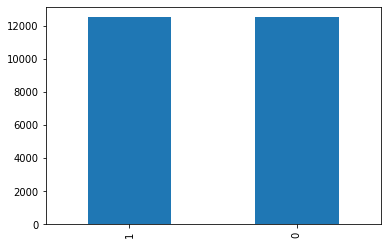

In [ ]:
df['category'].value_counts().plot.bar()

- random한 이미지를 그려보자!

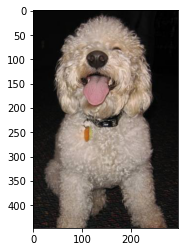

In [ ]:
from tensorflow.keras.utils import load_img
import random
import matplotlib.pyplot as plt
sample = random.choice(filenames)
image = load_img("/content/train/"+sample)
plt.imshow(image)

In [ ]:
#훈련,검증,테스트 폴더로 이미지 복사하기.
import os,shutil
#os : operation system / 운영체제와의 상호작용을 돕는 다양한 기능을 제공.
#참고 : https://docs.python.org/ko/3/library/os.html?highlight=os#module-os
#shutil : 파일,복사 etc
#참고 : https://docs.python.org/ko/3/library/shutil.html


original_dataset_dir = '/content/train' # 원본 데이터셋을 압축 해제한 디렉터리 경로

base_dir = '/content/cats_and_dogs_small' #소규모 데이터셋을 저장할 디렉터리.
os.mkdir(base_dir) #making dictory

- 2번 이상 실행하게 되면 File exists 에러가 난다.

In [ ]:
train_dir = os.path.join(base_dir,'train') # /content/cats_and_dogs_small/train
os.mkdir(train_dir)
validation_dir = os.path.join(base_dir,'validation') #/content/cats_and_dogs_small/validation
os.mkdir(validation_dir)
test_dir = os.path.join(base_dir,'test') #/content/cats_and_dogs_small/test
os.mkdir(test_dir)
#훈련,검증, 테스트 분할을 위한 디렉토리.

In [ ]:
train_cats_dir = os.path.join(train_dir,'cats')
os.mkdir(train_cats_dir)
#훈련용 고양이 사진 디렉토리

train_dogs_dir = os.path.join(train_dir,'dogs')
os.mkdir(train_dogs_dir)
#훈련용 강아지 사진 디렉토리

In [ ]:
validation_cats_dir = os.path.join(validation_dir,'cats')
os.mkdir(validation_cats_dir)
#검증용 고양이 사진 디렉토리

validation_dogs_dir = os.path.join(validation_dir,'dogs')
os.mkdir(validation_dogs_dir)
#검증용 강아지 사진 디렉토리

In [ ]:
test_cats_dir = os.path.join(test_dir,'cats')
os.mkdir(test_cats_dir)
#테스트용 고양이 사진 디렉토리

test_dogs_dir = os.path.join(test_dir,'dogs')
os.mkdir(test_dogs_dir)
#테스트용 강아지 사진 디렉토리

고양이 사진에 대한 것


In [ ]:
fnames = ['cat.{}.jpg'.format(i) for i in range(1000)] # 처음 1000개의 고양이 이미지를 train_cats_dir에 복사
for fname in fnames:
  src = os.path.join(original_dataset_dir,fname)
  dst = os.path.join(train_cats_dir,fname)
  shutil.copyfile(src,dst)

In [ ]:
fnames = ['cat.{}.jpg'.format(i) for i in range(1000,1500)] #다음 500개의 고양이 이미지를 validation_cats_dir에 복사
for fname in fnames:
  src = os.path.join(original_dataset_dir,fname)
  dst = os.path.join(validation_cats_dir,fname)
  shutil.copyfile(src,dst)

In [ ]:
fnames = ['cat.{}.jpg'.format(i) for i in range(1500,2000)] #다음 500개의 고양이 이미지를 test_cats_dir에 복사
for fname in fnames:
  src = os.path.join(original_dataset_dir,fname)
  dst = os.path.join(test_cats_dir,fname)
  shutil.copyfile(src,dst)

강아지에 대한 것

In [ ]:
fnames = ['dog.{}.jpg'.format(i) for i in range(1000)] # 처음 1000개의 강아지 이미지를 train_dogs_dir에 복사
for fname in fnames:
  src = os.path.join(original_dataset_dir,fname)
  dst = os.path.join(train_dogs_dir,fname)
  shutil.copyfile(src,dst)

In [ ]:
fnames = ['dog.{}.jpg'.format(i) for i in range(1000,1500)] # 다음 500개의 강아지 이미지를 validation_dogs_dir에 복사
for fname in fnames:
  src = os.path.join(original_dataset_dir,fname)
  dst = os.path.join(validation_dogs_dir,fname)
  shutil.copyfile(src,dst)

In [ ]:
fnames = ['dog.{}.jpg'.format(i) for i in range(1500,2000)] # 다음 500개의 강아지 이미지를 test_dogs_dir에 복사
for fname in fnames:
  src = os.path.join(original_dataset_dir,fname)
  dst = os.path.join(test_dogs_dir,fname)
  shutil.copyfile(src,dst)

- shape이 다르다면 경로가 잘 못 잡힌 경우가 많음.

In [ ]:
print('훈련용 고양이 이미지 전체 개수', len(os.listdir(train_cats_dir)))
print('검증용 고양이 이미지 전체 개수', len(os.listdir(validation_cats_dir)))
print('테스트용 고양이 이미지 전체 개수', len(os.listdir(test_cats_dir)))

훈련용 고양이 이미지 전체 개수 1000
검증용 고양이 이미지 전체 개수 500
테스트용 고양이 이미지 전체 개수 500


In [ ]:
print('훈련용 강아지 이미지 전체 개수', len(os.listdir(train_dogs_dir)))
print('검증용 강아지 이미지 전체 개수', len(os.listdir(validation_dogs_dir)))
print('테스트용 강아지 이미지 전체 개수', len(os.listdir(test_dogs_dir)))

훈련용 강아지 이미지 전체 개수 1000
검증용 강아지 이미지 전체 개수 500
테스트용 강아지 이미지 전체 개수 500


Locals설명

In [ ]:
x = 5       # global scope

def myfunc():
    x = 10  # local scope
    print('x inside function is', x)    

myfunc()
# Prints x inside function is 10

print('x outside function is', x)
# Prints x outside function is 5

x inside function is 10
x outside function is 5


In [ ]:
# Get the value of local variable 'x'
x = 10
print(locals()['x'])
# Prints 10

10


# 네트워크 구성하기.

conv, maxpooling 은 똑같음.

input_shape = 150X150(임의로 설정)

In [ ]:
from keras import layers, models

model = models.Sequential()
model.add(layers.Conv2D(32,(3,3),activation = 'relu', input_shape=(150,150,3)))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Conv2D(64,(3,3),activation = 'relu'))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Conv2D(128,(3,3),activation = 'relu'))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Conv2D(128,(3,3),activation = 'relu'))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Flatten())
model.add(layers.Dense(512,activation = 'relu'))
model.add(layers.Dense(1,activation = 'sigmoid'))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 17, 17, 128)     

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss = 'binary_crossentropy', optimizer= RMSprop(learning_rate = 1e-4), metrics = ['acc'])

데이터 전처리
1. 사진을 읽습니다.
2. jpeg 콘텐츠를 RGB 픽셀 값으로 디코딩합니다.
3. 그 다음 부동 소수 타입의 텐서로 변화시킵니다.
4. 픽셀 값(0~255)의 스케일을 [0,1]로 조정(신경망은 작은 입력값을 좋아함)

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale  = 1./255)
test_datagen = ImageDataGenerator(rescale  = 1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory(
    train_dir, #타깃 디렉터리
    target_size = (150,150), #모든 이미지 150X150으로 만듬
    batch_size = 20,
    class_mode = 'binary') #loss = binary_crossentropy ->이진 레이블이 필요함.

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size = (150,150), #모든 이미지 150X150으로 만듬
    batch_size = 20,
    class_mode = 'binary') #loss = binary_crossentropy ->이진 레이블이 필요함.

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


파이썬 제네레이터 이해하기

yield : 함수 바깥에 전달하면서 코드 실행을 함수 바깥에 양보시킴.

참고 : https://www.daleseo.com/python-yield/

In [ ]:
def generator():
  i=0
  while True:
    i +=1
    yield i

In [ ]:
for item in generator():
  print(item)
  if item >4:
    break

1
2
3
4
5


In [ ]:
for data_batch,labels_batch in train_generator:
  print('배치 데이터 크기',data_batch.shape)
  print('배치 레이블 크기',labels_batch.shape)
  break

배치 데이터 크기 (20, 150, 150, 3)
배치 레이블 크기 (20,)


참고 : https://jins-sw.tistory.com/14

# 배치 제너레이터 사용하여 모델 훈련하기

- step_per_epoch 참고 : https://foxtrotin.tistory.com/535

In [ ]:
history = model.fit_generator(
    train_generator,
    steps_per_epoch = 100,
    epochs = 50,
    validation_data= validation_generator,
    validation_steps = 50)

Epoch 1/50


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  


100/100 [==============================] - 17s 91ms/step - loss: 0.6887 - acc: 0.5290 - val_loss: 0.6772 - val_acc: 0.5310
Epoch 2/50
100/100 [==============================] - 10s 100ms/step - loss: 0.6537 - acc: 0.6065 - val_loss: 0.6371 - val_acc: 0.6370
Epoch 3/50
100/100 [==============================] - 13s 130ms/step - loss: 0.5998 - acc: 0.6730 - val_loss: 0.6287 - val_acc: 0.6400
Epoch 4/50
100/100 [==============================] - 9s 91ms/step - loss: 0.5638 - acc: 0.7075 - val_loss: 0.6155 - val_acc: 0.6600
Epoch 5/50
100/100 [==============================] - 9s 91ms/step - loss: 0.5417 - acc: 0.7225 - val_loss: 0.6096 - val_acc: 0.6680
Epoch 6/50
100/100 [==============================] - 9s 94ms/step - loss: 0.5132 - acc: 0.7475 - val_loss: 0.5868 - val_acc: 0.6780
Epoch 7/50
100/100 [==============================] - 9s 90ms/step - loss: 0.4821 - acc: 0.7605 - val_loss: 0.5598 - val_acc: 0.7070
Epoch 8/50
100/100 [==============================] - 9s 91ms/step - loss: 

In [ ]:
model.save('cats_and_dogs_small_1.h5') #파라미터->할때마다 다시 돌려야 되요->학습된 파라미터를 h5파일에 저장해놓습니다.

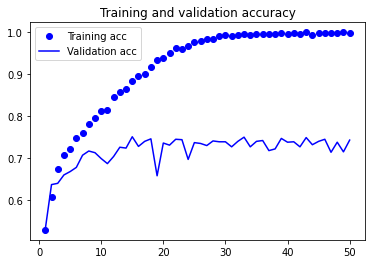

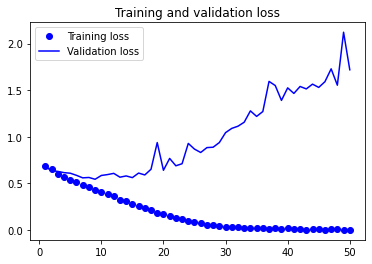

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1,len(acc)+1)

plt.plot(epochs, acc, 'bo', label = 'Training acc')
plt.plot(epochs, val_acc,'b', label = 'Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label = 'Training loss')
plt.plot(epochs, val_loss,'b', label = 'Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
!nvidia-smi

Wed Nov 16 06:55:14 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   78C    P0    33W /  70W |   2938MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# 데이터 증식 (augmentation)

참고 : https://m.blog.naver.com/PostView.naver?isHttpsRedirect=true&blogId=4u_olion&logNo=221437862590

In [ ]:
datagen = ImageDataGenerator(
    rotation_range = 20, #랜덤하게 사진을 회전시킬 각도 (0~180도)
    width_shift_range = 0.1, #수평으로 랜덤하게 평행이동 시킬 범위
    height_shift_range = 0.1, #수직으로 랜덤하게 평행이동 시킬 범위
    shear_range = 0.1, #랜덤하게 전단 변환(shearing transformation)을 적용할 각도 범위 / 참고 : https://playground10.tistory.com/70
    zoom_range = 0.1, #랜덤하게 사진을 확대할 범위
    horizontal_flip = True, #랜덤하게 이미지를 수평으로 뒤집는다. 수평 대칭을 가정할 수 잇을 때 사용(ex, 풍경/인물)
    fill_mode = 'nearest' # 회전이나 가로/세로 이동으로 인해 새롭게 생성해야 할 픽셀을 채울 전략.
)

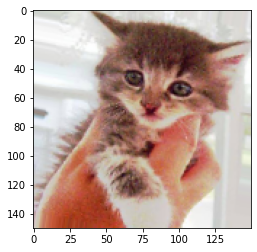

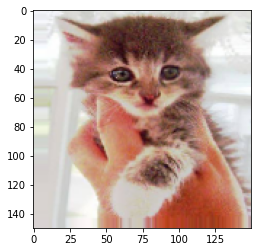

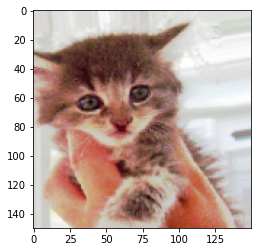

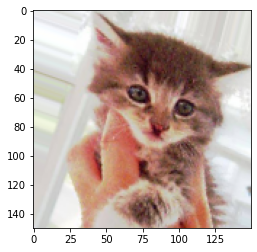

In [ ]:
#랜덤하게 증식된 훈련 이미지 그리기
from tensorflow.keras.utils import load_img, img_to_array,array_to_img
import matplotlib.pyplot as plt

fnames = sorted([os.path.join(train_cats_dir,fname) for fname in os.listdir(train_cats_dir)])
img_path = fnames[3]

img = load_img(img_path, target_size = (150,150)) # 이미지 읽고 크기를 변경.

x = img_to_array(img) #(150,150,3) 크기의 넘파이 배열로 변환.
x = x.reshape((1,)+x.shape) #(1,150,150,3)크기로 변환
i=0

#랜덤하게 변환됨 이미지 배치를 생성
#무한 반복되기 때무에 어느시점에서 중짐.
for batch in datagen.flow(x,batch_size=1):
  plt.figure(i)
  imgplot = plt.imshow(array_to_img(batch[0]))
  i +=1
  if i %4 ==0:
    break
plt.show()

In [ ]:
from keras import layers, models
from tensorflow.keras.optimizers import Adam


model = models.Sequential()
model.add(layers.Conv2D(32,(3,3),activation = 'relu', input_shape=(150,150,3)))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Conv2D(64,(3,3),activation = 'relu'))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Conv2D(128,(3,3),activation = 'relu'))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Conv2D(128,(3,3),activation = 'relu'))
model.add(layers.MaxPool2D(pool_size=(2,2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512,activation = 'relu'))
model.add(layers.Dense(1,activation = 'sigmoid'))

model.summary()
model.compile(loss = 'binary_crossentropy', optimizer= Adam(), metrics = ['acc'])

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 74, 74, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 36, 36, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 17, 17, 128)     

In [ ]:
train_datagen = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 40, #랜덤하게 사진을 회전시킬 각도 (0~180도)
    width_shift_range = 0.2, #수평으로 랜덤하게 평행이동 시킬 범위
    height_shift_range = 0.2, #수직으로 랜덤하게 평행이동 시킬 범위
    shear_range = 0.2, #랜덤하게 전단 변환(shearing transformation)을 적용할 각도 범위 / 참고 : https://playground10.tistory.com/70
    zoom_range = 0.2, #랜덤하게 사진을 확대할 범위
    horizontal_flip = True, #랜덤하게 이미지를 수평으로 뒤집는다. 수평 대칭을 가정할 수 잇을 때 사용(ex, 풍경/인물)
    )
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir, #타깃 디렉터리
    target_size = (150,150), #모든 이미지 150X150으로 만듬
    batch_size = 32,
    class_mode = 'binary' #loss = binary_crossentropy ->이진 레이블이 필요함.
)

validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size = (150,150), #모든 이미지 150X150으로 만듬
    batch_size = 32,
    class_mode = 'binary' #loss = binary_crossentropy ->이진 레이블이 필요함.
)
batch_size = 32
history = model.fit_generator(
    train_generator,
    steps_per_epoch = len(train_generator),
    epochs = 100,
    validation_data= validation_generator,
    validation_steps = len(validation_generator))

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:31: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/100
63/63 [==============================] - 20s 309ms/step - loss: 0.6898 - acc: 0.5205 - val_loss: 0.6573 - val_acc: 0.6170
Epoch 2/100
63/63 [==============================] - 19s 303ms/step - loss: 0.6889 - acc: 0.5330 - val_loss: 0.6790 - val_acc: 0.5010
Epoch 3/100
63/63 [==============================] - 20s 315ms/step - loss: 0.6725 - acc: 0.5525 - val_loss: 0.6731 - val_acc: 0.5560
Epoch 4/100
63/63 [==============================] - 17s 276ms/step - loss: 0.6743 - acc: 0.5625 - val_loss: 0.6756 - val_acc: 0.5500
Epoch 5/100
63/63 [==============================] - 18s 280ms/step - loss: 0.6722 - acc: 0.5525 - val_loss: 0.6942 - val_acc: 0.5000
Epoch 6/100
63/63 [==============================] - 18s 281ms/step - loss: 0.6934 - acc: 0.5050 - val_loss: 0.6927 - val_acc: 0.5010
Epoch 7/100
63/63 [==============================] - 19s 304ms/step - loss: 0.6916 - acc: 0.5065 - val_loss: 0.6886 - val_acc: 0.5780
Epoch 8/100
63/63 [==============================] - 18s 281ms

In [ ]:
model.save('cats_and_dogs_small_2.h5')

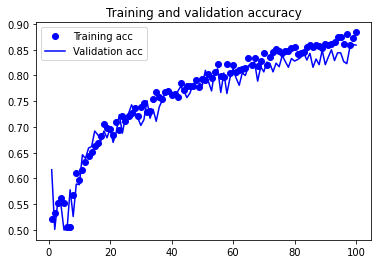

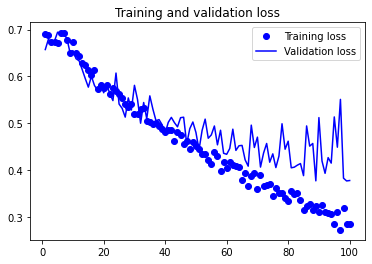

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1,len(acc)+1)

plt.plot(epochs, acc, 'bo', label = 'Training acc')
plt.plot(epochs, val_acc,'b', label = 'Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label = 'Training loss')
plt.plot(epochs, val_loss,'b', label = 'Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

# 사전 훈련된 컨브넷 사용

- pretrained network : 대규모 이미지 분류 문제를 위해 대량의 데이터셋에서 미리 훈련되어 저장된 네트워크.

- 사전 훈련된 네트워크는 일반적으로 대규모 이미지 분류 문제를 위해 대량의 데이터셋에서 미리 훈련되어 저장된 네트워크이다. 원본 데이터셋이 충분히 크고 일반적이라면 사전 훈련된 네트워크에 의해 학습된 특성의 계층 구조는 실제 세상에 대한 일반적인 모델로 효율적인 역할을 할 수 있다. 새로운 문제가 원래 작업과 완전히 다른 클래스에 대한 것이더라도 이런 특성은 많은 컴퓨터 비전 문제에 유용하다. 예를 들어 동물과 생활 용품이 같이 있는 이미지 데이터셋에 훈련된 네트워크라면, 이 네트워크를 가지고 가구 아이템을 식별하는 등의 다른 용도로 사용할 수 있다.

모델 참고 : https://www.tensorflow.org/api_docs/python/tf/keras/applications

<img src = 'https://camo.githubusercontent.com/2de162f6f3587a0422389355909594413ae17742/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f626f6f6b2e6b657261732e696f2f696d672f6368352f7377617070696e675f66635f636c61737369666965722e706e67'>

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16

conv_base = VGG16(weights = 'imagenet', #weights : 모델을 초기화할 가중치 체크포인트
                  include_top = False, # 네트워크의 최상위 연결 분류기를 포함활지 안할지 지정 (기본값은 imageNet의 클래스 1,000개에 대응되는 완전 분류기를 포함)
                  #별도의 (강아지와 고양이 2개의 클래스를 구분하는 완전 연결층을 추가하려고 하므로, 이를 포함하지 않음.)
                  input_shape = (150,150,3))

58889256/58889256 [==============================] - 0s 0us/step


VGG16 함수에 세 개의 매개변수를 전달합니다:

- weights는 모델을 초기화할 가중치 체크포인트를 지정합니다.
- include_top은 네트워크의 최상위 완전 연결 분류기를 포함할지 안할지를 지정합니다. 기본값은 ImageNet의 1,000개의 클래스에 대응되는 완전 연결 분류기를 포함합니다. 별도의 (강아지와 고양이 두 개의 클래스를 구분하는) 완전 연결 층을 추가하려고 하므로 이를 포함시키지 않습니다.
-  input_shape은 네트워크에 주입할 이미지 텐서의 크기입니다. 이 매개변수는 선택사항입니다. 이 값을 지정하지 않으면 네트워크가 어떤 크기의 입력도 처리할 수 있습니다.
다음은 VGG16 합성곱 기반층의 자세한 구조입니다. 이 구조는 앞에서 보았던 간단한 컨브넷과 비슷합니다.

- 왜 합성곱 층만 재사용할까요? 완전 연결 분류기도 재사용할 수 있을까요? 일반적으로 권장하지 않습니다. 합성곱 층에 의해 학습된 표현이 더 일반적이어서 재사용 가능하기 때문입니다. 컨브넷의 특성 맵은 사진에 대한 일반적인 컨셉의 존재 여부를 기록한 맵입니다. 그래서 주어진 컴퓨터 비전 문제에 상관없이 유용하게 사용할 수 있습니다. 하지만 분류기에서 학습한 표현은 모델이 훈련된 클래스 집합에 특화되어 있습니다. 분류기는 전체 사진에 어떤 클래스가 존재할 확률에 관한 정보만을 담고 있습니다. 더군다나 완전 연결 층에서 찾은 표현은 더 이상 입력 이미지에 있는 객체의 위치 정보를 가지고 있지 않습니다. 완전 연결 층들은 공간 개념을 제거하지만 합성곱의 특성 맵은 객체의 위치를 고려합니다. 객체의 위치가 중요한 문제라면 완전 연결 층에서 만든 특성은 크게 쓸모가 없습니다.

 

- 특정 합성곱 층에서 추출한 표현의 일반성(그리고 재사용성)의 수준은 모델에 있는 층의 깊이에 달려 있습니다. 모델의 하위 층은 (에지, 색깔, 질감 등과 같이) 지역적이고 매우 일반적인 특성 맵을 추출합니다. 반면 상위 층은 ('강아지 눈'이나 '고양이 귀'와 같이) 좀 더 추상적인 개념을 추출합니다. 만약 새로운 데이터셋이 원본 모델이 훈련한 데이터셋과 많이 다르다면 전체 합성곱 기반층을 사용하는 것보다는 모델의 하위 층 몇 개만 특성 추출에 사용하는 것이 좋습니다.

 

- ImageNet의 클래스 집합에는 여러 종류의 강아지와 고양이를 포함하고 있습니다. 이런 경우 원본 모델의 완전 연결 층에 있는 정보를 재사용하는 것이 도움이 될 것 같습니다. 하지만 새로운 문제의 클래스가 원본 모델의 클래스 집합과 겹치지 않는 좀 더 일반적인 경우를 다루기 위해서 여기서는 완전 연결 층을 사용하지 않겠습니다.

참고 : https://nicola-ml.tistory.com/149

In [ ]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

## 데이터 증식을 사용하지 않은 빠른 특성 추출

ImageDataGenerator를 사용하여 이미지와 레이블을 넘파이 배열로 추출

In [ ]:
#사전 훈련된 합성곱 기반 층을 사용한 특성 추출하기
import os
import numpy as np
from keras.preprocessing.image import ImageDataGenerator

base_dir = '/content/cats_and_dogs_small'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir,'validation')
test_dir = os.path.join(base_dir,'test')

datagen = ImageDataGenerator(rescale = 1./255)
batch_size =20

def extract_features(directory, sample_count):
  features = np.zeros(shape = (sample_count,4,4,512)) #VGG16 최종 output_size = (4,4,512)
  labels = np.zeros(shape = (sample_count))
  generator = datagen.flow_from_directory(
      directory,
      target_size = (150,150),
      batch_size = batch_size,
      class_mode = 'binary')
  i=0
  for inputs_batch, labels_batch in generator:
    features_batch = conv_base.predict(inputs_batch)
    features[i*batch_size : (i+1) *batch_size] = features_batch
    labels[i*batch_size : (i+1) * batch_size] = labels_batch
    i +=1
    if i*batch_size >=sample_count:
      break #제너레이터는 루프 안에서 무한하게 데이터를 만들어 내므로, 모든 이미지를 한 번씩 처리하면 중지.
    return features,labels

In [ ]:
train_features, train_labels = extract_features(train_dir,2000)
validation_features, validation_labels = extract_features(validation_dir,1000)
test_features, test_labels = extract_features(test_dir,1000)

Found 2000 images belonging to 2 classes.
1/1 [==============================] - 7s 7s/step
Found 1000 images belonging to 2 classes.
1/1 [==============================] - 8s 8s/step
Found 1000 images belonging to 2 classes.
1/1 [==============================] - 4s 4s/step


추출괸 특성의 크기는 (samples,4,4,512)이다.

완전 연결 분류기에 주입하기 위해서는 먼저 (samples,8912)로 펼침

In [ ]:
train_features = np.reshape(train_features,(2000,4*4*512))
validation_features = np.reshape(validation_features,(1000,4*4*512))
test_features = np.reshape(test_features,(1000,4*4*512))

In [ ]:
train_features.shape

(2000, 8192)

In [ ]:
#완전 연결 분류기를 정의하고 훈련
from keras import layers, models

model = models.Sequential()
model.add(layers.Dense(256,activation = 'relu', input_dim = 4*4*512))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1,activation = 'sigmoid'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               2097408   
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 257       
                                                                 
Total params: 2,097,665
Trainable params: 2,097,665
Non-trainable params: 0
_________________________________________________________________


In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(loss = 'binary_crossentropy', optimizer= RMSprop(lr=2e-5), metrics = ['acc'])

/usr/local/lib/python3.7/dist-packages/keras/optimizers/optimizer_v2/rmsprop.py:135: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
history = model.fit(train_features,train_labels,
                    epochs = 100,
                    batch_size = 20,
                    validation_data = (validation_features,validation_labels))

Epoch 1/100
100/100 [==============================] - 6s 48ms/step - loss: 0.6937 - acc: 0.9945 - val_loss: 0.6892 - val_acc: 0.9910
Epoch 2/100
100/100 [==============================] - 6s 57ms/step - loss: 0.6847 - acc: 0.9955 - val_loss: 0.6825 - val_acc: 0.9910
Epoch 3/100
100/100 [==============================] - 4s 38ms/step - loss: 0.6781 - acc: 0.9960 - val_loss: 0.6751 - val_acc: 0.9920
Epoch 4/100
100/100 [==============================] - 3s 30ms/step - loss: 0.6695 - acc: 0.9995 - val_loss: 0.6677 - val_acc: 0.9930
Epoch 5/100
100/100 [==============================] - 2s 22ms/step - loss: 0.6616 - acc: 0.9985 - val_loss: 0.6610 - val_acc: 0.9920
Epoch 6/100
100/100 [==============================] - 2s 22ms/step - loss: 0.6541 - acc: 0.9990 - val_loss: 0.6536 - val_acc: 0.9920
Epoch 7/100
100/100 [==============================] - 2s 23ms/step - loss: 0.6467 - acc: 0.9990 - val_loss: 0.6455 - val_acc: 0.9920
Epoch 8/100
100/100 [==============================] - 2s 23ms

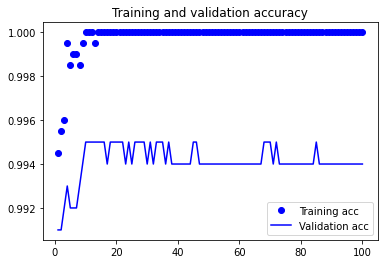

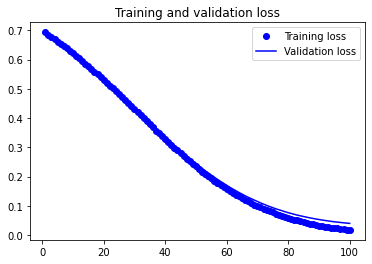

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1,len(acc)+1)

plt.plot(epochs, acc, 'bo', label = 'Training acc')
plt.plot(epochs, val_acc,'b', label = 'Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label = 'Training loss')
plt.plot(epochs, val_loss,'b', label = 'Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [ ]:
from keras import models,layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256,activation = 'relu'))
model.add(layers.Dense(1,activation = 'sigmoid'))

In [ ]:
model.build(input_shape = (None,150,150,3))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense_2 (Dense)             (None, 256)               2097408   
                                                                 
 dense_3 (Dense)             (None, 1)                 257       
                                                                 
Total params: 16,812,353
Trainable params: 9,177,089
Non-trainable params: 7,635,264
_________________________________________________________________


모델을 컴파일하고 훈련하기 전에 합성곱 기반층을 동결하는 것이 아주 중요.하나 이상의 층을 동결한다는 것은 훈련 동안 가중치 업데이트되지 않도록 막음. 이렇게 하지 않으면 합성곱 기반층에 의해 사전에 학습된 표현이 훈련하는 동안 수정될 것 이다.

In [ ]:
print('conv_base 를 동결하기 전 훈련되는 가중치의 수',len(model.trainable_weights))

conv_base 를 동결하기 전 훈련되는 가중치의 수 10


In [ ]:
conv_base.trainable = False

In [ ]:
print('conv_base 를 동결한후 훈련되는 가중치의 수',len(model.trainable_weights))

conv_base 를 동결한후 훈련되는 가중치의 수 4


In [ ]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

In [ ]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.1,
      height_shift_range=0.1,
      shear_range=0.1,
      zoom_range=0.1,
      horizontal_flip=True,
      fill_mode='nearest')

In [ ]:
# 검증 데이터는 증식되어서는 안 됩니다!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # 타깃 디렉터리
        train_dir,
        # 모든 이미지의 크기를 150 × 150로 변경합니다
        target_size=(150, 150),
        batch_size=20,
        # binary_crossentropy 손실을 사용하므로 이진 레이블이 필요합니다
        class_mode='binary')

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=2e-5),
              metrics=['acc'])

history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=30,
      validation_data=validation_generator,
      validation_steps=50,
      verbose=1) #ETA : estimated time of arrival

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.


Epoch 1/30
100/100 [==============================] - 725s 7s/step - loss: 0.4929 - acc: 0.7945 - val_loss: 0.3877 - val_acc: 0.8530
Epoch 2/30
100/100 [==============================] - 707s 7s/step - loss: 0.3842 - acc: 0.8375 - val_loss: 0.3324 - val_acc: 0.8660
Epoch 3/30
100/100 [==============================] - 711s 7s/step - loss: 0.3519 - acc: 0.8580 - val_loss: 0.3039 - val_acc: 0.8780
Epoch 4/30
100/100 [==============================] - 710s 7s/step - loss: 0.3237 - acc: 0.8595 - val_loss: 0.2798 - val_acc: 0.8880
Epoch 5/30
100/100 [==============================] - 708s 7s/step - loss: 0.2944 - acc: 0.8855 - val_loss: 0.2685 - val_acc: 0.8950
Epoch 6/30
100/100 [==============================] - 709s 7s/step - loss: 0.2909 - acc: 0.8740 - val_loss: 0.2642 - val_acc: 0.8910
Epoch 7/30
100/100 [==============================] - 705s 7s/step - loss: 0.2764 - acc: 0.8895 - val_loss: 0.2534 - val_acc: 0.8950
Epoch 8/30
100/100 [==============================] - 707s 7s/step - 

KeyboardInterrupt: ignored

In [ ]:
model.save('cats_and_dogs_small_3.h5')

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

#미세 조정
<img src = 'https://camo.githubusercontent.com/28a6cb7048317aba34f39cb02f15520708189008/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f626f6f6b2e6b657261732e696f2f696d672f6368352f76676731365f66696e655f74756e696e672e706e67'>

앞서 랜덤하게 초기화된 상단 분류기를 훈련하기 위해 VGG16의 합성곱 기반층을 동결해야 한다고 말했습니다. 같은 이유로 맨 위에 있는 분류기가 훈련된 후에 합성곱 기반의 상위 층을 미세 조정할 수 있습니다. 분류기가 미리 훈련되지 않으면 훈련되는 동안 너무 큰 오차 신호가 네트워크에 전파됩니다. 이는 미세 조정될 층들이 사전에 학습한 표현들을 망가뜨리게 될 것입니다. 네트워크를 미세 조정하는 단계는 다음과 같습니다:

1. 사전에 훈련된 기반 네트워크 위에 새로운 네트워크를 추가합니다.
2. 기반 네트워크를 동결합니다.
3. 새로 추가한 네트워크를 훈련합니다.
4. 기반 네트워크에서 일부 층의 동결을 해제합니다.
5. 동결을 해제한 층과 새로 추가한 층을 함께 훈련합니다.
6. 처음 세 단계는 특성 추출을 할 때 이미 완료했습니다. 네 번째 단계를 진행해 보죠. conv_base의 동결을 해제하고 개별 층을 동결하겠습니다.

기억을 되살리기 위해 합성곱 기반층의 구조를 다시 확인해 보겠습니다:

In [ ]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

마지막 세 개의 합성곱 층을 미세 조정하겠습니다. 즉, block4_pool까지 모든 층은 동결되고 block5_conv1, block5_conv2, block5_conv3 층은 학습 대상이 됩니다.

왜 더 많은 층을 미세 조정하지 않을까요? 왜 전체 합성곱 기반층을 미세 조정하지 않을까요? 그렇게 할 수도 있지만 다음 사항을 고려해야 합니다:

- 합성곱 기반층에 있는 하위 층들은 좀 더 일반적이고 재사용 가능한 특성들을 인코딩합니다. 반면 상위 층은 좀 더 특화된 특성을 인코딩합니다. 새로운 문제에 재활용하도록 수정이 필요한 것은 구체적인 특성이므로 이들을 미세 조정하는 것이 유리합니다. 하위 층으로 갈수록 미세 조정에 대한 효과가 감소합니다.
- 훈련해야 할 파라미터가 많을수록 과대적합의 위험이 커집니다. 합성곱 기반층은 1천 5백만 개의 파라미터를 가지고 있습니다. 작은 데이터셋으로 전부 훈련하려고 하면 매우 위험합니다.
그러므로 이런 상황에서는 합성곱 기반층에서 최상위 두 세개의 층만 미세 조정하는 것이 좋습니다.

앞선 예제 코드에 이어서 미세 조정을 설정해보죠:

In [ ]:
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block5_conv1':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

이제 네트워크의 미세 조정을 시작하겠습니다. 학습률을 낮춘 RMSProp 옵티마이저를 사용합니다. 학습률을 낮추는 이유는 미세 조정하는 세 개의 층에서 학습된 표현을 조금씩 수정하기 위해서입니다. 변경량이 너무 크면 학습된 표현에 나쁜 영향을 끼칠 수 있습니다.

미세 조정을 진행해 보죠:

In [ ]:
model.compile(loss='binary_crossentropy',
              optimizer=RMSprop(lr=1e-5),
              metrics=['acc'])

history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=100,
      validation_data=validation_generator,
      validation_steps=50)

NameError: ignored

In [ ]:
model.save('cats_and_dogs_small_4.h5')

In [ ]:
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

NameError: ignored

그래프가 불규칙하게 보입니다. 그래프를 보기 쉽게하기 위해 지수 이동 평균으로 정확도와 손실 값을 부드럽게 표현할 수 있습니다. 다음은 지수 이동 평균을 구하기 위한 간단한 함수입니다:

In [ ]:
def smooth_curve(points, factor=0.8):
  smoothed_points = []
  for point in points:
    if smoothed_points:
      previous = smoothed_points[-1]
      smoothed_points.append(previous * factor + point * (1 - factor))
    else:
      smoothed_points.append(point)
  return smoothed_points

plt.plot(epochs,
         smooth_curve(acc), 'bo', label='Smoothed training acc')
plt.plot(epochs,
         smooth_curve(val_acc), 'b', label='Smoothed validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs,
         smooth_curve(loss), 'bo', label='Smoothed training loss')
plt.plot(epochs,
         smooth_curve(val_loss), 'b', label='Smoothed validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

NameError: ignored

검증 정확도 곡선이 훨씬 깨끗하게 보입니다. 정확도가 확실히 1% 이상 향상되었습니다.

손실 곡선은 실제 어떤 향상을 얻지 못했습니다(사실 악화되었습니다). 손실히 감소되지 않았는데 어떻게 정확도가 안정되거나 향상될 수 있을까요? 답은 간단합니다. 그래프는 개별적인 손실 값의 평균을 그린 것입니다. 하지만 정확도에 영향을 미치는 것은 손실 값의 분포이지 평균이 아닙니다. 정확도는 모델이 예측한 클래스 확률이 어떤 임계값을 넘었는지에 대한 결과이기 때문입니다. 모델이 더 향상더라도 평균 손실에 반영되지 않을 수 있습니다.

이제 마지막으로 테스트 데이터에서 이 모델을 평가하겠습니다:

In [ ]:
test_generator = test_datagen.flow_from_directory(
        test_dir,
        target_size=(150, 150),
        batch_size=20,
        class_mode='binary')

test_loss, test_acc = model.evaluate_generator(test_generator, steps=50)
print('test acc:', test_acc)

## Convnet의 학습 시각화하기.

딥러닝 모델을 '블랙 박스' 같다고 자주 이야기합니다. 학습된 표현에서 사람이 이해하기 쉬운 형태를 뽑아내거나 제시하기 어렵기 때문입니다. 일부 딥러닝 모델에서는 이 말이 어느정도 맞지만 컨브넷에서는 전혀 아닙니다. 컨브넷의 표현은 시각적인 개념을 학습한 것이기 때문에 시각화하기 아주 좋습니다. 2013년부터 이런 표현들을 시각화하고 해석하는 다양한 기법들이 개발되었습니다. 여기서 모두를 다룰 수는 없지만 가장 사용이 편하고 유용한 세 가지 기법을 다루겠습니다.

컨브넷 중간 층의 출력(중간 층에 있는 활성화)을 시각화하기 : 연속된 컨브넷층이 입력을 어떻게 변형시키는지 이해하고 개별적인 컨브넷 필터의 의미를 파악하는 데 도움이 됩니다.
컨브넷 필터를 시각화하기 : 컨브넷의 필터가 찾으려는 시각적인 패턴과 개념이 무엇인지 상세하게 이해하는 데 도움이 됩니다.
클래스 활성화에 대한 히트맵을 이미지에 시각화하기 : 이미지의 어느 부분이 주어진 클래스에 속하는 데 기여했는지 이해하고 이미지에서 객체의 위치를 추정하는 데 도움이 됩니다.
첫 번째 방법인 활성화 출력을 시각화하는 기법을 위해서 5.2절에 있는 강아지 vs. 고양이 분류 문제에서 처음부터 훈련시킨 작은 컨브넷을 사용하겠습니다. 다른 두 가지 방법을 위해서는 5.3절에 소개된 VGG16 모델을 사용하겠습니다.

중간 층의 활성화 시각화하기
중간 층의 활성화 시각화는 어떤 입력이 주어졌을 때 네트워크에 있는 여러 합성곱과 풀링 층이 출력하는 특성 맵을 그리는 것입니다(층의 출력이 활성화 함수의 출력이라서 종종 활성화(activation)라고 부릅니다). 이 방법은 네트워크에의해 학습된 필터들이 어떻게 입력을 분해하는지 보여줍니다. 넓이, 높이, 깊이(채널)의 세 개 차원에 대해 특성 맵을 시각화하는 것이 좋습니다. 각 채널은 비교적 독립적인 특성을 인코딩하므로 특성 맵의 각 채널 내용을 독립적인 2D 이미지로 그리는 것이 괜찮은 방법입니다. 5.2절에서 저장했던 모델을 로드하여 시작해 보죠:

In [ ]:
from keras.models import load_model

model = load_model('cats_and_dogs_small_2.h5')
model.summary()  # 기억을 되살리기 위해서 모델 구조를 출력합니다

In [ ]:
img_path = '/content/cats_and_dogs_small/test/cats/cat.1700.jpg'

# 이미지를 4D 텐서로 변경합니다
from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
# 모델이 훈련될 때 입력에 적용한 전처리 방식을 동일하게 사용합니다
img_tensor /= 255.

# 이미지 텐서의 크기는 (1, 150, 150, 3)입니다
print(img_tensor.shape)

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(img_tensor[0])
plt.show()

확인하고 싶은 특성 맵을 추출하기 위해 이미지 배치를 입력으로 받아 모든 합성곱과 풀링 층의 활성화를 출력하는 케라스 모델을 만들 것입니다. 이를 위해 케라스의 Model 클래스를 사용하겠습니다. 모델 인스턴스를 만들 때 두 개의 매개변수가 필요합니다. 입력 텐서(또는 입력 텐서의 리스트)와 출력 텐서(또는 출력 텐서의 리스트)입니다.

In [ ]:
from keras import models

# 상위 8개 층의 출력을 추출합니다:
layer_outputs = [layer.output for layer in model.layers[:8]]
# 입력에 대해 8개 층의 출력을 반환하는 모델을 만듭니다:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

입력 이미지가 주입될 때 이 모델은 원본 모델의 활성화 값을 반환합니다. 이 모델이 이 책에서는 처음 나오는 다중 출력 모델입니다. 지금까지 본 모델은 정확히 하나의 입력과 하나의 출력만을 가졌습니다. 일반적으로 모델은 몇 개의 입력과 출력이라도 가질 수 있습니다. 이 모델은 하나의 입력과 층의 활성화마다 하나씩 총 8개의 출력을 가집니다.

In [ ]:
# 층의 활성화마다 하나씩 8개의 넘파이 배열로 이루어진 리스트를 반환합니다:
activations = activation_model.predict(img_tensor)

예를 들어 다음이 고양이 이미지에 대한 첫 번째 합성곱 층의 활성화 값입니다:

In [ ]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

32개의 채널을 가진 148 × 148 크기의 특성 맵입니다. 원본 모델의 첫 번째 층의 활성화 중에서 스무 번째 채널을 그려 보겠습니다:

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 19], cmap='viridis')
plt.show()

이 채널은 대각선 에지를 감지하도록 인코딩된 것 같습니다. 열여섯 번째 채널을 그려보죠. 합성곱 층이 학습한 필터는 결정적이지 않기 때문에 채널 이미지가 각자 다를 수 있습니다.

In [ ]:
plt.matshow(first_layer_activation[0, :, :, 15], cmap='viridis')
plt.show()

이 채널은 '밝은 녹색 점'을 감지하는 것 같아 고양이 눈을 인코딩하기 좋습니다. 이제 네트워크의 모든 활성화를 시각화해 보겠습니다. 8개의 활성화 맵에서 추출한 모든 채널을 그리기 위해 하나의 큰 이미지 텐서에 추출한 결과를 나란히 쌓겠습니다.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


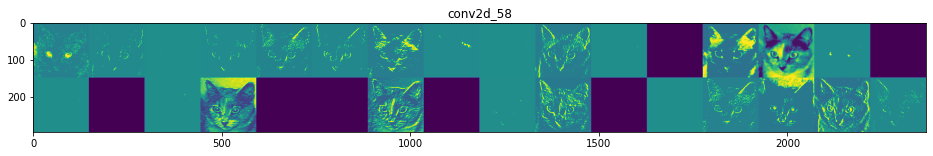

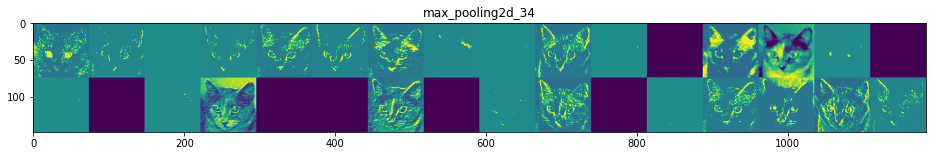

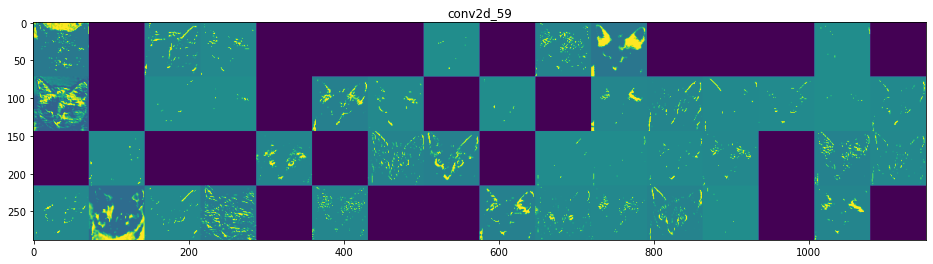

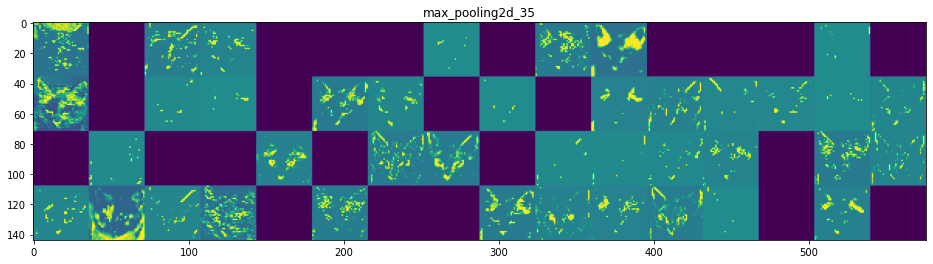

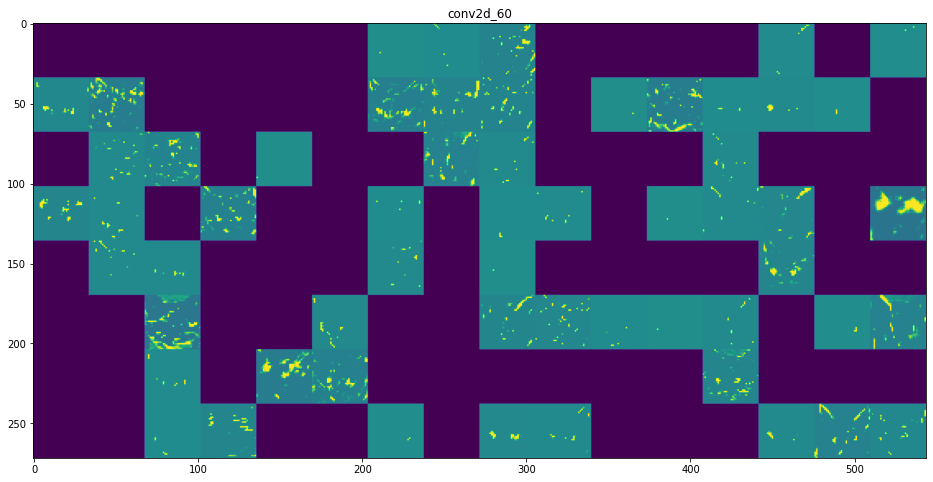

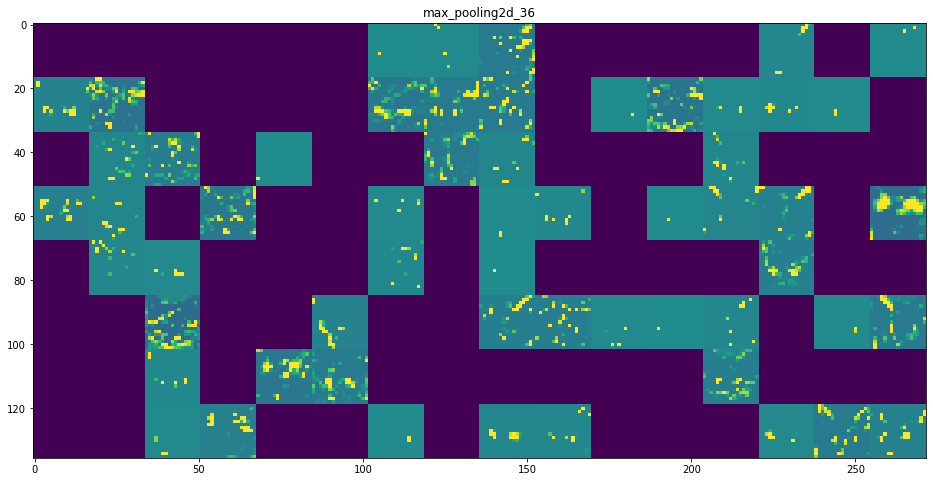

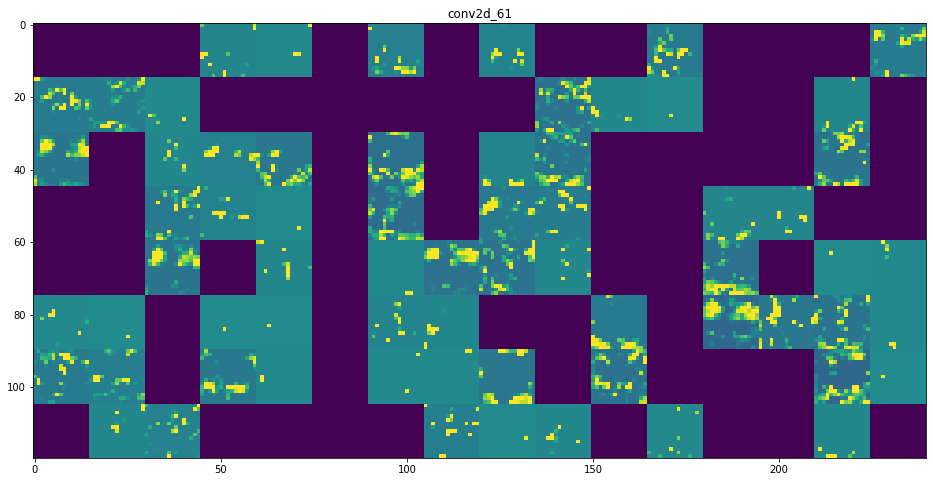

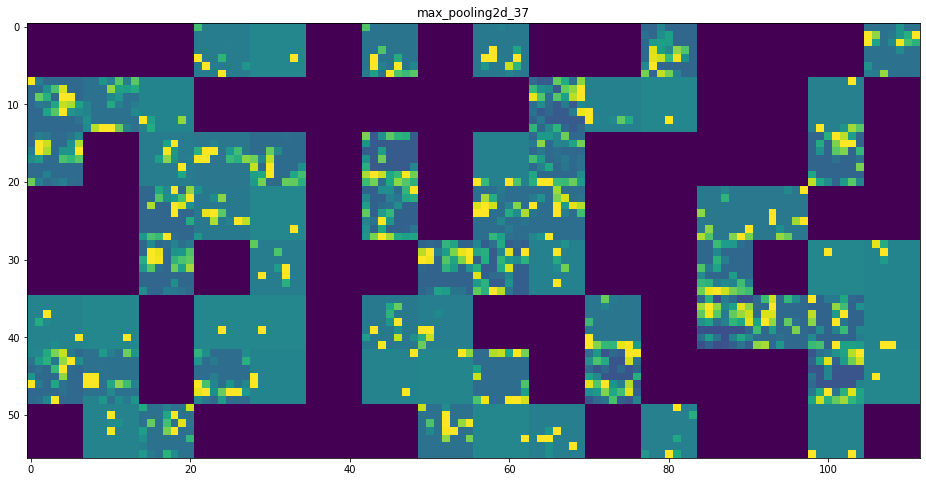

In [ ]:
# 층의 이름을 그래프 제목으로 사용합니다
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# 특성 맵을 그립니다
for layer_name, layer_activation in zip(layer_names, activations):
    # 특성 맵에 있는 특성의 수
    n_features = layer_activation.shape[-1]

    # 특성 맵의 크기는 (1, size, size, n_features)입니다
    size = layer_activation.shape[1]

    # 활성화 채널을 위한 그리드 크기를 구합니다
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 활성화를 하나의 큰 그리드에 채웁니다
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # 그래프로 나타내기 좋게 특성을 처리합니다
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 그리드를 출력합니다
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

몇 가지 주목할 내용이 있습니다:

첫 번째 층은 여러 종류의 에지 감지기를 모아 놓은 것 같습니다. 이 단계의 활성화에는 초기 사진에 있는 거의 모든 정보가 유지됩니다.
상위 층으로 갈수록 활성화는 점점 더 추상적으로 되고 시각적으로 이해하기 어려워집니다. '고양이 귀'와 '고양이 눈'과 같이 고수준의 개념을 인코딩하기 시작합니다. 상위 층의 표현은 이미지의 시각적 콘텐츠에 관한 정보가 점점 줄어들고 이미지의 클래스에 관한 정보가 점점 증가합니다.
비어 있는 활성화가 층이 깊어짐에 따라 늘어납니다. 첫 번째 층에서는 모든 필터가 입력 이미지에 활성화되었지만 층을 올라가면서 활성화되지 않는 필터들이 생깁니다. 필터에 인코딩된 패턴이 입력 이미지에 나타나지 않았다는 것을 의미입니다.
심층 신경망이 학습한 표현에서 일반적으로 나타나는 중요한 특징을 조금 전 확인했습니다. 층에서 추출한 특성은 층의 깊이를 따라 점점 더 추상적이 됩니다. 높은 층의 활성화는 특정 입력에 관한 시각적 정보가 점점 줄어들고 타깃에 관한 정보(이 경우에는 강아지 또는 고양이 이미지의 클래스)가 점점 더 증가합니다. 심층 신경망은 입력되는 원본 데이터(여기서는 RGB 포맷의 사진)에 대한 정보 정제 파이프라인처럼 작동합니다. 반복적인 변환을 통해 관계없는 정보(예를 들어 이미지에 있는 특정 요소)를 걸러내고 유용한 정보는 강조되고 개선됩니다(여기에서는 이미지의 클래스).

사람과 동물이 세상을 인지하는 방식이 이와 비슷합니다. 사람은 몇 초동안 한 장면을 보고 난 후에 그 안에 있었던 추상적인 물체(자전거, 나무)를 기억할 수 있습니다. 하지만 이 물체의 구체적인 모양을 기억하지 못합니다. 사실 기억을 더듬어 일반적인 자전거를 그려보면 평생 수천 개의 자전거를 보았더라도 조금이라도 비슷하게 그릴 수 없습니다. 실제로 한 번 해보면 진짜 그런지 알 수 있습니다. 우리의 뇌는 시각적 입력에서 관련성이 적은 요소를 필터링하여 고수준의 개념으로 변환합니다. 이렇게 완전히 추상적으로 학습하기 때문에 눈으로 본 것을 자세히 기억하기는 매우 어렵습니다.

### 컨브넷 필터 시각화
컨브넷이 학습한 필터를 조사하는 또 다른 간편한 방법은 각 필터가 반응하는 시각적 패턴을 그려보는 것입니다. 빈 입력 이미지에서 시작해서 특정 필터의 응답을 최대화하기 위해 컨브넷 입력 이미지에 경사 상승법을 적용합니다. 결과적으로 입력 이미지는 선택된 필터가 최대로 응답하는 이미지가 될 것입니다.

전체 과정은 간단합니다. 특정 합성곱 층의 한 필터의 값을 최대화하는 손실 함수를 정의합니다. 이 활성화 값을 최대화하기 위해 입력 이미지를 변경하도록 확률적 경사 상승법을 사용합니다. 예를 들어 여기에서는 ImageNet에 사전 훈련된 VGG16 네트워크에서 block3_conv1 층의 필터 0번의 활성화를 손실로 정의합니다:

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras

# The dimensions of our input image
img_width = 180
img_height = 180
# Our target layer: we will visualize the filters from this layer.
# See `model.summary()` for list of layer names, if you want to change this.
layer_name = "block3_conv1"

In [ ]:
# Build a VGG16 model loaded with pre-trained ImageNet weights
model = keras.applications.VGG16(weights="imagenet", include_top=False)

# Set up a model that returns the activation values for our target layer
layer = model.get_layer(name=layer_name)
feature_extractor = keras.Model(inputs=model.inputs, outputs=layer.output)

In [ ]:
def compute_loss(input_image, filter_index):
    activation = feature_extractor(input_image)
    # We avoid border artifacts by only involving non-border pixels in the loss.
    filter_activation = activation[:, 2:-2, 2:-2, filter_index]
    return tf.reduce_mean(filter_activation)

In [ ]:
@tf.function
def gradient_ascent_step(img, filter_index, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img, filter_index)
    # Compute gradients.
    grads = tape.gradient(loss, img)
    # Normalize gradients.
    grads = tf.math.l2_normalize(grads)
    img += learning_rate * grads
    return loss, img

In [ ]:
def initialize_image():
    # We start from a gray image with some random noise
    img = tf.random.uniform((1, img_width, img_height, 3))
    # ResNet50V2 expects inputs in the range [-1, +1].
    # Here we scale our random inputs to [-0.125, +0.125]
    return (img - 0.5) * 0.25


def visualize_filter(filter_index):
    # We run gradient ascent for 20 steps
    iterations = 30
    learning_rate = 10.0
    img = initialize_image()
    for iteration in range(iterations):
        loss, img = gradient_ascent_step(img, filter_index, learning_rate)

    # Decode the resulting input image
    img = deprocess_image(img[0].numpy())
    return loss, img


def deprocess_image(img):
    # Normalize array: center on 0., ensure variance is 0.15
    img -= img.mean()
    img /= img.std() + 1e-5
    img *= 0.15

    # Center crop
    img = img[25:-25, 25:-25, :]

    # Clip to [0, 1]
    img += 0.5
    img = np.clip(img, 0, 1)

    # Convert to RGB array
    img *= 255
    img = np.clip(img, 0, 255).astype("uint8")
    return img

In [ ]:
from IPython.display import Image, display

loss, img = visualize_filter(0)
keras.preprocessing.image.save_img("0.png", img)

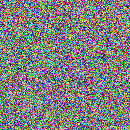

In [ ]:
display(Image("0.png"))

Processing filter 0
Processing filter 1
Processing filter 2
Processing filter 3
Processing filter 4
Processing filter 5
Processing filter 6
Processing filter 7
Processing filter 8
Processing filter 9
Processing filter 10
Processing filter 11
Processing filter 12
Processing filter 13
Processing filter 14
Processing filter 15
Processing filter 16
Processing filter 17
Processing filter 18
Processing filter 19
Processing filter 20
Processing filter 21
Processing filter 22
Processing filter 23
Processing filter 24
Processing filter 25
Processing filter 26
Processing filter 27
Processing filter 28
Processing filter 29
Processing filter 30
Processing filter 31
Processing filter 32
Processing filter 33
Processing filter 34
Processing filter 35
Processing filter 36
Processing filter 37
Processing filter 38
Processing filter 39
Processing filter 40
Processing filter 41
Processing filter 42
Processing filter 43
Processing filter 44
Processing filter 45
Processing filter 46
Processing filter 47
Pr

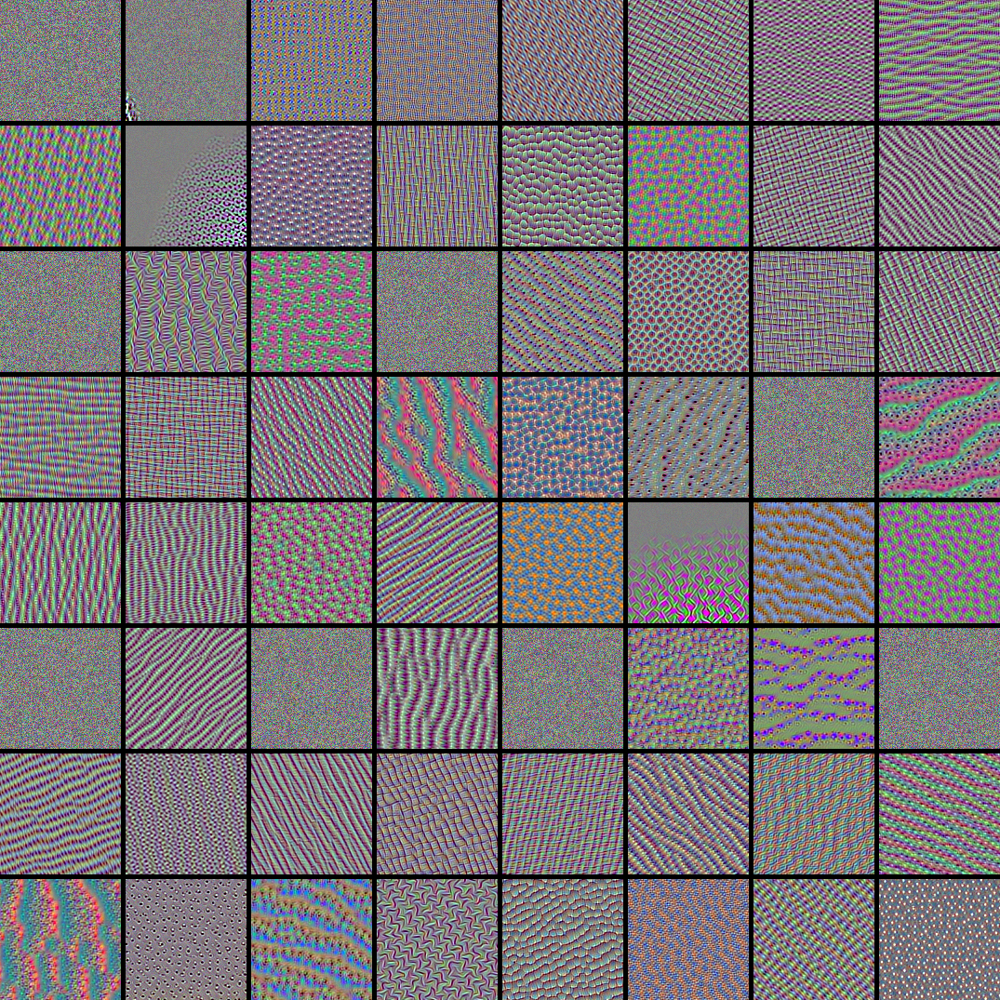

In [ ]:
# Compute image inputs that maximize per-filter activations
# for the first 64 filters of our target layer
all_imgs = []
for filter_index in range(64):
    print("Processing filter %d" % (filter_index,))
    loss, img = visualize_filter(filter_index)
    all_imgs.append(img)

# Build a black picture with enough space for
# our 8 x 8 filters of size 128 x 128, with a 5px margin in between
margin = 5
n = 8
cropped_width = img_width - 25 * 2
cropped_height = img_height - 25 * 2
width = n * cropped_width + (n - 1) * margin
height = n * cropped_height + (n - 1) * margin
stitched_filters = np.zeros((width, height, 3))

# Fill the picture with our saved filters
for i in range(n):
    for j in range(n):
        img = all_imgs[i * n + j]
        stitched_filters[
            (cropped_width + margin) * i : (cropped_width + margin) * i + cropped_width,
            (cropped_height + margin) * j : (cropped_height + margin) * j
            + cropped_height,
            :,
        ] = img
keras.preprocessing.image.save_img("stiched_filters.png", stitched_filters)

from IPython.display import Image, display

display(Image("stiched_filters.png"))

이런 필터 시각화를 통해 컨브넷 층이 바라보는 방식을 이해할 수 있습니다. 컨브넷의 각 층은 필터의 조합으로 입력을 표현할 수 있는 일련의 필터를 학습합니다. 이는 푸리에 변환을 사용해 신호를 일련의 코사인 함수로 분해할 수 있는 것과 비슷합니다. 이 컨브넷 필터들은 모델의 상위 층으로 갈수록 점점 더 복잡해지고 개선됩니다.

모델에 있는 첫 번째 층(block1_conv1)의 필터는 간단한 대각선 방향의 에지와 색깔(또는 어떤 경우에 색깔이 있는 에지)을 인코딩합니다.
block2_conv1의 필터는 에지나 색깔의 조합으로 만들어진 간단한 질감을 인코딩합니다.
더 상위 층의 필터는 깃털, 눈, 나뭇잎 등과 같은 자연적인 이미지에서 찾을 수 있는 질감을 닮아가기 시작합니다.
클래스 활성화의 히트맵 시각화하기
한 가지 시각화 기법을 더 소개하겠습니다. 이 방법은 이미지의 어느 부분이 컨브넷의 최종 분류 결정에 기여하는지 이해하는 데 유용합니다. 분류에 실수가 있는 경우 컨브넷의 결정 과정을 디버깅하는 데 도움이 됩니다. 또한 이미지에 특정 물체가 있는 위치를 파악하는 데 사용할 수도 있습니다.